## Mhealth (Mobile Health) Raw Dataset

## Brief about our dataset

##### The MHEALTH (Mobile HEALTH) dataset comprises body motion and vital signs recordings for ten volunteers of diverse profile while performing several physical activities. Sensors placed on the subject's right wrist and left ankle are used to measure the motion experienced by diverse body parts, namely, acceleration. 
##### Our dataset contains 12 signals which illustrates the acceleration (velocity/time in one specific direction) and gyro (angular or orientation velocity/time), both of these parameters are measured in x, y, z direction.


#### DATASET SUMMARY
- Activities: 12
- Sensor devices: 2
- Subjects: 10

#### EXPERIMENTAL SETUP

##### The collected dataset comprises body motion and vital signs recordings for ten volunteers of diverse profile while performing 12 physical activities . Our volunteers' wearable sensors were used for the recordings. The sensors were respectively placed on the subject's right wrist and left ankle and attached by using elastic straps. The use of multiple sensors permits us to measure the motion experienced by diverse body parts, namely, the acceleration, thus better capturing the body dynamics. Each session was recorded using a video camera. This dataset is found to generalize to common activities of the daily living, given the diversity of body parts involved in each one (e.g., frontal elevation of arms vs. knees bending), the intensity of the actions (e.g., cycling vs. sitting and relaxing) and their execution speed or dynamicity (e.g., running vs. standing still). The activities were collected in an out-of-lab environment with no constraints on the way these must be executed, with the exception that the subject should try their best when executing them

#### ACTIVITY SET

##### The activity set is listed in the following:

- L1: Standing still (1 min)
- L2: Sitting and relaxing (1 min)
- L3: Lying down (1 min)
- L4: Walking (1 min)
- L5: Climbing stairs (1 min)
- L6: Waist bends forward (20x)
- L7: Frontal elevation of arms (20x)
- L8: Knees bending (crouching) (20x)
- L9: Cycling (1 min)
- L10: Jogging (1 min)
- L11: Running (1 min)
- L12: Jump front & back (20x)
    
##### NOTE: In brackets are the number of repetitions (Nx) or the duration of the exercises (min).

#### Attribute Information:

- alx: acceleration from the left-ankle sensor (X axis)
- aly: acceleration from the left-ankle sensor (Y axis)
- alz: acceleration from the left-ankle sensor (Z axis)
- glx: gyro from the left-ankle sensor (X axis)
- gly: gyro from the left-ankle sensor (Y axis)
- glz: gyro from the left-ankle sensor (Z axis)
- arx: acceleration from the right-lower-arm sensor (X axis)
- ary: acceleration from the right-lower-arm sensor (Y axis)
- arz: acceleration from the right-lower-arm sensor (Z axis)
- grx: gyro from the right-lower-arm sensor (X axis)
- gry: gyro from the right-lower-arm sensor (Y axis)
- grz: gyro from the right-lower-arm sensor (Z axis)
- subject: volunteer number
- Activity: corresponding activity

## Libraries Used

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score,confusion_matrix, mean_absolute_error , r2_score , mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import warnings
warnings.filterwarnings("ignore")
le = LabelEncoder()


## Data Review

In [2]:
# reading data from device
df=pd.read_csv("mhealth_raw_data.csv",sep=",",encoding="utf-8")
df

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
0,2.18490,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.449020,-1.01030,0.034483,0,subject1
1,2.38760,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.449020,-1.01030,0.034483,0,subject1
2,2.40860,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.449020,-1.01030,0.034483,0,subject1
3,2.18140,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.456860,-1.00820,0.025862,0,subject1
4,2.41730,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.456860,-1.00820,0.025862,0,subject1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,0.32374,-9.9511,-1.04640,-0.569570,-0.75422,-0.52456,-6.5886,-10.5290,2.129800,-0.182350,-0.92813,-0.553880,0,subject9
1048571,0.40570,-10.0510,-1.11310,-0.569570,-0.75422,-0.52456,-6.0806,-10.5710,1.877700,-0.182350,-0.92813,-0.553880,0,subject9
1048572,0.48707,-10.0110,-1.09980,-0.593690,-0.75047,-0.53045,-5.3752,-10.0910,1.870400,-0.078431,-0.96509,-0.560340,0,subject9
1048573,0.41283,-9.8038,-1.17360,-0.593690,-0.75047,-0.53045,-4.6322,-9.7003,1.973300,-0.078431,-0.96509,-0.560340,0,subject9


In [3]:
# getting the dataset's rows and columns by invoking the shape() function
df.shape

(1048575, 14)

In [4]:
# getting information about columns using info() function
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 14 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   alx       1048575 non-null  float64
 1   aly       1048575 non-null  float64
 2   alz       1048575 non-null  float64
 3   glx       1048575 non-null  float64
 4   gly       1048575 non-null  float64
 5   glz       1048575 non-null  float64
 6   arx       1048575 non-null  float64
 7   ary       1048575 non-null  float64
 8   arz       1048575 non-null  float64
 9   grx       1048575 non-null  float64
 10  gry       1048575 non-null  float64
 11  grz       1048575 non-null  float64
 12  Activity  1048575 non-null  int64  
 13  subject   1048575 non-null  object 
dtypes: float64(12), int64(1), object(1)
memory usage: 112.0+ MB


In [5]:
#Check types for all the columns using dtypes
df.dtypes

alx         float64
aly         float64
alz         float64
glx         float64
gly         float64
glz         float64
arx         float64
ary         float64
arz         float64
grx         float64
gry         float64
grz         float64
Activity      int64
subject      object
dtype: object

In [6]:
# getting statistical information for every column in dataset by iterating over the columns by a for loop and getting these data using describe() function
for column in df.columns:
    print(df[column].describe())
    print("\n----------------------------\n")

count    1.048575e+06
mean     1.481221e+00
std      3.690661e+00
min     -2.214600e+01
25%      1.691250e-01
50%      1.342900e+00
75%      2.568100e+00
max      2.005400e+01
Name: alx, dtype: float64

----------------------------

count    1.048575e+06
mean    -9.574932e+00
std      4.071565e+00
min     -1.961900e+01
25%     -1.008400e+01
50%     -9.647600e+00
75%     -9.014300e+00
max      2.116100e+01
Name: aly, dtype: float64

----------------------------

count    1.048575e+06
mean    -8.791344e-01
std      5.303325e+00
min     -1.937300e+01
25%     -2.599400e+00
50%      1.909100e-02
75%      1.372500e+00
max      2.501500e+01
Name: alz, dtype: float64

----------------------------

count    1.048575e+06
mean    -1.007315e-02
std      4.942075e-01
min     -2.146600e+00
25%     -4.471200e-01
50%     -2.968500e-02
75%      4.415600e-01
max      6.048400e+01
Name: glx, dtype: float64

----------------------------

count    1.048575e+06
mean    -6.135945e-01
std      3.568763e-01
mi

In [7]:
# trying to know if there is any cell in the sheet that doesn't contain any value by using isnull() and any() functions if there is the output will be true false otherwise
df.isnull().any()

alx         False
aly         False
alz         False
glx         False
gly         False
glz         False
arx         False
ary         False
arz         False
grx         False
gry         False
grz         False
Activity    False
subject     False
dtype: bool

there is no missing data found in the sheet

In [8]:
#checking duplicates
df.duplicated().sum()

0

In [9]:
## No duplicates are found

In [10]:
### Notes when reading the data

##### Dataset appears to be inbalanced in the activity column so we will resample it

## Checking imbalanced data and resampling

<AxesSubplot:title={'center':'Data Before sampling'}>

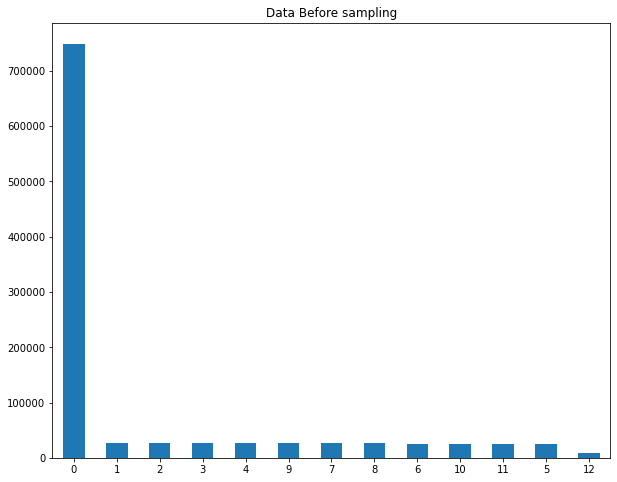

In [11]:
#Before resampling
plt.figure(figsize=(10 ,8 ))
plt.title('Data Before sampling')
df['Activity'].value_counts().plot.bar(rot=0)

In [12]:
# Resampling activity 0 to 40000 observations
data_activity_0 = df[df['Activity'] == 0]
data_activity_else = df[df['Activity'] != 0]

data_activity_0 = data_activity_0.sample(n=40000, random_state=42)
df = pd.concat([data_activity_0, data_activity_else])

<AxesSubplot:title={'center':'Data Before sampling'}>

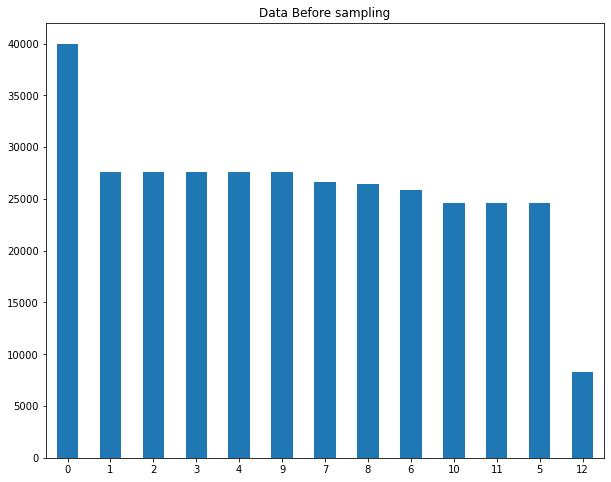

In [13]:
plt.figure(figsize=(10 ,8 ))
plt.title('Data Before sampling')
df['Activity'].value_counts().plot.bar(rot=0)

## EDA & Visualization

In [14]:
# giving labels to our values
activities_label = {
    0: "None",
    1: "Standing still (1 min)",
    2: "Sitting and relaxing (1 min)",
    3: "Lying down (1 min)",
    4: "Walking (1 min)",
    5: "Climbing stairs (1 min)",
    6: "Waist bends forward (20x)",
    7: "Frontal elevation of arms (20x)",
    8: "Knees bending (crouching) (20x)",
    9: "Cycling (1 min)",
    10: "Jogging (1 min)",
    11: "Running (1 min)",
    12: "Jump front & back (20x)"
}

In [15]:
## Subject 1

========================================== Standing still (1 min) - a ===================================


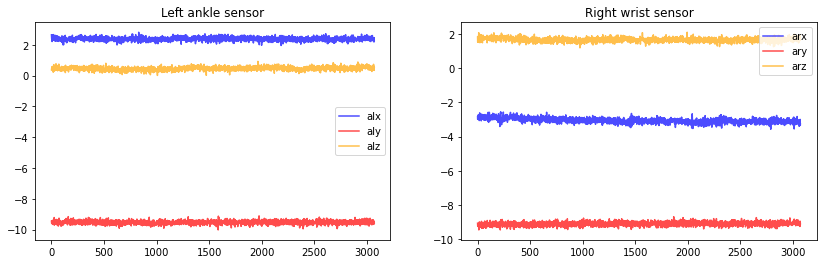

========================================== Standing still (1 min) - g ===================================


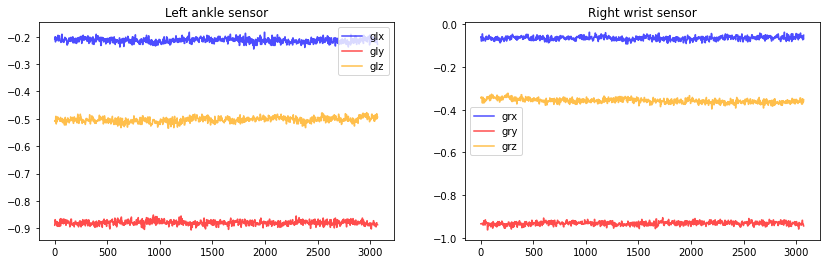

========================================== Sitting and relaxing (1 min) - a ===================================


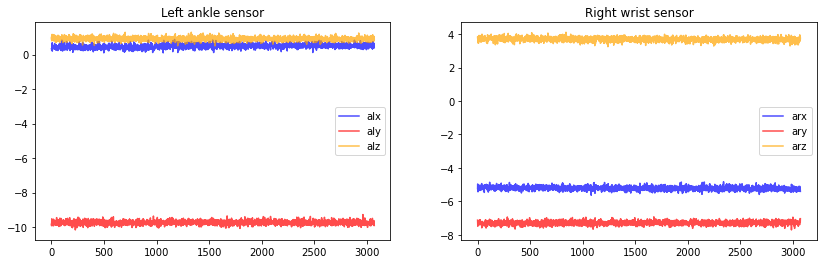

========================================== Sitting and relaxing (1 min) - g ===================================


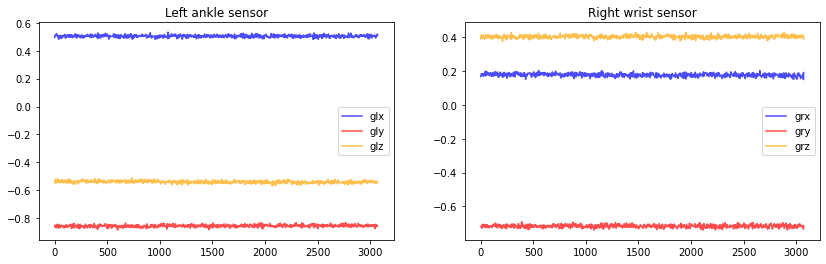

========================================== Lying down (1 min) - a ===================================


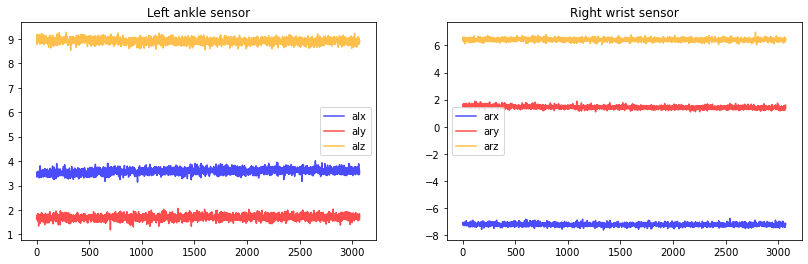

========================================== Lying down (1 min) - g ===================================


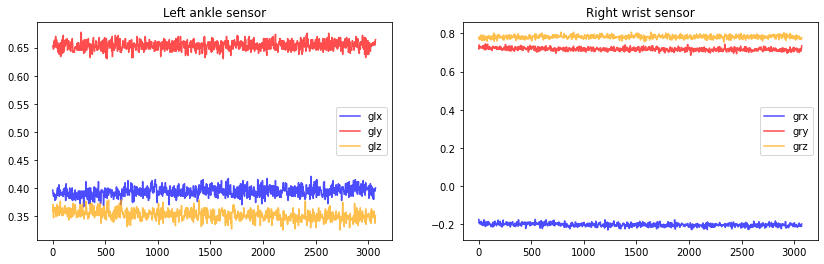

========================================== Walking (1 min) - a ===================================


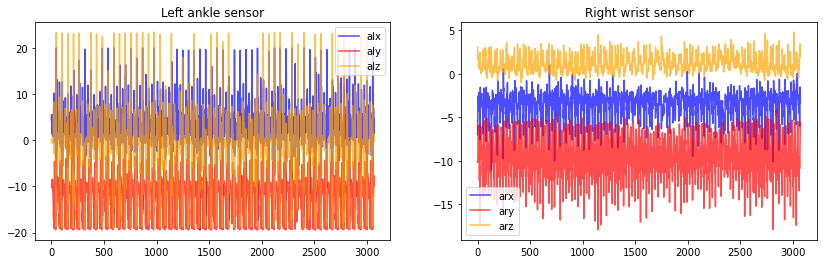

========================================== Walking (1 min) - g ===================================


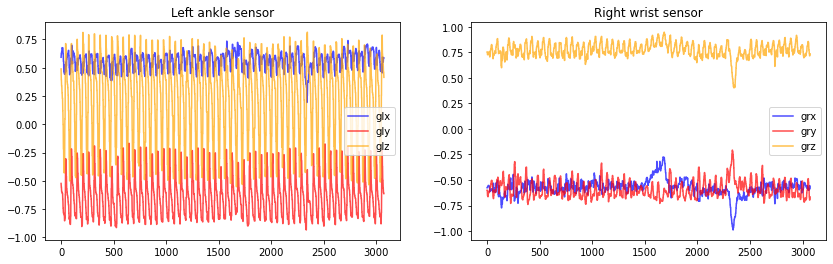

========================================== Climbing stairs (1 min) - a ===================================


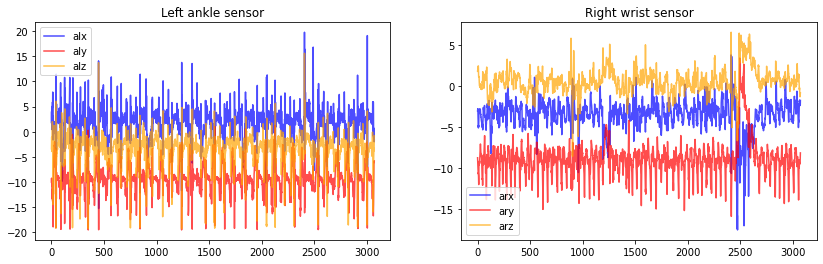

========================================== Climbing stairs (1 min) - g ===================================


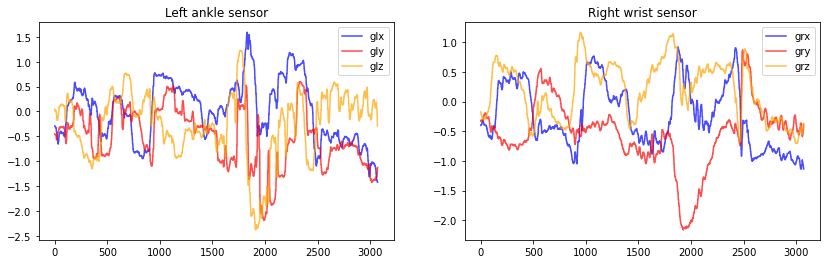

========================================== Waist bends forward (20x) - a ===================================


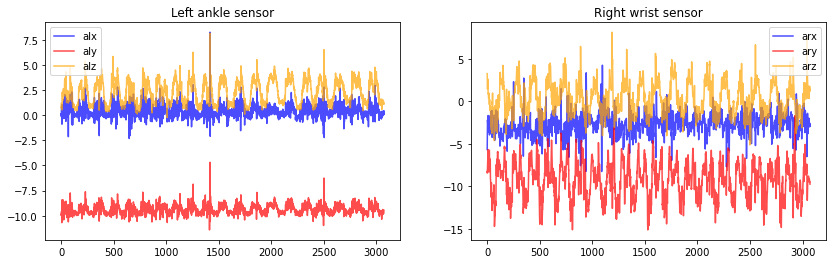

========================================== Waist bends forward (20x) - g ===================================


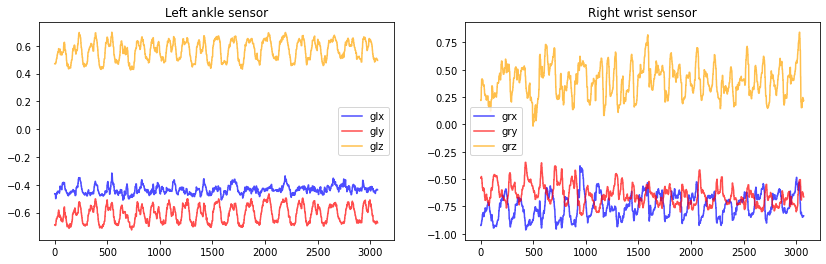

========================================== Frontal elevation of arms (20x) - a ===================================


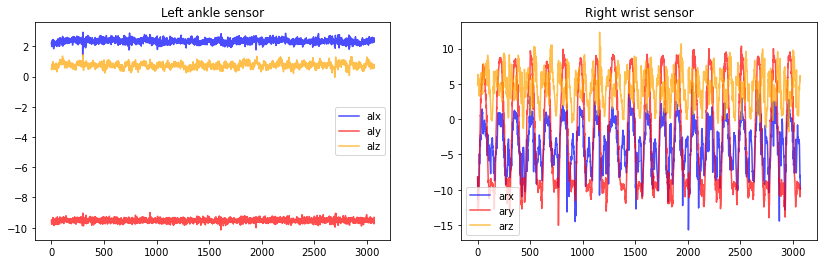

========================================== Frontal elevation of arms (20x) - g ===================================


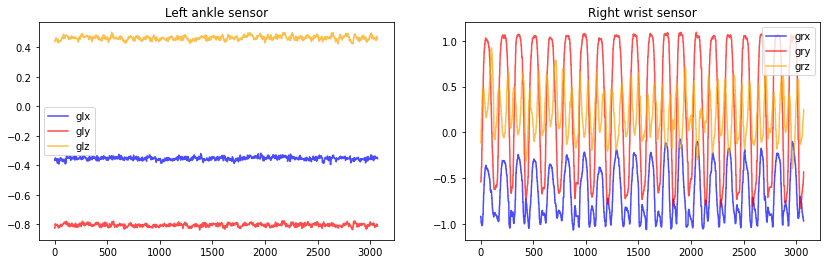

========================================== Knees bending (crouching) (20x) - a ===================================


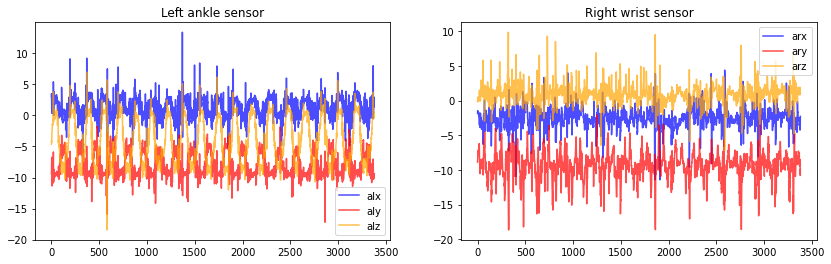

========================================== Knees bending (crouching) (20x) - g ===================================


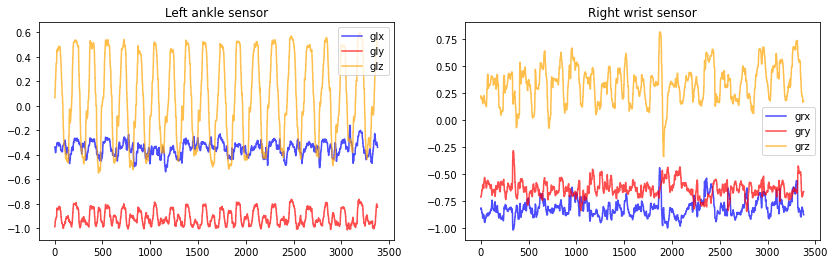

========================================== Cycling (1 min) - a ===================================


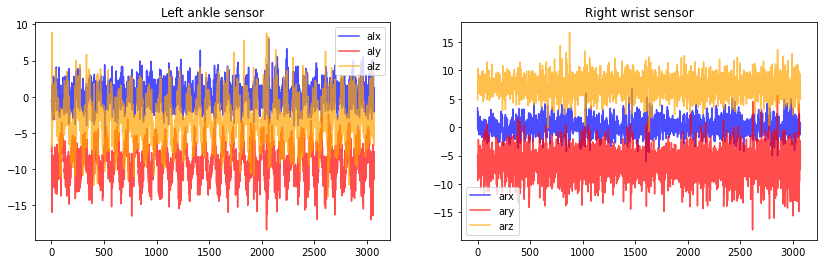

========================================== Cycling (1 min) - g ===================================


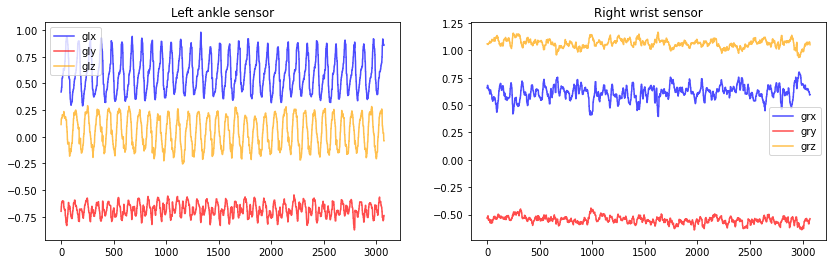

========================================== Jogging (1 min) - a ===================================


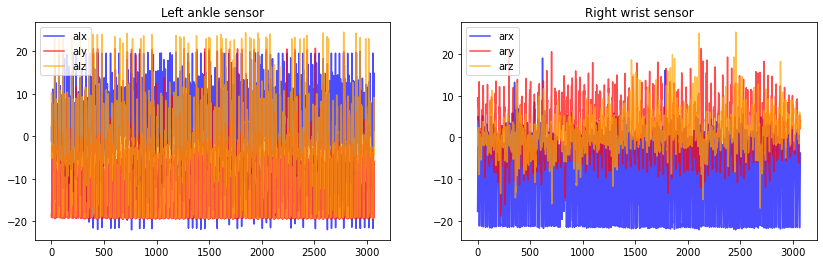

========================================== Jogging (1 min) - g ===================================


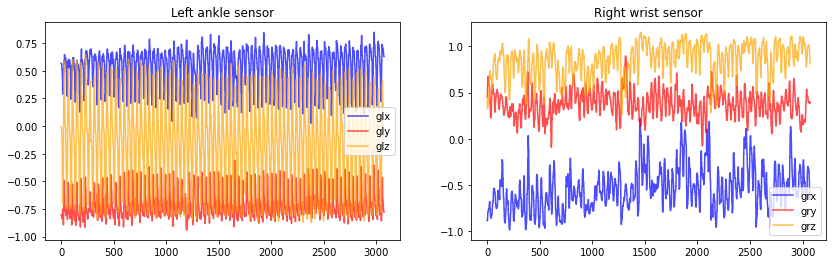

========================================== Running (1 min) - a ===================================


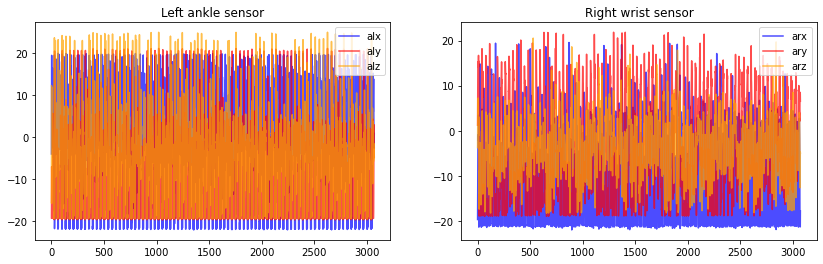

========================================== Running (1 min) - g ===================================


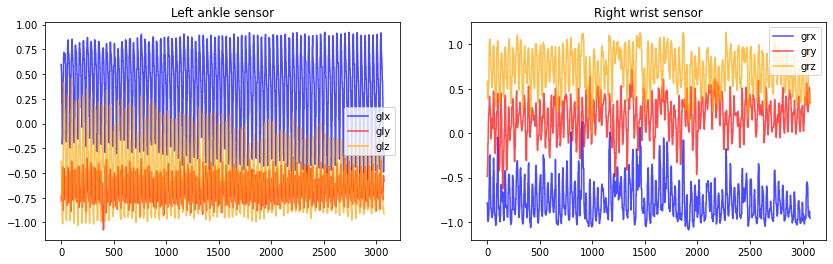

========================================== Jump front & back (20x) - a ===================================


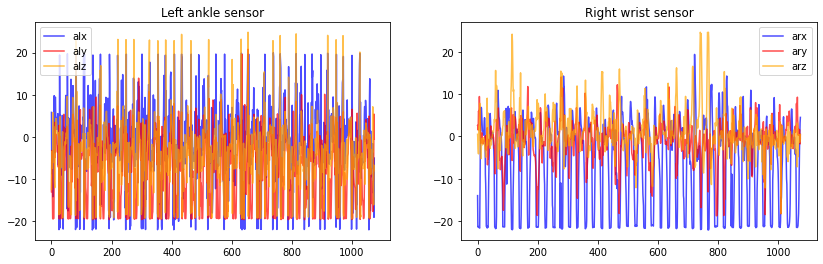

========================================== Jump front & back (20x) - g ===================================


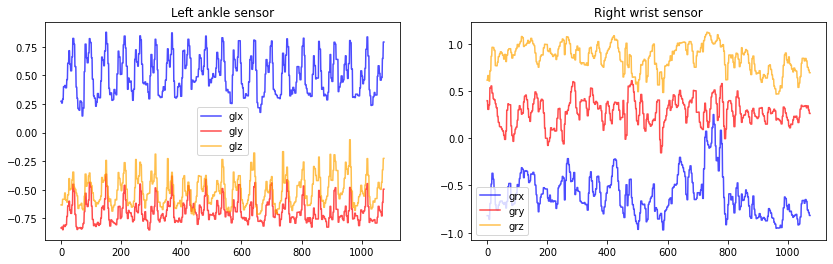

In [16]:
# Create plots for one particular subject performing the activities - using subject 1 since it has the most data
# Each plot section divided by activity and type of reading taken
subject_1 = df[df['subject'] == 'subject1']
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'========================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx')
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +'ly')
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz')
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx')
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry')
        plt.plot(subject_1[subject_1['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()
        

============================================ Standing still (1 min) - a ===================================


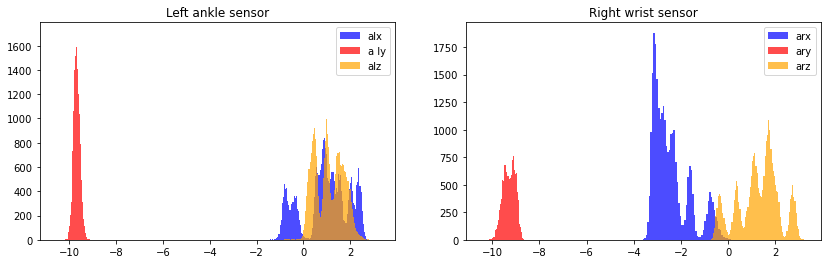

============================================ Standing still (1 min) - g ===================================


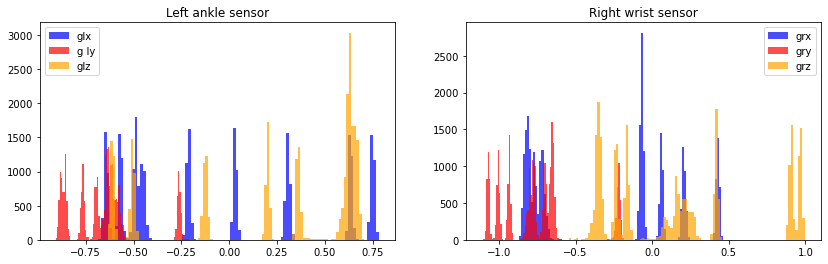

============================================ Sitting and relaxing (1 min) - a ===================================


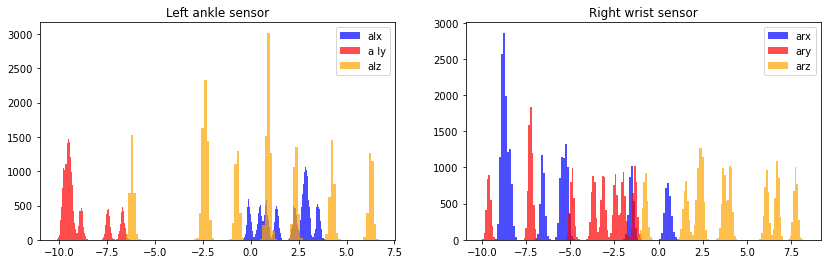

============================================ Sitting and relaxing (1 min) - g ===================================


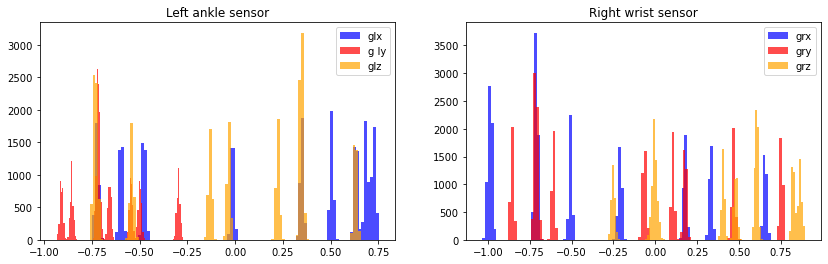

============================================ Lying down (1 min) - a ===================================


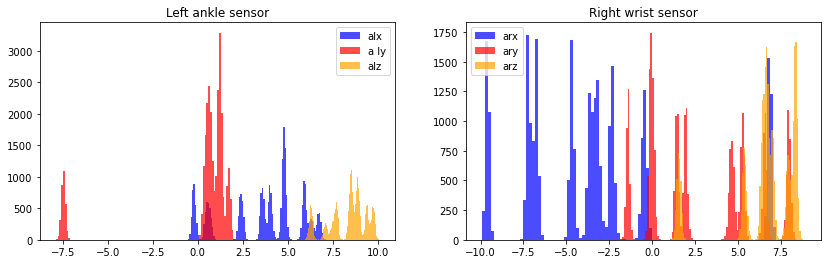

============================================ Lying down (1 min) - g ===================================


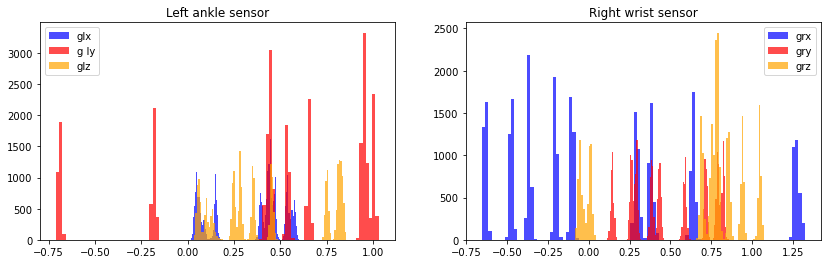

============================================ Walking (1 min) - a ===================================


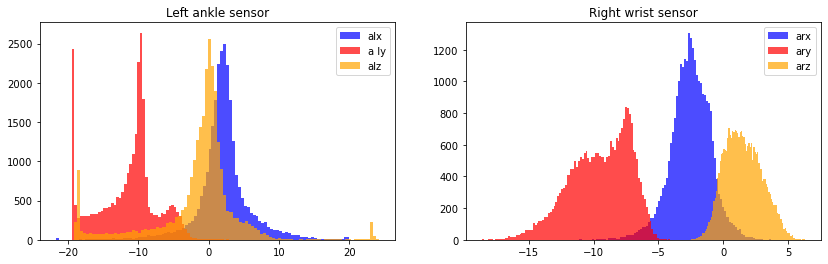

============================================ Walking (1 min) - g ===================================


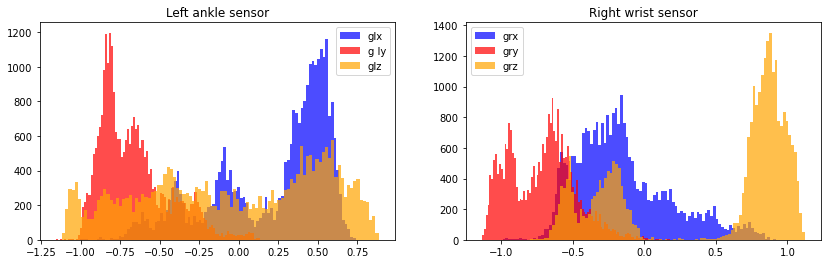

============================================ Climbing stairs (1 min) - a ===================================


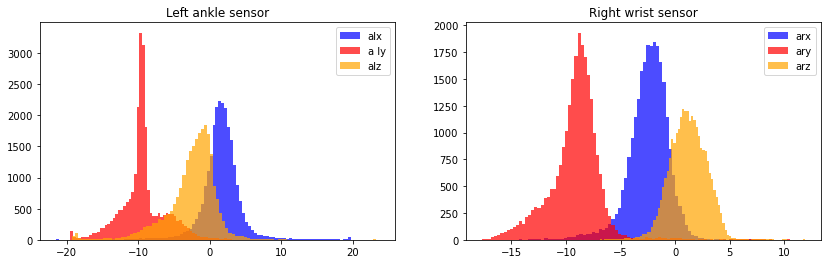

============================================ Climbing stairs (1 min) - g ===================================


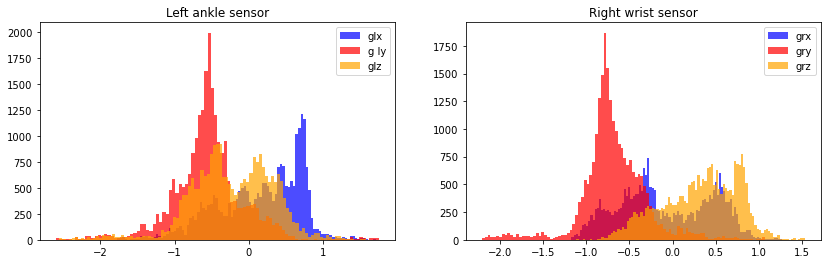

============================================ Waist bends forward (20x) - a ===================================


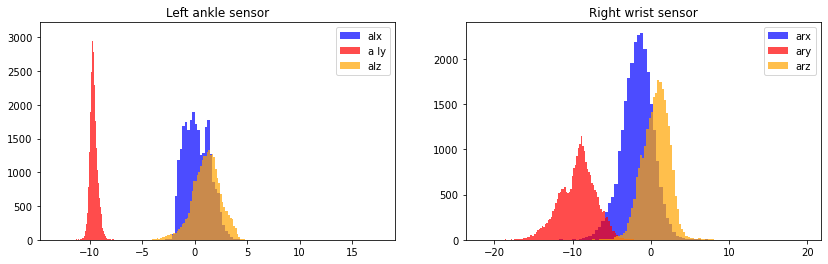

============================================ Waist bends forward (20x) - g ===================================


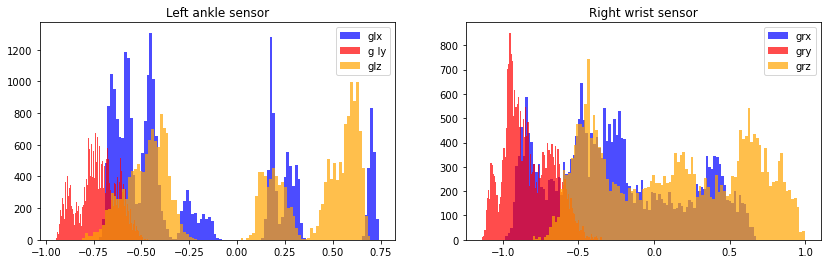

============================================ Frontal elevation of arms (20x) - a ===================================


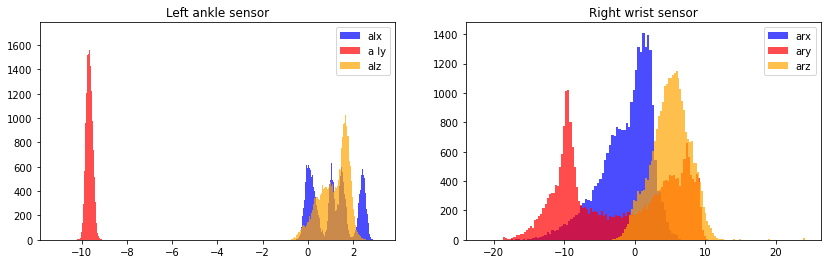

============================================ Frontal elevation of arms (20x) - g ===================================


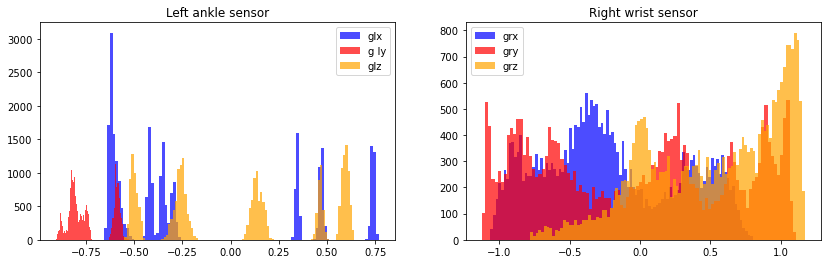

============================================ Knees bending (crouching) (20x) - a ===================================


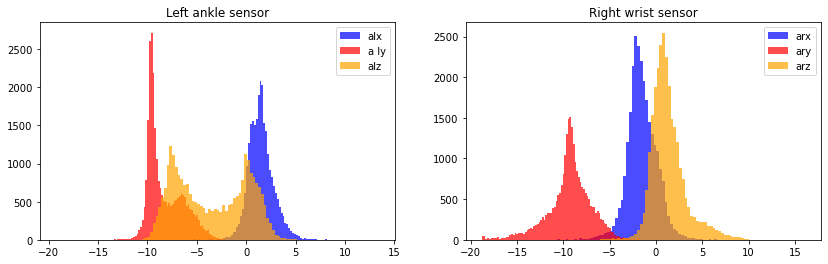

============================================ Knees bending (crouching) (20x) - g ===================================


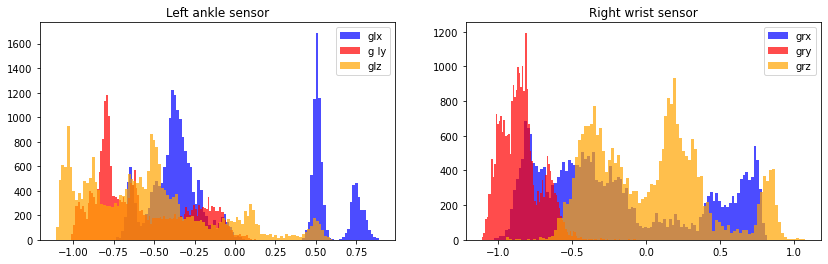

============================================ Cycling (1 min) - a ===================================


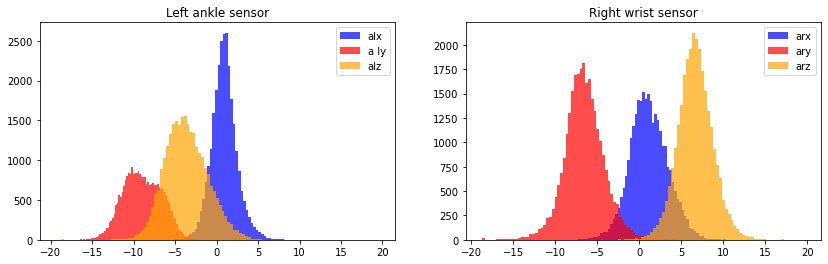

============================================ Cycling (1 min) - g ===================================


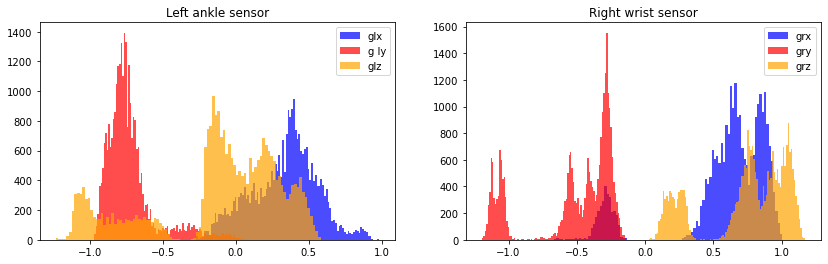

============================================ Jogging (1 min) - a ===================================


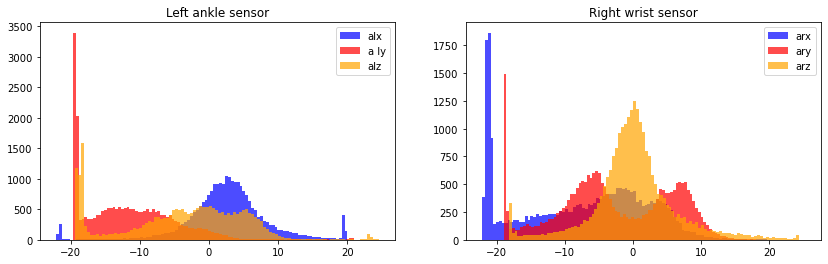

============================================ Jogging (1 min) - g ===================================


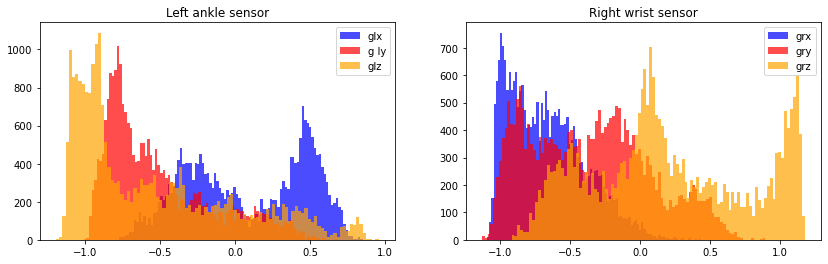

============================================ Running (1 min) - a ===================================


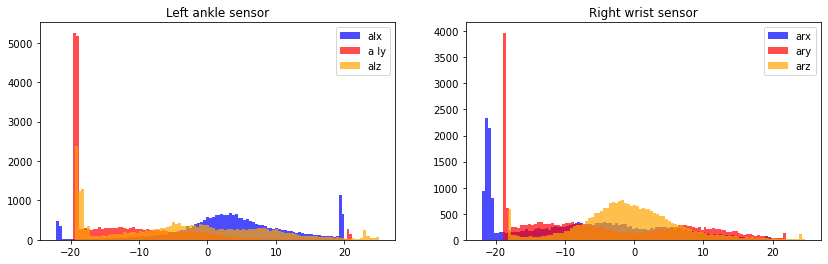

============================================ Running (1 min) - g ===================================


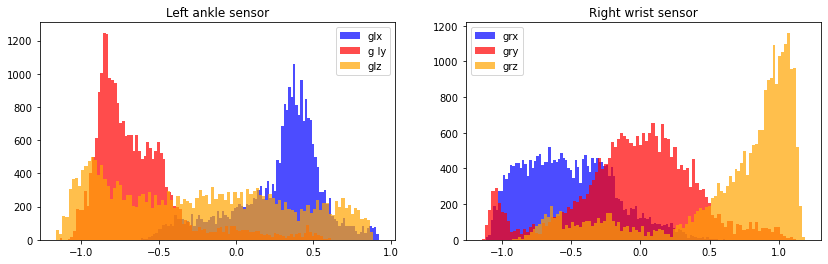

============================================ Jump front & back (20x) - a ===================================


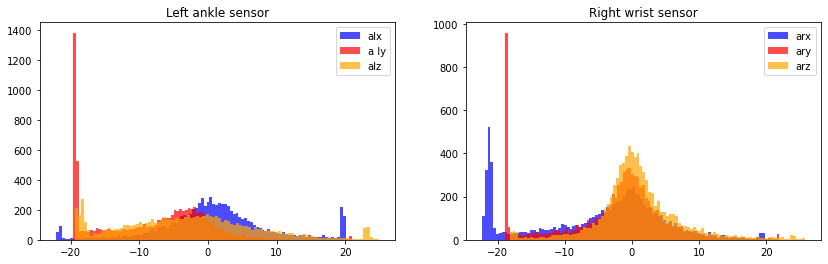

============================================ Jump front & back (20x) - g ===================================


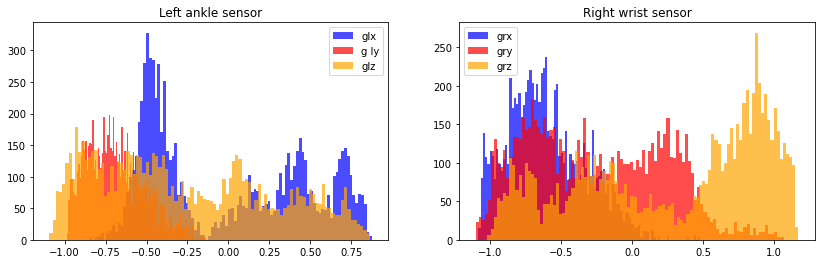

In [17]:
# Distribution plots for each activity and sensor
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'============================================ {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +' ly', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()
        

In [18]:
## we will visualize more subjects because their signals depend on their own reactions and they may differs slightly even at same activity.

In [19]:
### Subject 2

=================================== Standing still (1 min) - a ===================================


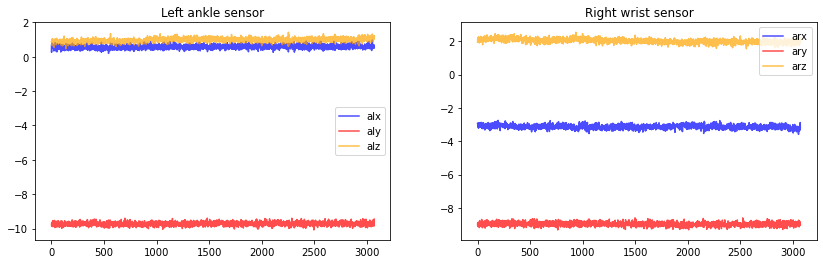

=================================== Standing still (1 min) - g ===================================


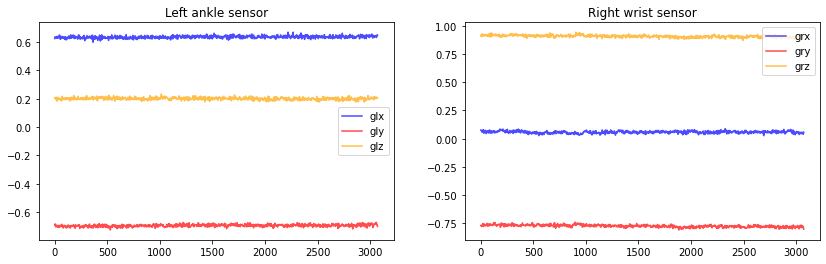

=================================== Sitting and relaxing (1 min) - a ===================================


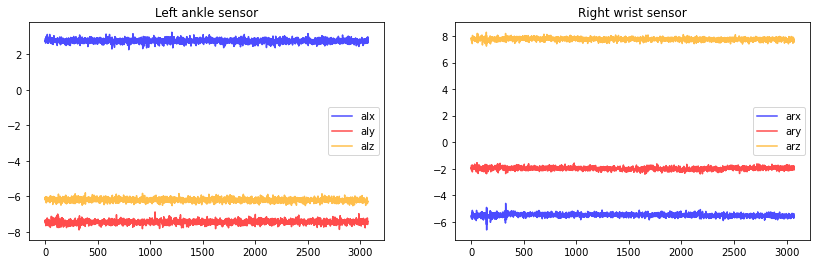

=================================== Sitting and relaxing (1 min) - g ===================================


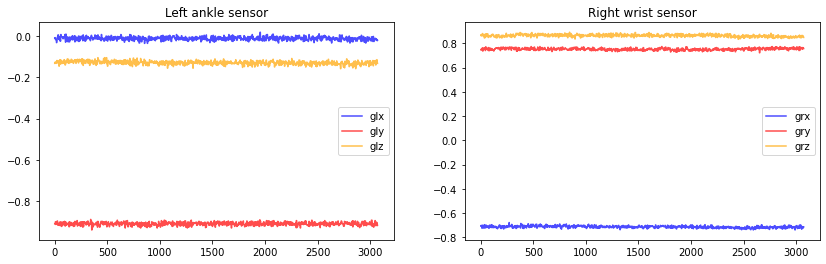

=================================== Lying down (1 min) - a ===================================


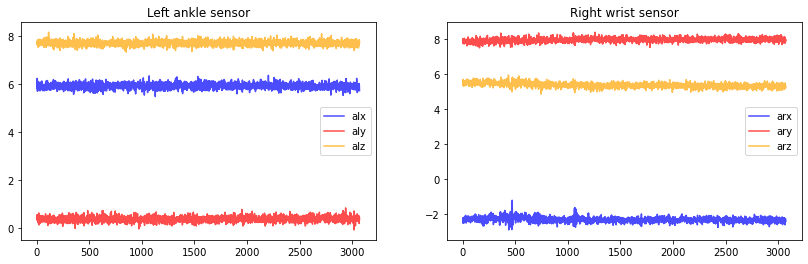

=================================== Lying down (1 min) - g ===================================


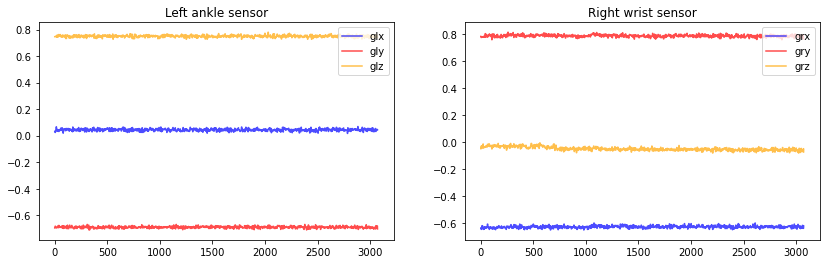

=================================== Walking (1 min) - a ===================================


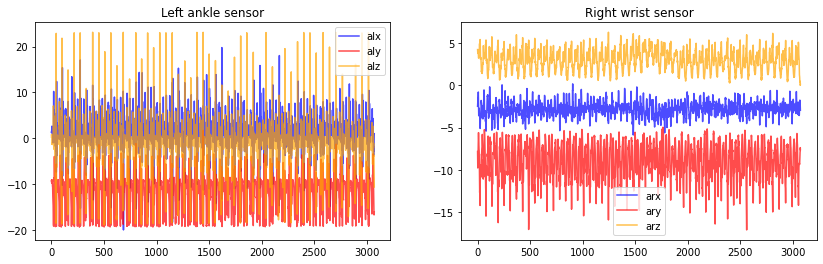

=================================== Walking (1 min) - g ===================================


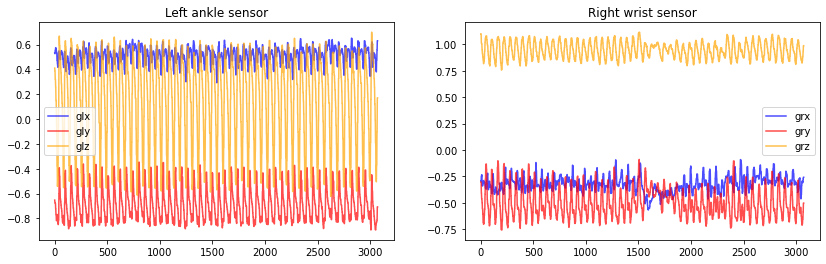

=================================== Climbing stairs (1 min) - a ===================================


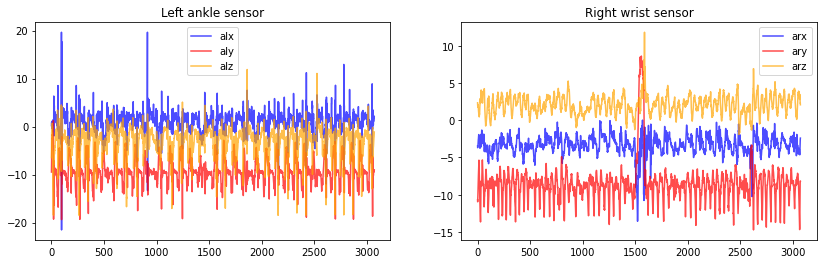

=================================== Climbing stairs (1 min) - g ===================================


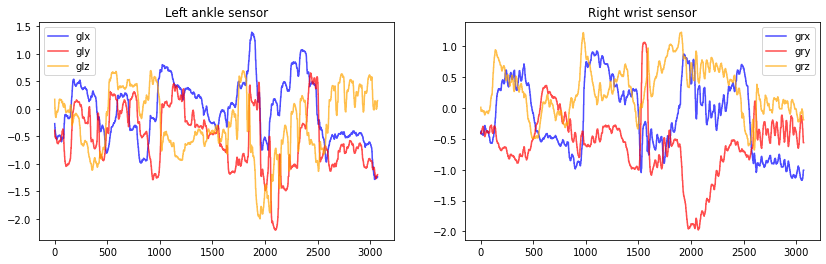

=================================== Waist bends forward (20x) - a ===================================


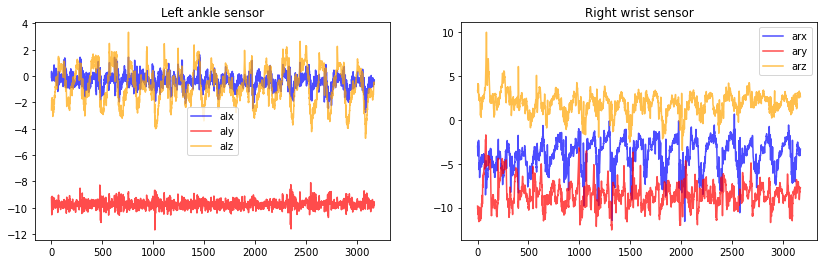

=================================== Waist bends forward (20x) - g ===================================


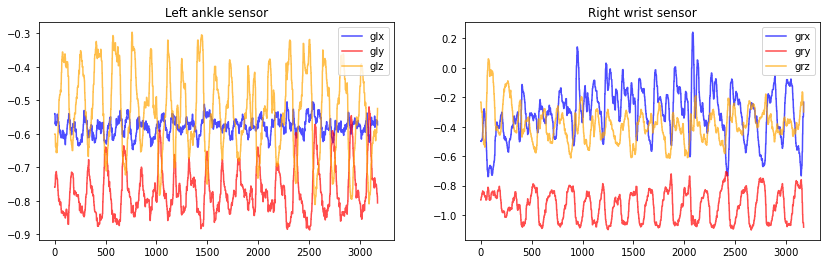

=================================== Frontal elevation of arms (20x) - a ===================================


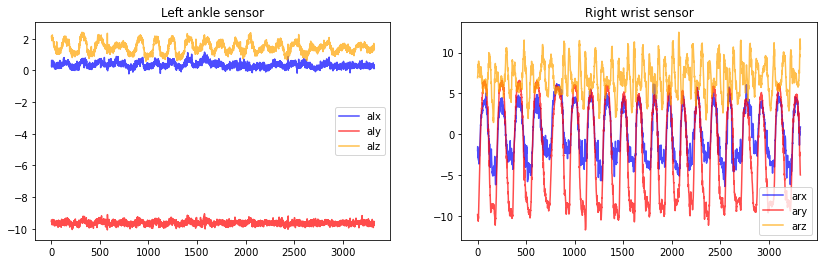

=================================== Frontal elevation of arms (20x) - g ===================================


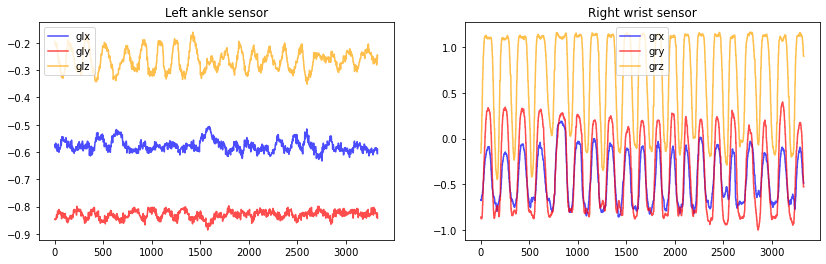

=================================== Knees bending (crouching) (20x) - a ===================================


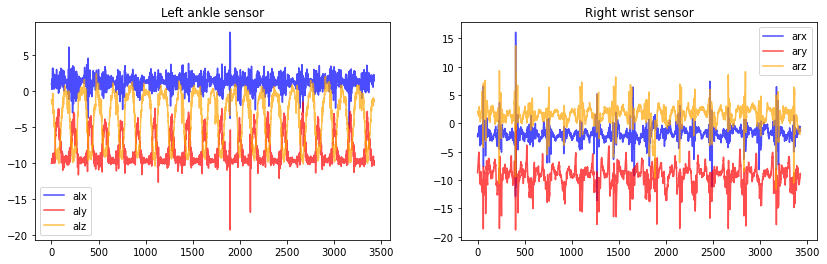

=================================== Knees bending (crouching) (20x) - g ===================================


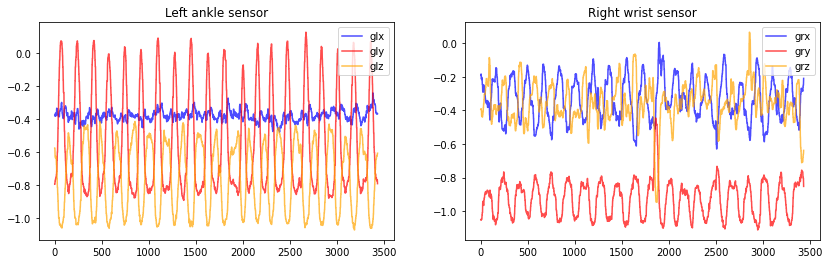

=================================== Cycling (1 min) - a ===================================


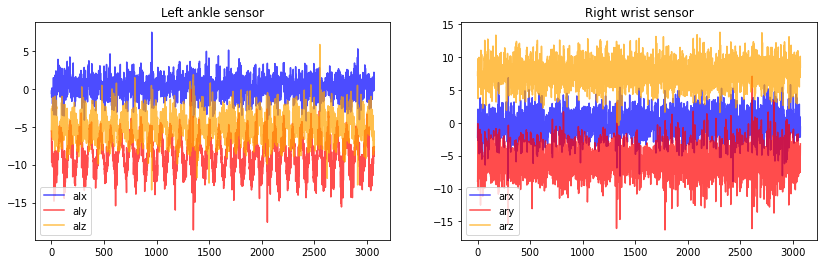

=================================== Cycling (1 min) - g ===================================


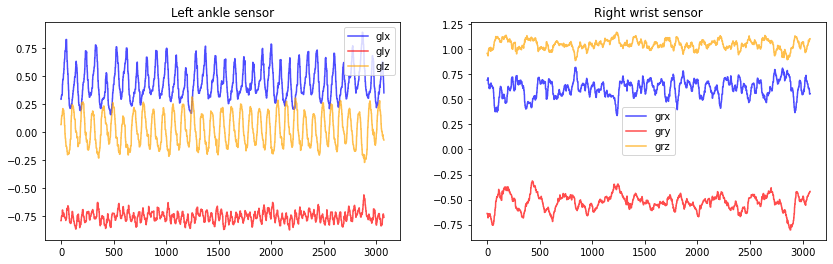

=================================== Jogging (1 min) - a ===================================


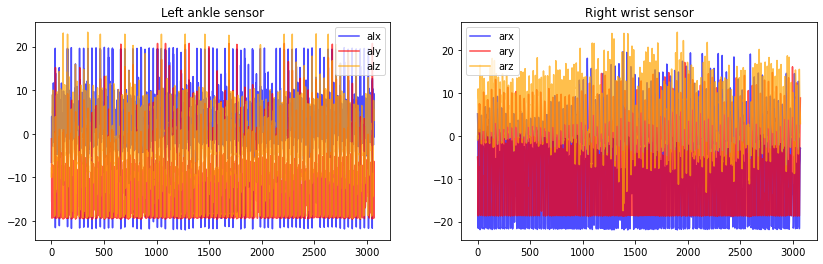

=================================== Jogging (1 min) - g ===================================


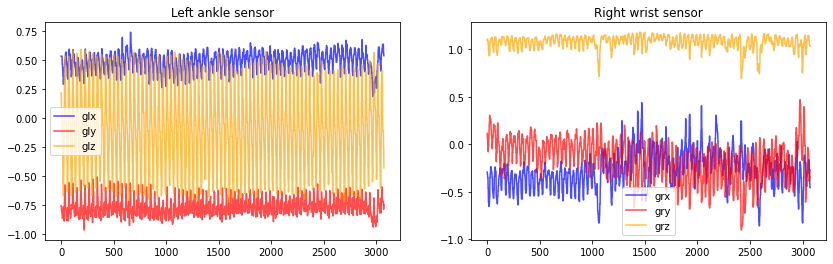

=================================== Running (1 min) - a ===================================


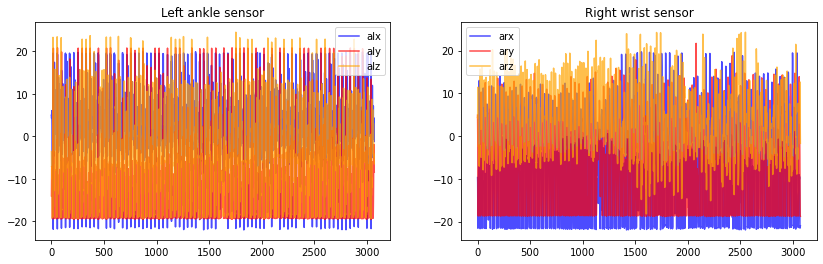

=================================== Running (1 min) - g ===================================


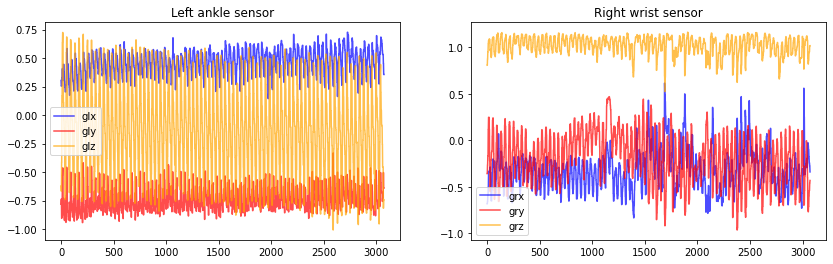

=================================== Jump front & back (20x) - a ===================================


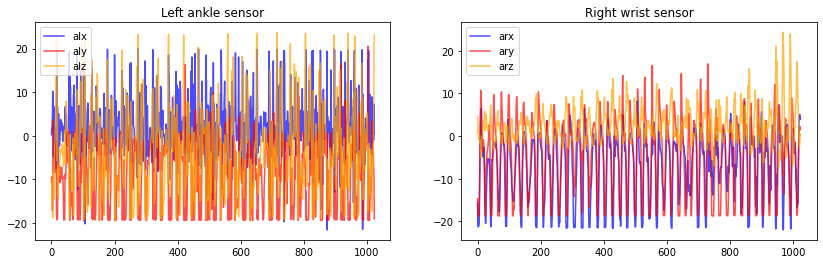

=================================== Jump front & back (20x) - g ===================================


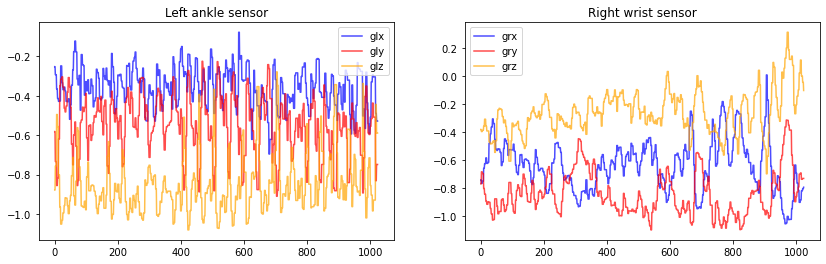

In [20]:
# Create plots for one particular subject performing the activities - using subject 2 
# Each plot section divided by activity and type of reading taken
subject_2 = df[df['subject'] == 'subject2']
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx')
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +'ly')
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz')
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx')
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry')
        plt.plot(subject_2[subject_2['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()
        

=================================== Standing still (1 min) - a ===================================


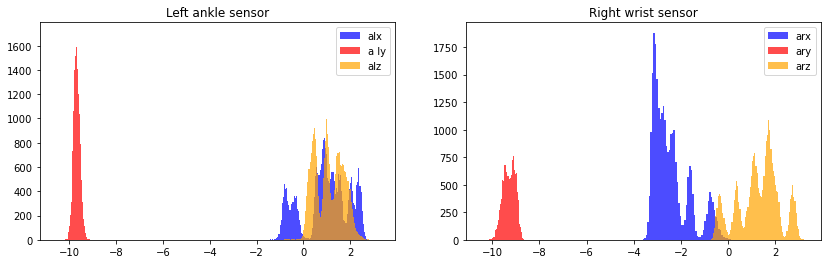

=================================== Standing still (1 min) - g ===================================


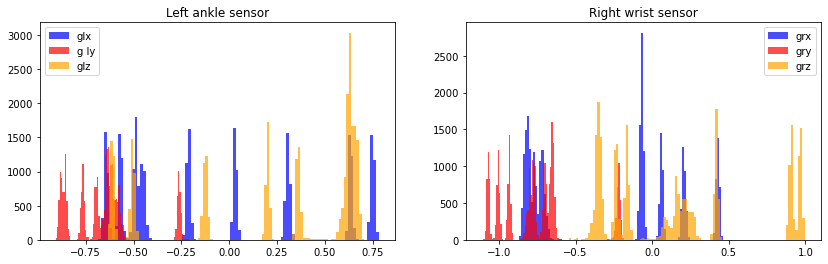

=================================== Sitting and relaxing (1 min) - a ===================================


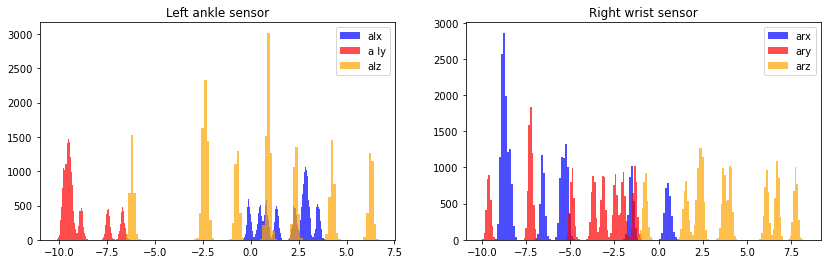

=================================== Sitting and relaxing (1 min) - g ===================================


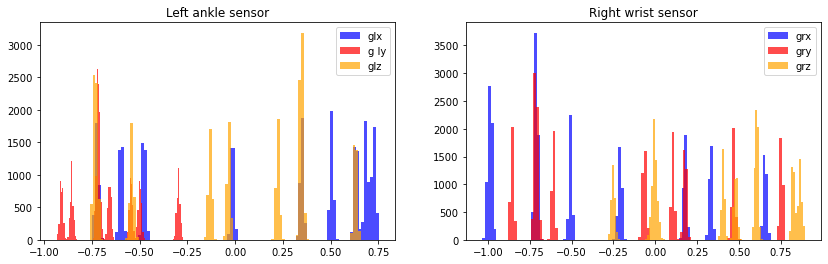

=================================== Lying down (1 min) - a ===================================


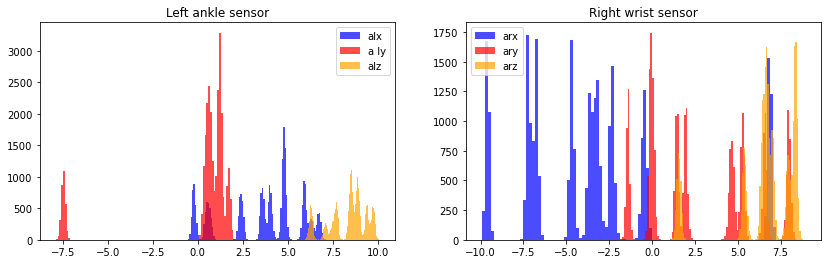

=================================== Lying down (1 min) - g ===================================


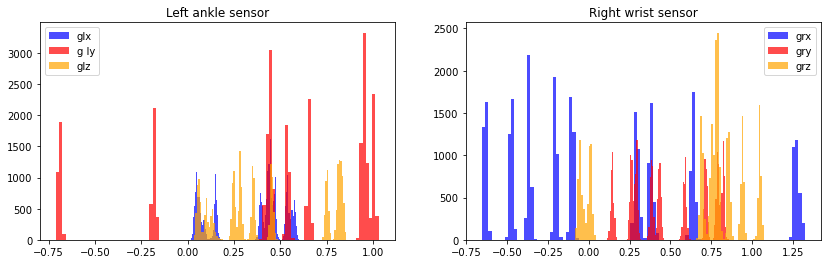

=================================== Walking (1 min) - a ===================================


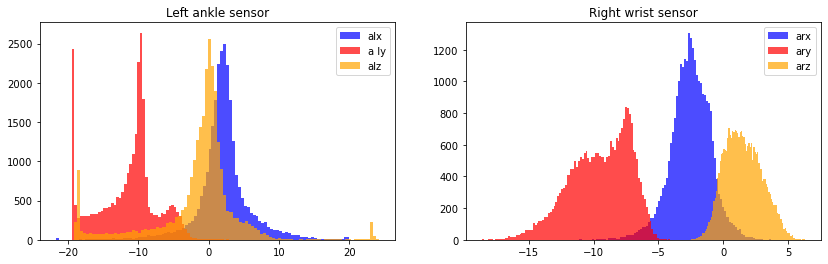

=================================== Walking (1 min) - g ===================================


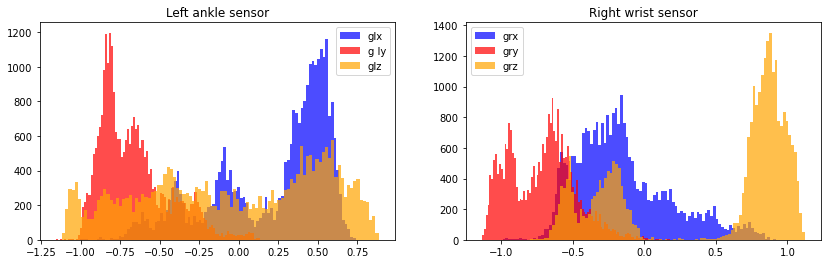

=================================== Climbing stairs (1 min) - a ===================================


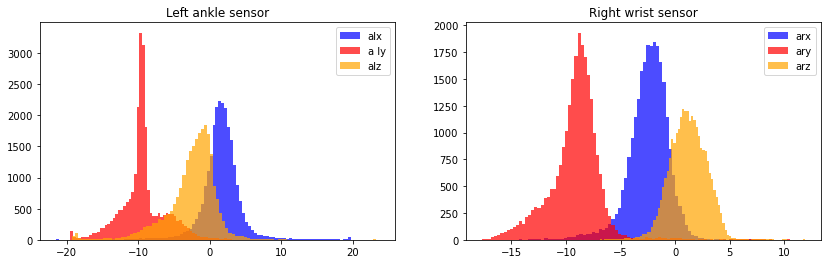

=================================== Climbing stairs (1 min) - g ===================================


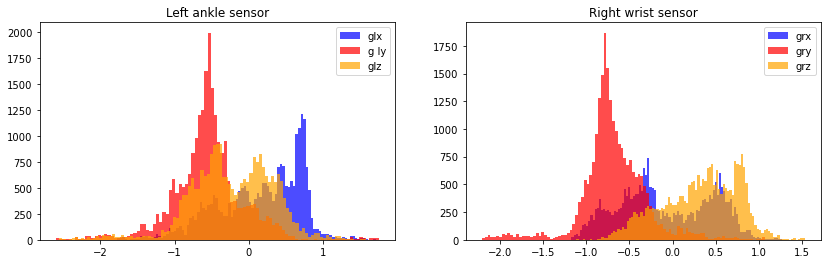

=================================== Waist bends forward (20x) - a ===================================


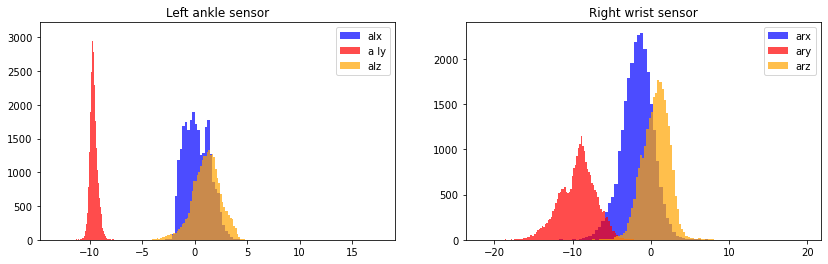

=================================== Waist bends forward (20x) - g ===================================


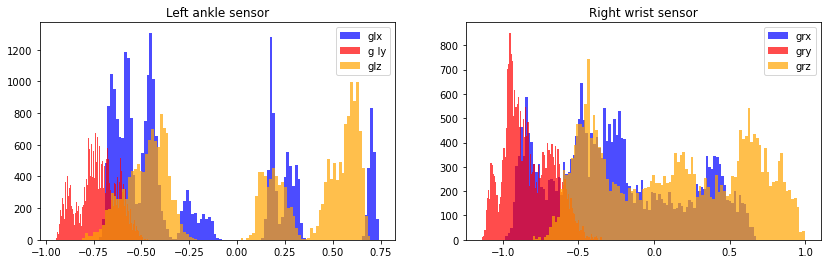

=================================== Frontal elevation of arms (20x) - a ===================================


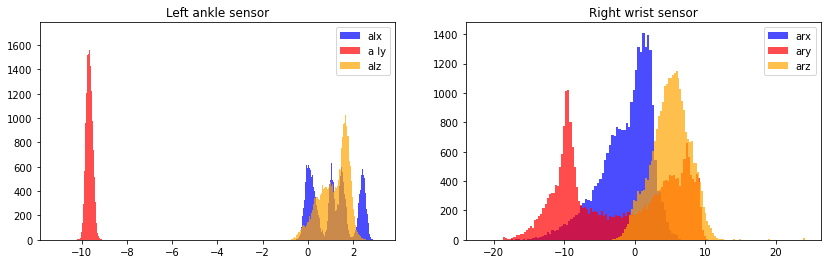

=================================== Frontal elevation of arms (20x) - g ===================================


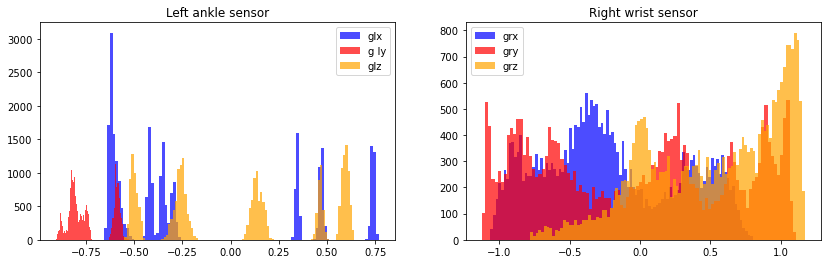

=================================== Knees bending (crouching) (20x) - a ===================================


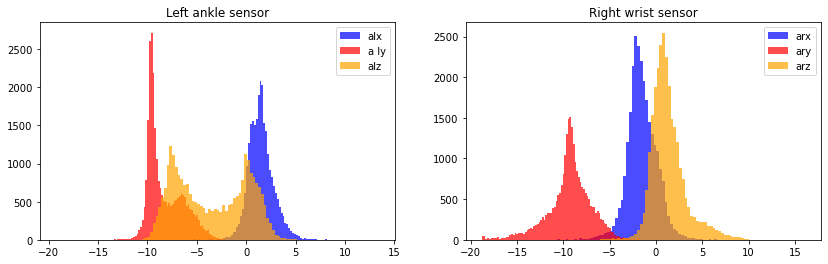

=================================== Knees bending (crouching) (20x) - g ===================================


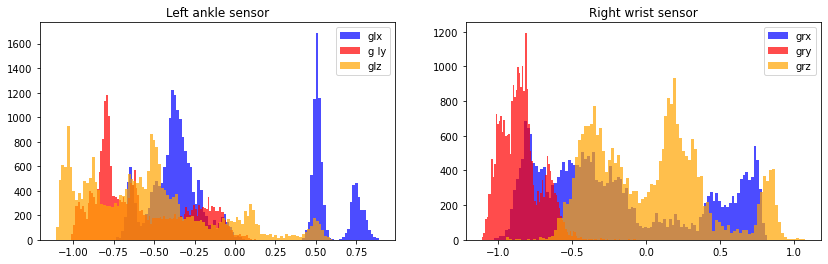

=================================== Cycling (1 min) - a ===================================


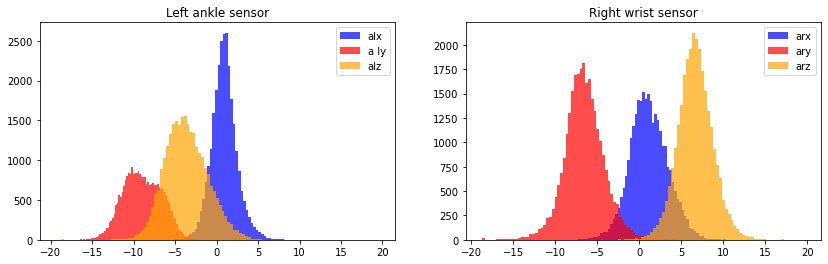

=================================== Cycling (1 min) - g ===================================


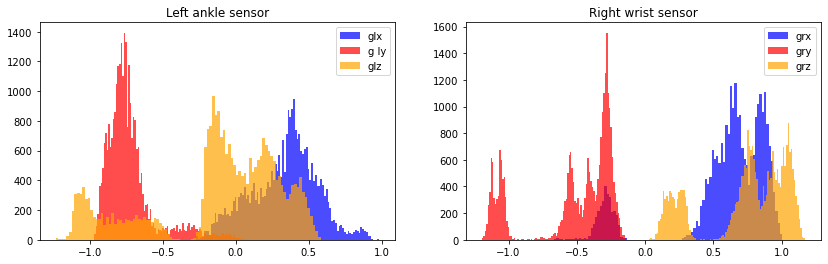

=================================== Jogging (1 min) - a ===================================


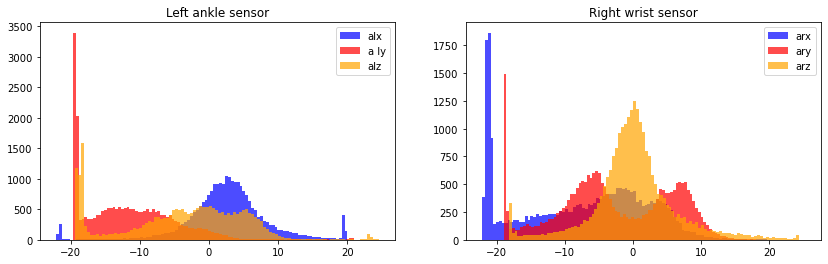

=================================== Jogging (1 min) - g ===================================


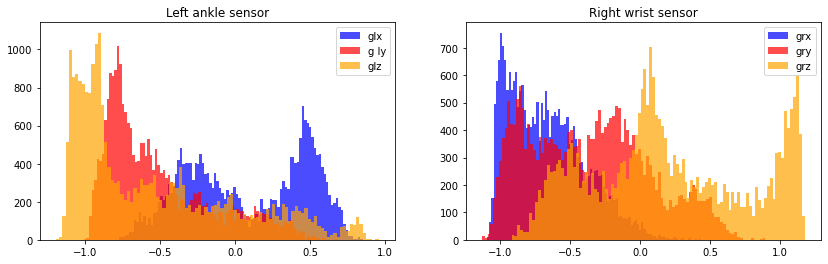

=================================== Running (1 min) - a ===================================


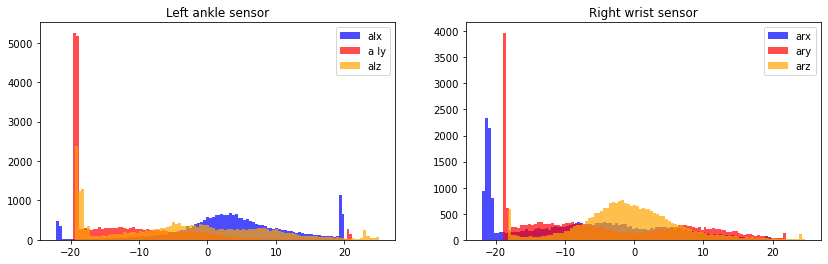

=================================== Running (1 min) - g ===================================


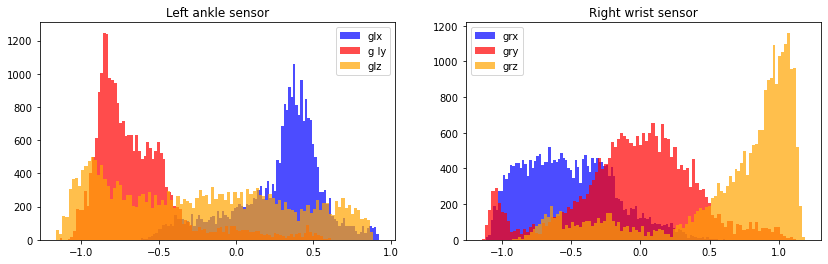

=================================== Jump front & back (20x) - a ===================================


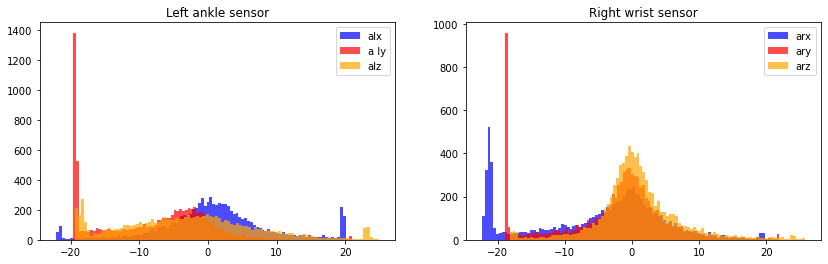

=================================== Jump front & back (20x) - g ===================================


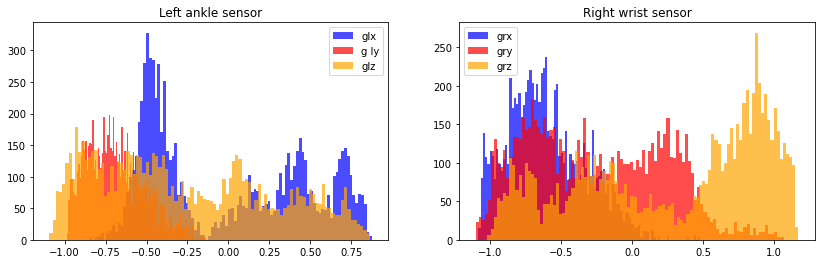

In [21]:
# Distribution plots for each activity and sensor
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +' ly', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

In [22]:
### subject 3

=================================== Standing still (1 min) - a ===================================


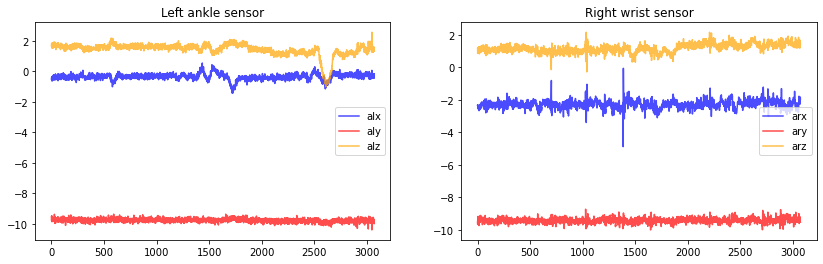

=================================== Standing still (1 min) - g ===================================


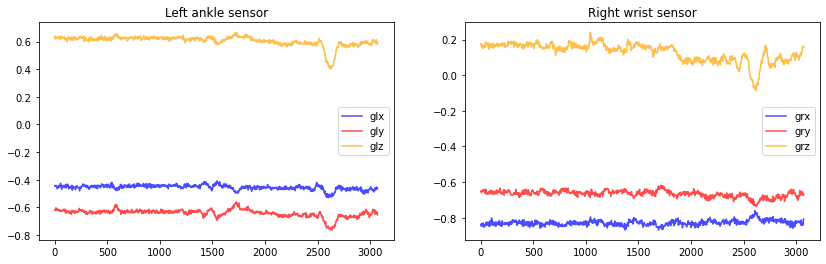

=================================== Sitting and relaxing (1 min) - a ===================================


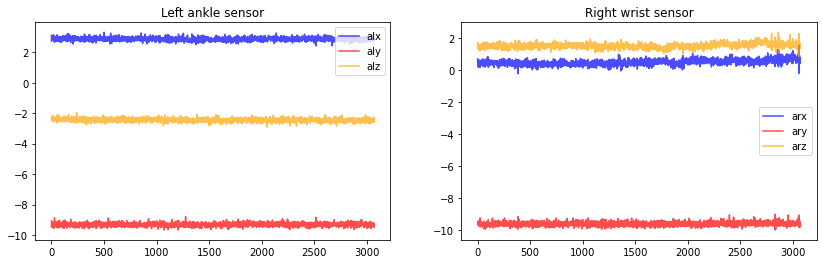

=================================== Sitting and relaxing (1 min) - g ===================================


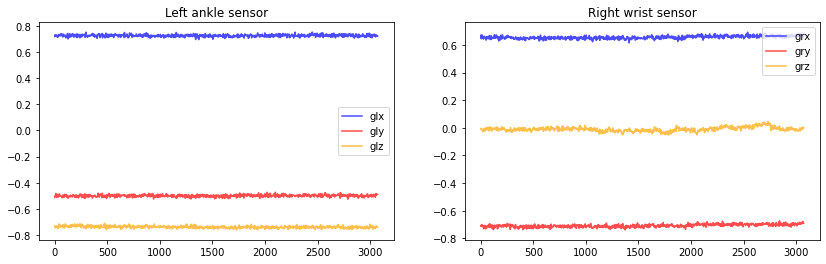

=================================== Lying down (1 min) - a ===================================


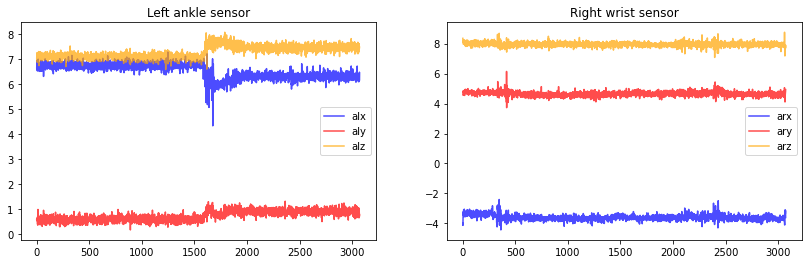

=================================== Lying down (1 min) - g ===================================


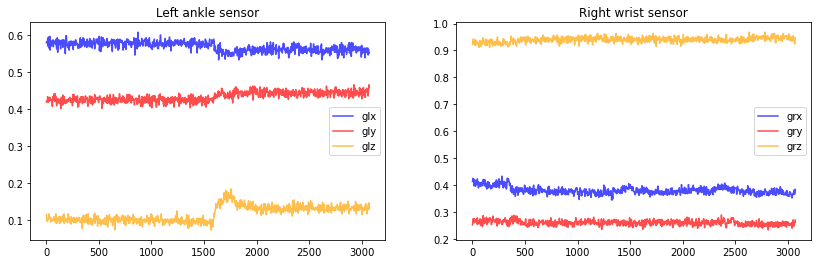

=================================== Walking (1 min) - a ===================================


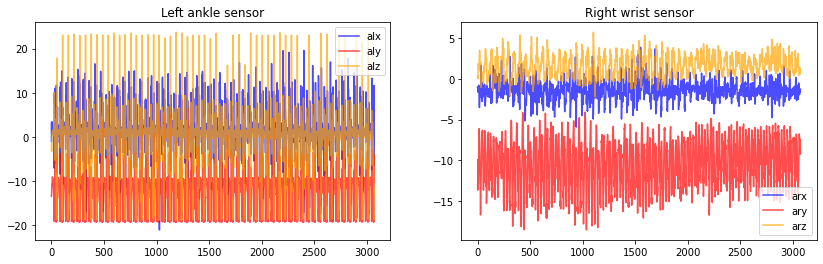

=================================== Walking (1 min) - g ===================================


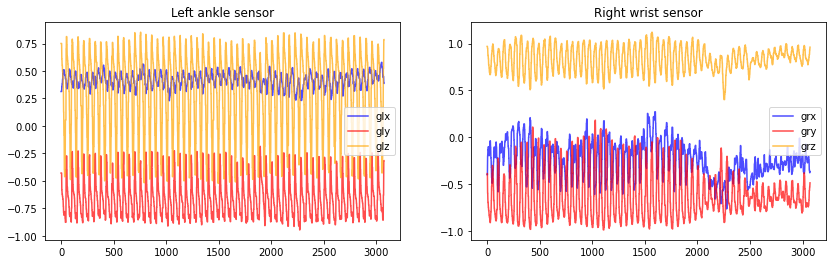

=================================== Climbing stairs (1 min) - a ===================================


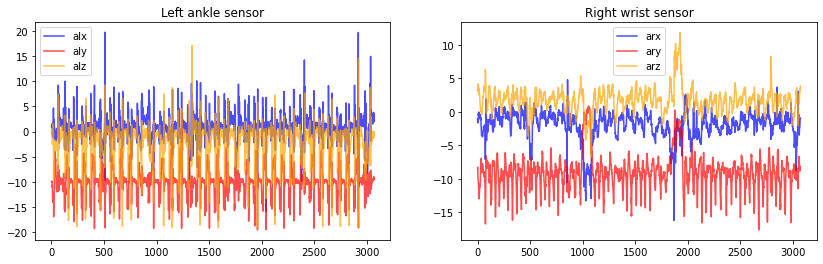

=================================== Climbing stairs (1 min) - g ===================================


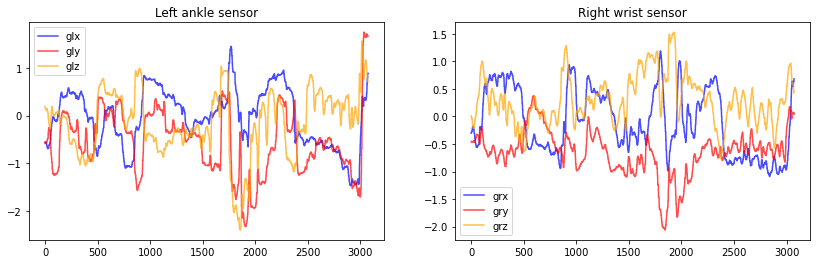

=================================== Waist bends forward (20x) - a ===================================


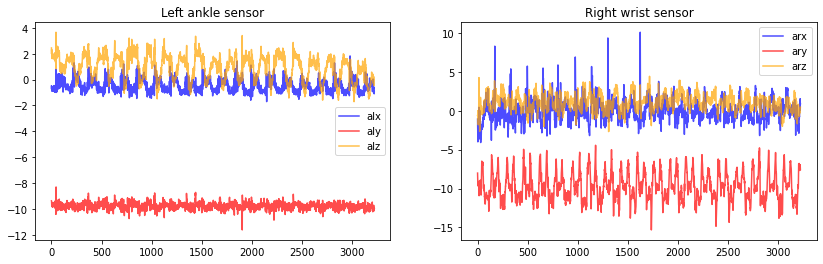

=================================== Waist bends forward (20x) - g ===================================


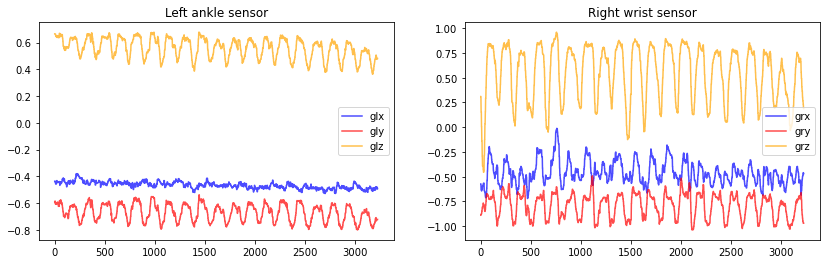

=================================== Frontal elevation of arms (20x) - a ===================================


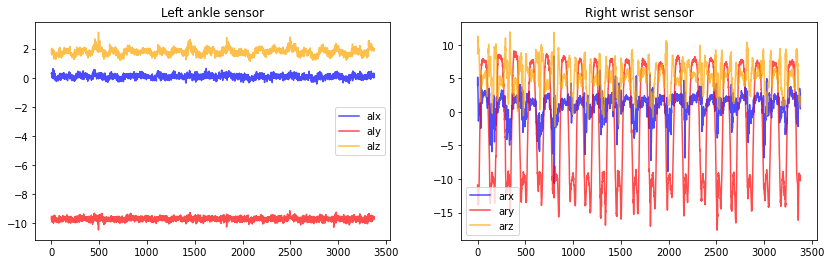

=================================== Frontal elevation of arms (20x) - g ===================================


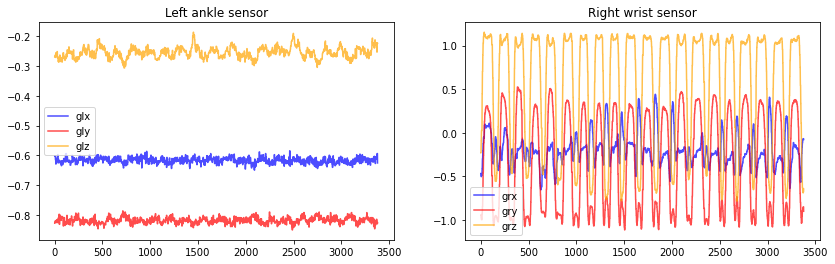

=================================== Knees bending (crouching) (20x) - a ===================================


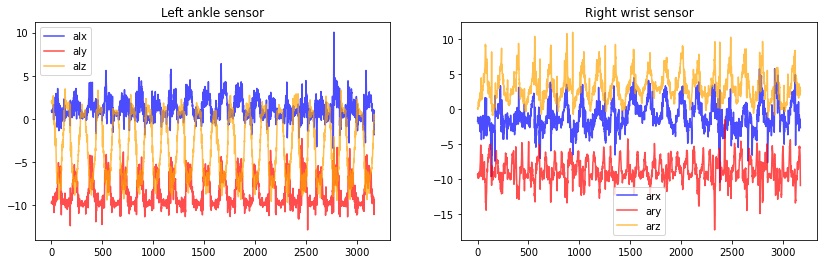

=================================== Knees bending (crouching) (20x) - g ===================================


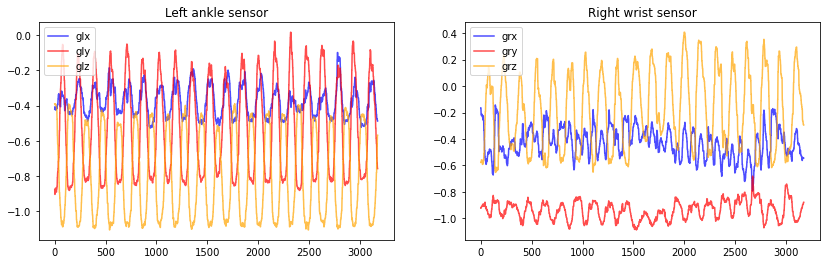

=================================== Cycling (1 min) - a ===================================


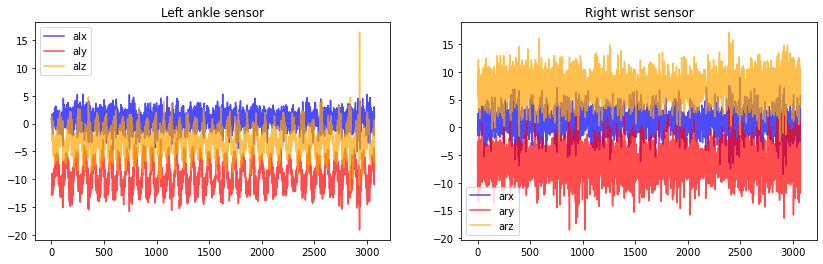

=================================== Cycling (1 min) - g ===================================


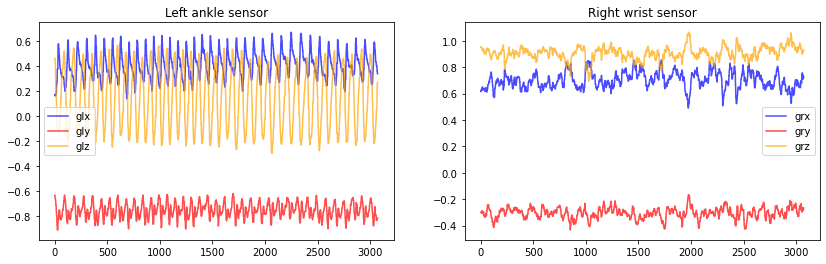

=================================== Jogging (1 min) - a ===================================


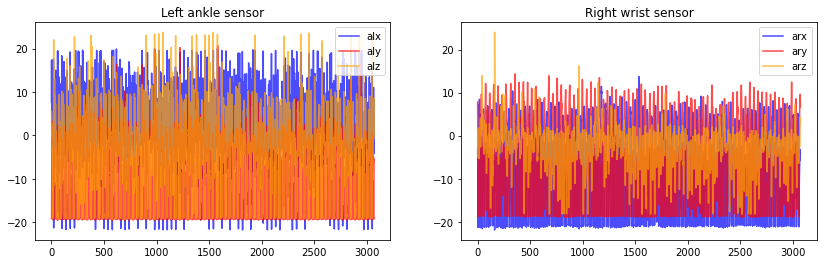

=================================== Jogging (1 min) - g ===================================


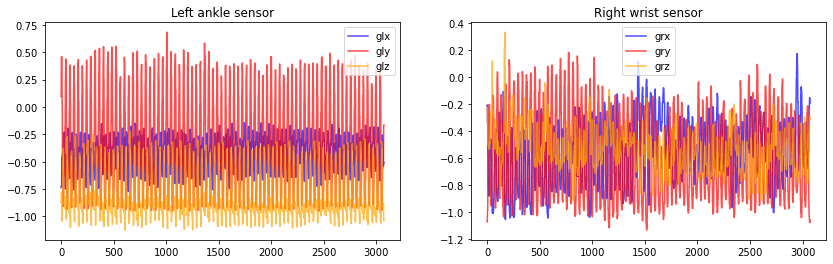

=================================== Running (1 min) - a ===================================


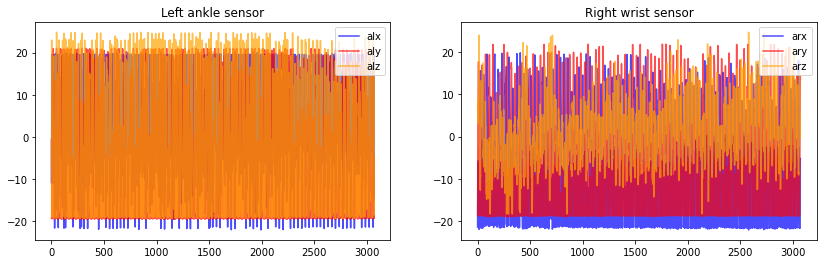

=================================== Running (1 min) - g ===================================


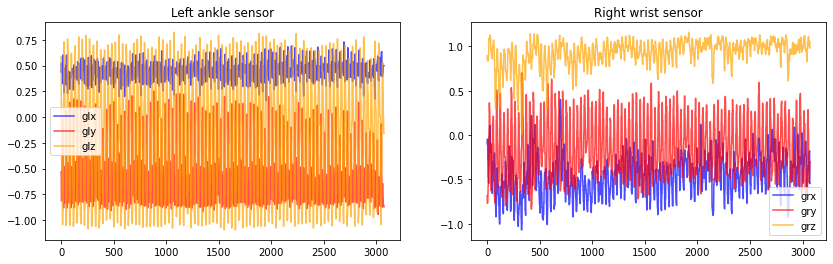

=================================== Jump front & back (20x) - a ===================================


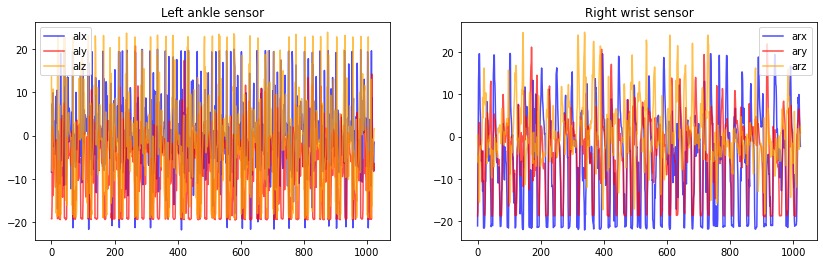

=================================== Jump front & back (20x) - g ===================================


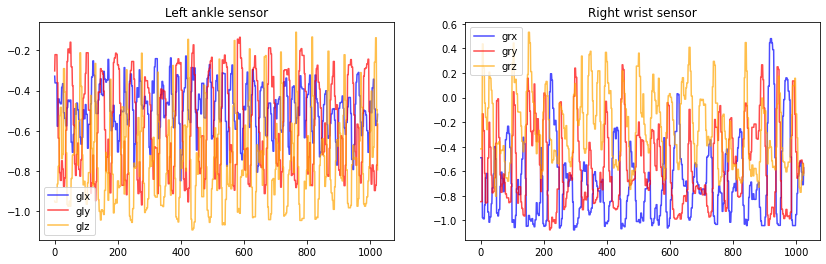

In [23]:
# Create plots for one particular subject performing the activities - using subject 2 
# Each plot section divided by activity and type of reading taken
subject_3 = df[df['subject'] == 'subject3']
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx')
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +'ly')
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz')
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx')
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry')
        plt.plot(subject_3[subject_3['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

=================================== Standing still (1 min) - a ===================================


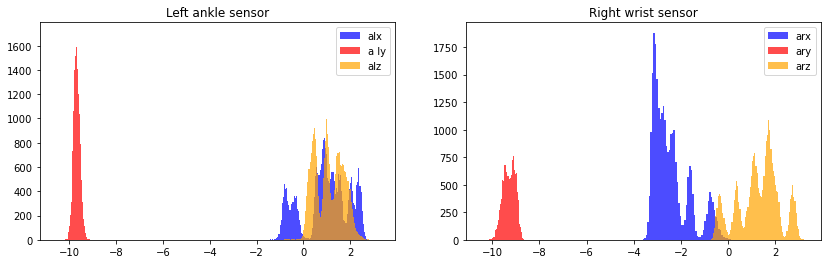

=================================== Standing still (1 min) - g ===================================


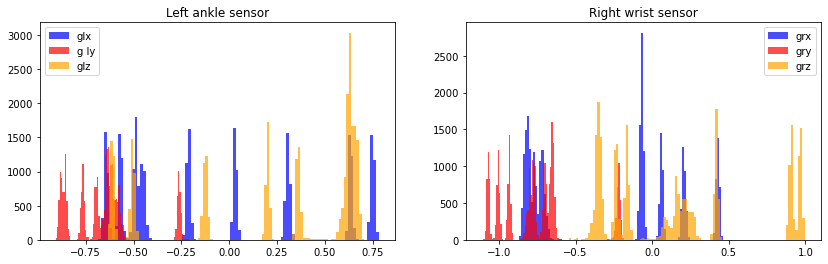

=================================== Sitting and relaxing (1 min) - a ===================================


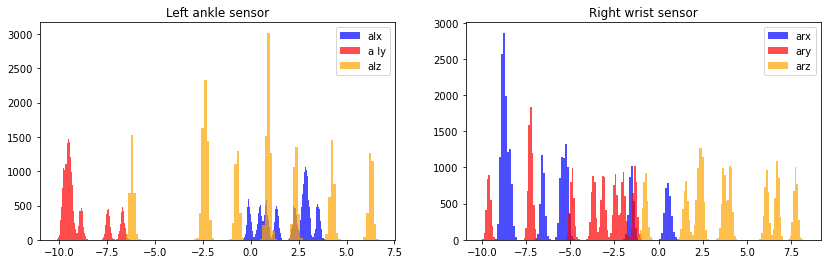

=================================== Sitting and relaxing (1 min) - g ===================================


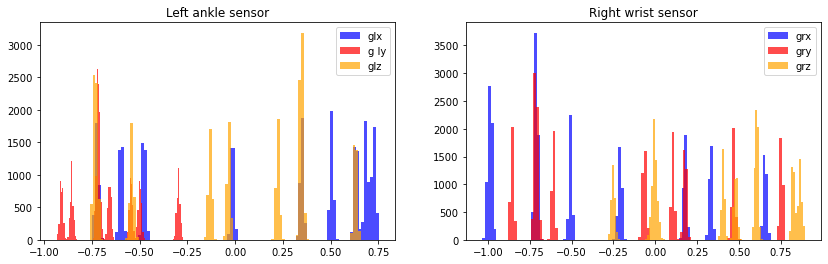

=================================== Lying down (1 min) - a ===================================


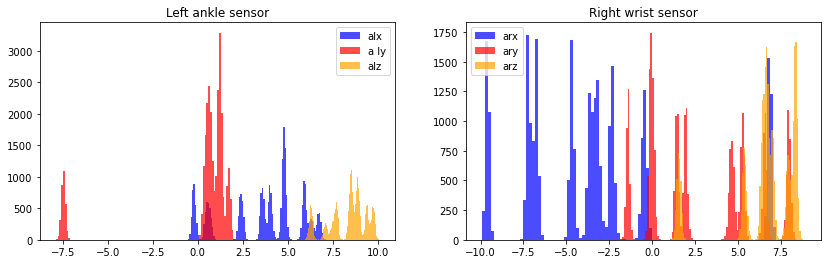

=================================== Lying down (1 min) - g ===================================


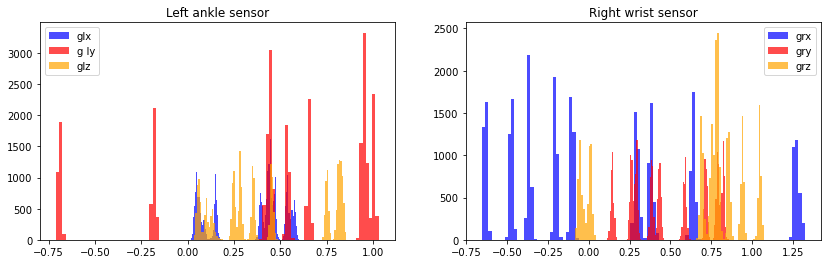

=================================== Walking (1 min) - a ===================================


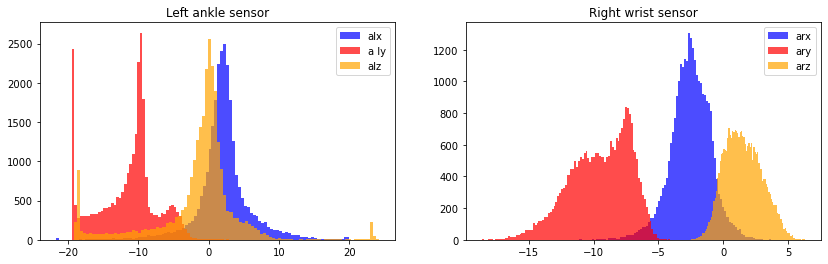

=================================== Walking (1 min) - g ===================================


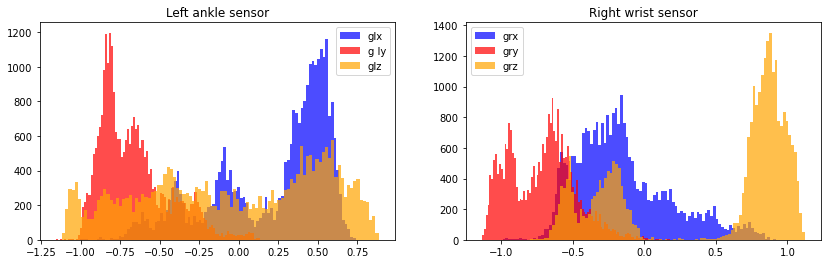

=================================== Climbing stairs (1 min) - a ===================================


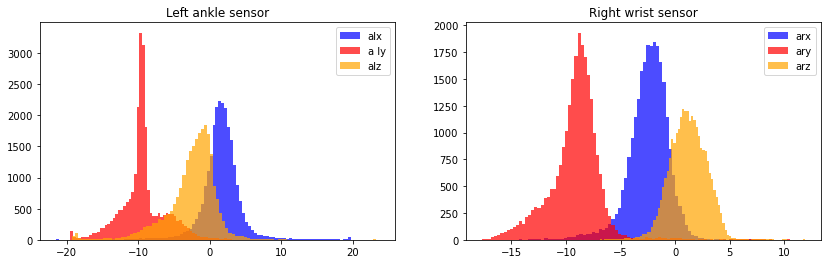

=================================== Climbing stairs (1 min) - g ===================================


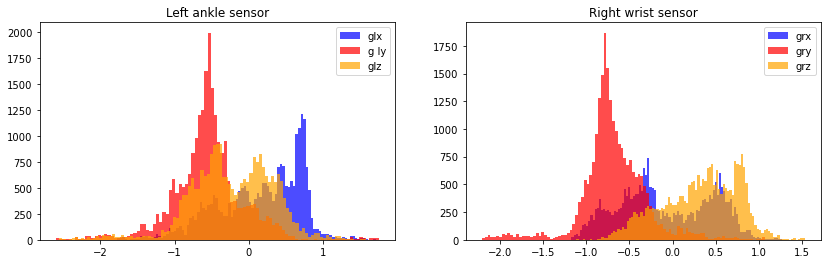

=================================== Waist bends forward (20x) - a ===================================


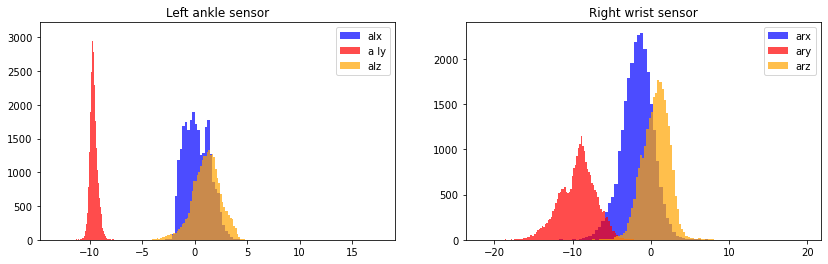

=================================== Waist bends forward (20x) - g ===================================


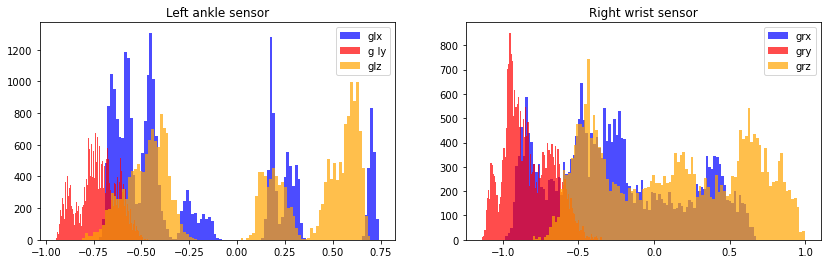

=================================== Frontal elevation of arms (20x) - a ===================================


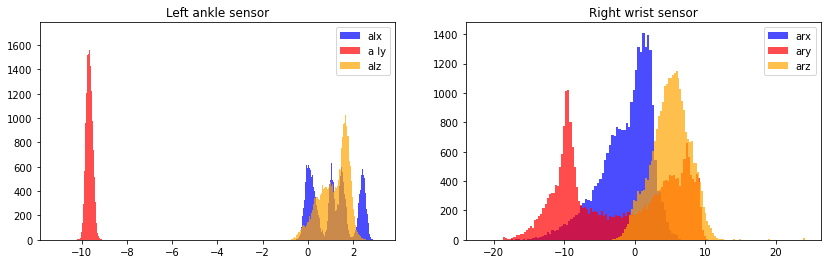

=================================== Frontal elevation of arms (20x) - g ===================================


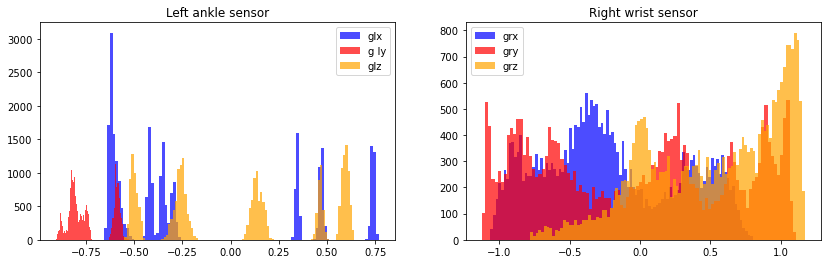

=================================== Knees bending (crouching) (20x) - a ===================================


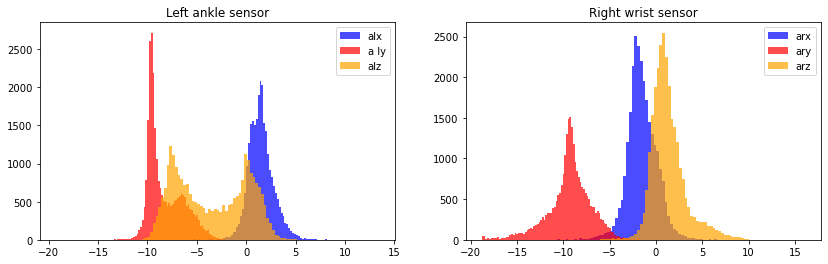

=================================== Knees bending (crouching) (20x) - g ===================================


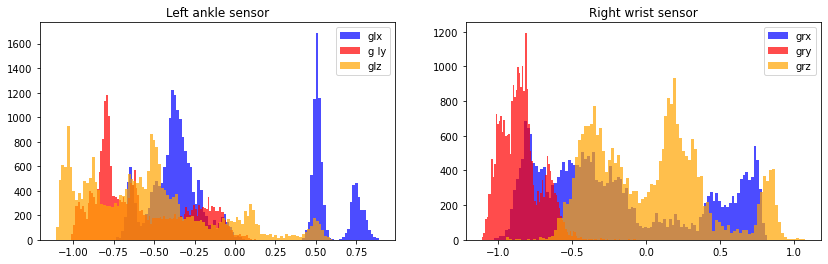

=================================== Cycling (1 min) - a ===================================


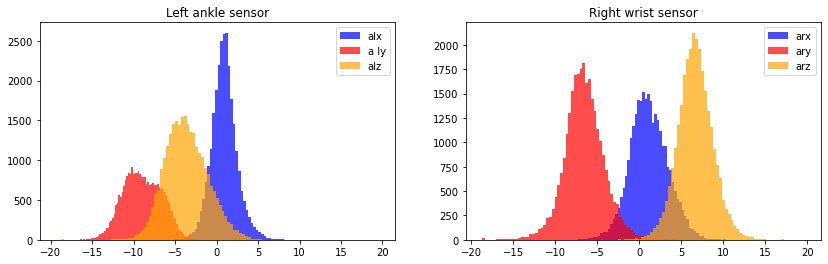

=================================== Cycling (1 min) - g ===================================


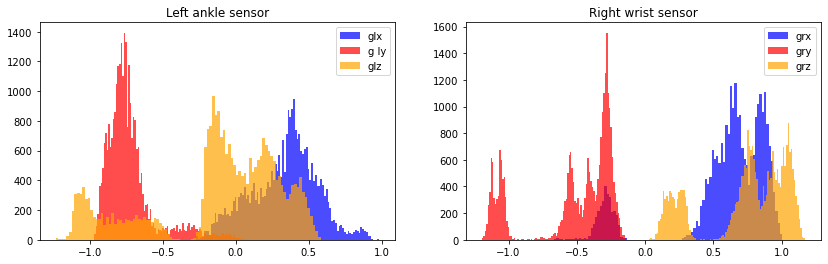

=================================== Jogging (1 min) - a ===================================


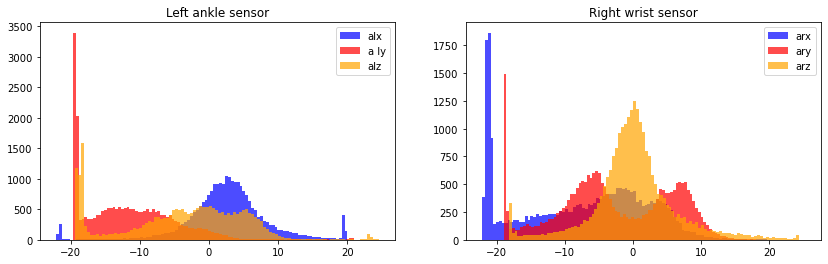

=================================== Jogging (1 min) - g ===================================


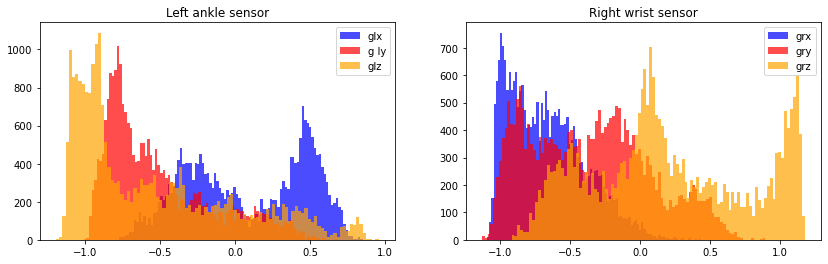

=================================== Running (1 min) - a ===================================


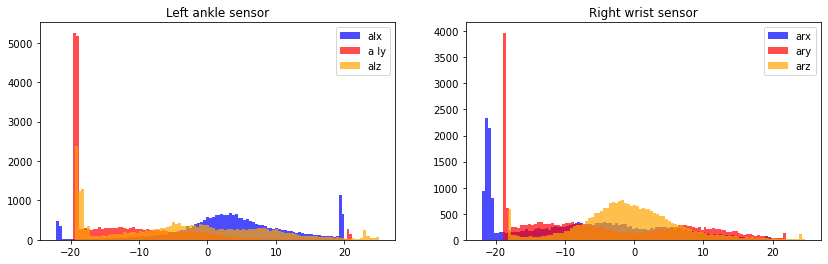

=================================== Running (1 min) - g ===================================


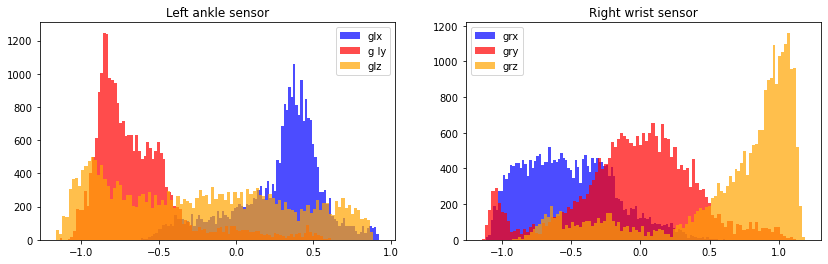

=================================== Jump front & back (20x) - a ===================================


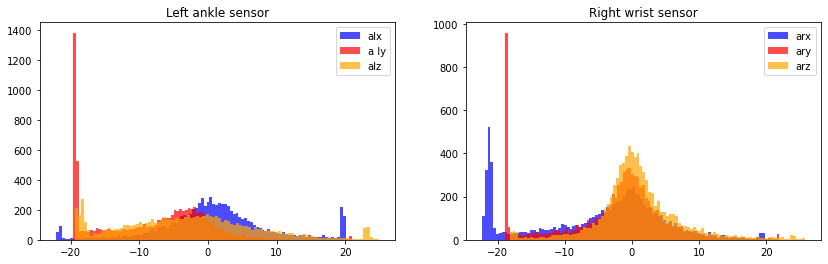

=================================== Jump front & back (20x) - g ===================================


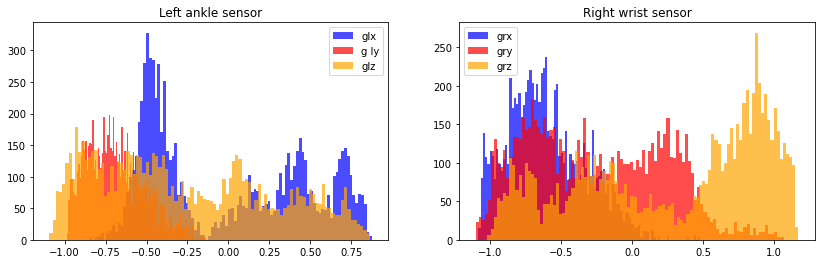

In [24]:
# Distribution plots for each activity and sensor
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +' ly', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

In [25]:
### Subject 4

=================================== Standing still (1 min) - a ===================================


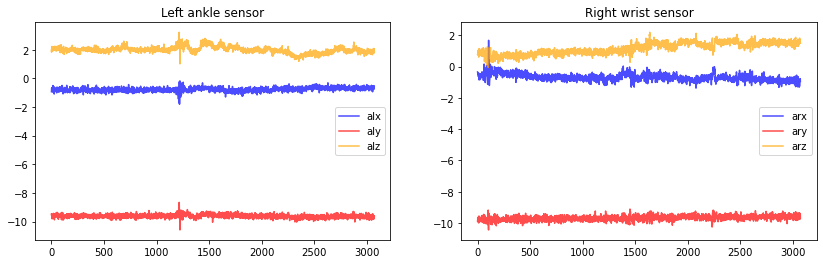

=================================== Standing still (1 min) - g ===================================


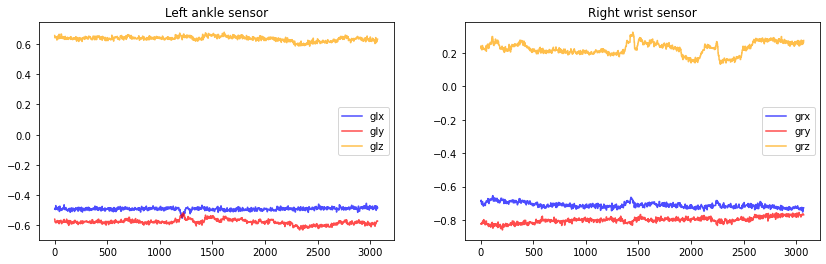

=================================== Sitting and relaxing (1 min) - a ===================================


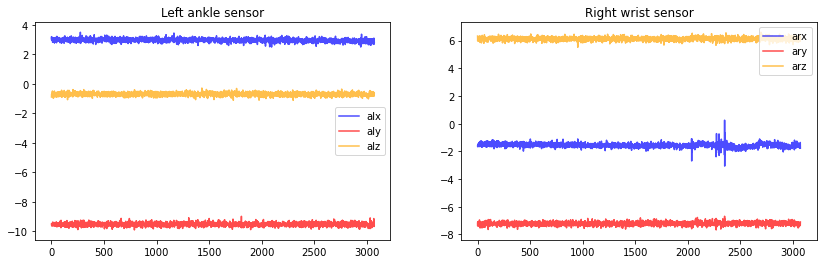

=================================== Sitting and relaxing (1 min) - g ===================================


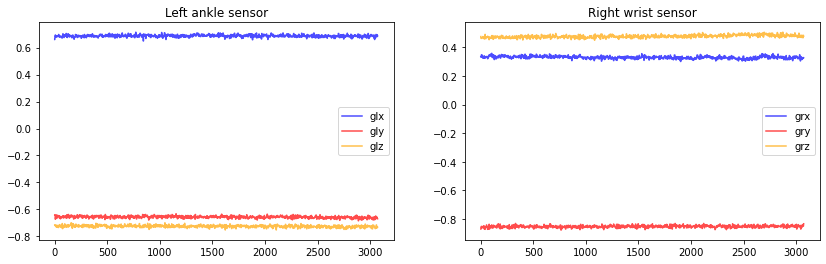

=================================== Lying down (1 min) - a ===================================


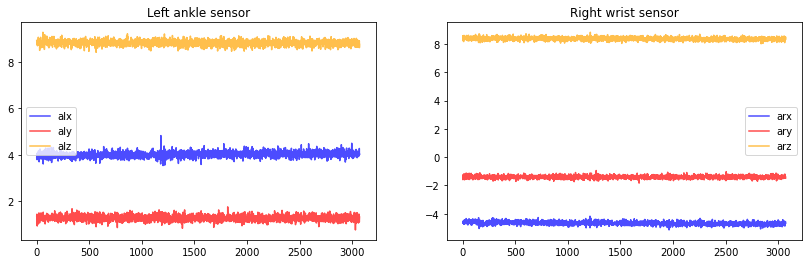

=================================== Lying down (1 min) - g ===================================


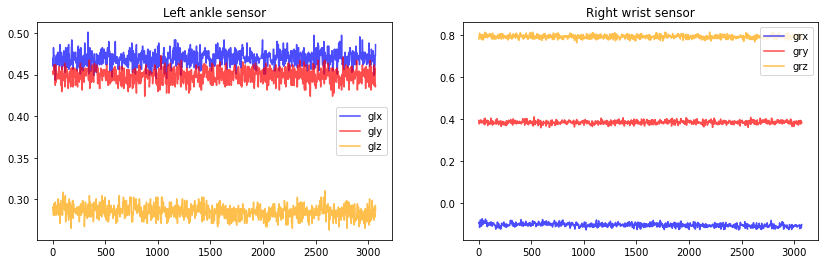

=================================== Walking (1 min) - a ===================================


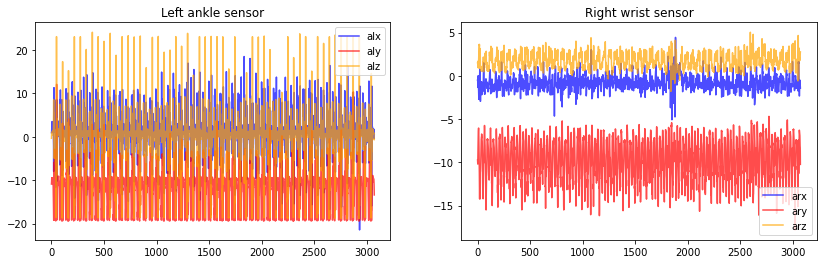

=================================== Walking (1 min) - g ===================================


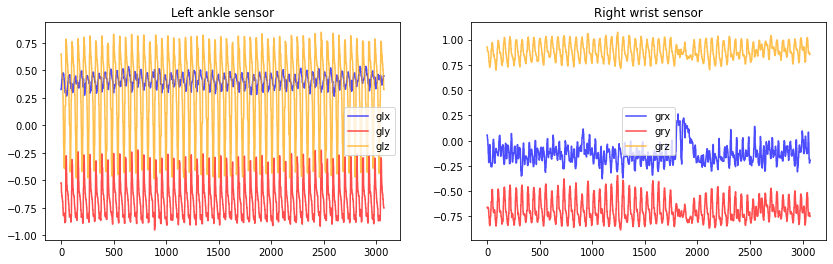

=================================== Climbing stairs (1 min) - a ===================================


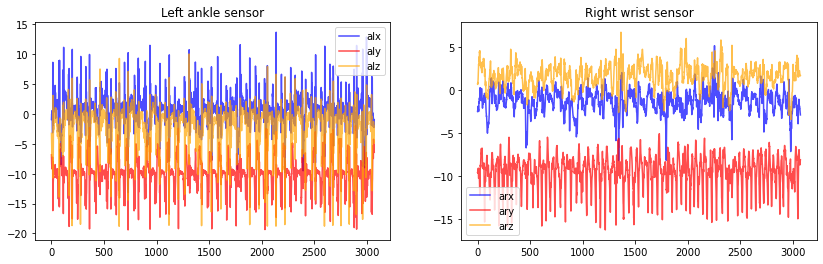

=================================== Climbing stairs (1 min) - g ===================================


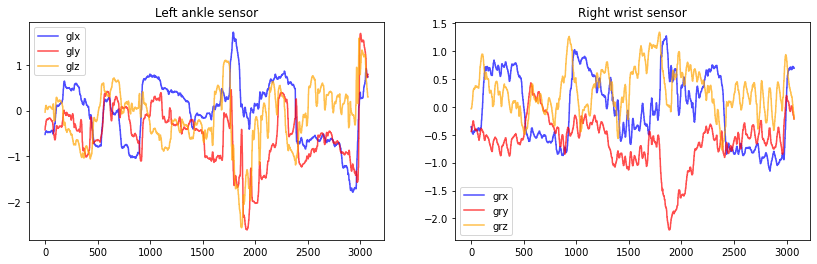

=================================== Waist bends forward (20x) - a ===================================


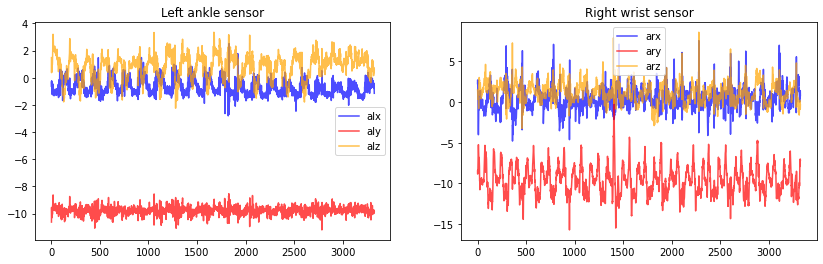

=================================== Waist bends forward (20x) - g ===================================


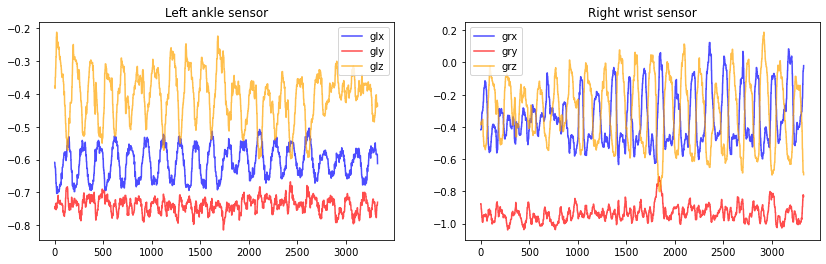

=================================== Frontal elevation of arms (20x) - a ===================================


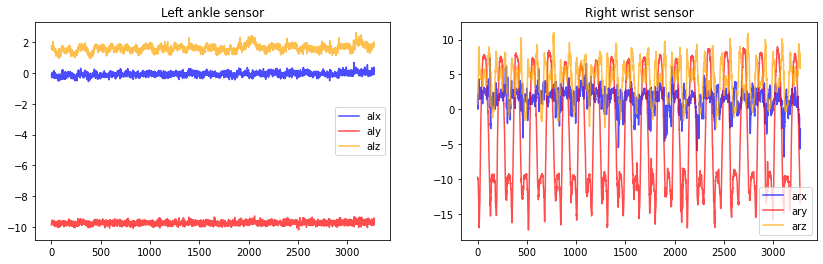

=================================== Frontal elevation of arms (20x) - g ===================================


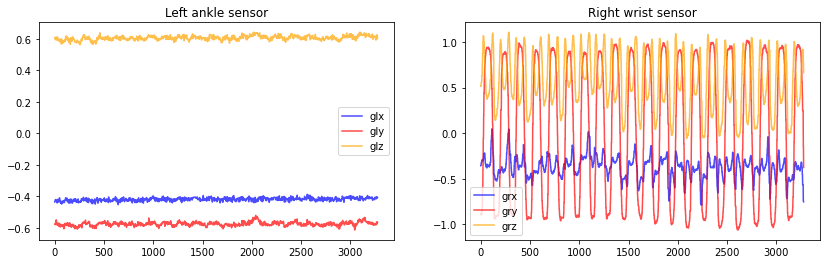

=================================== Knees bending (crouching) (20x) - a ===================================


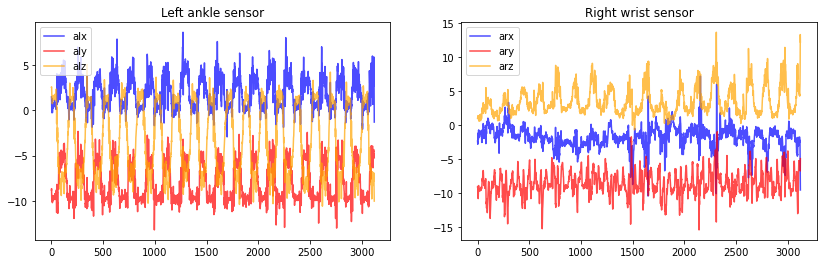

=================================== Knees bending (crouching) (20x) - g ===================================


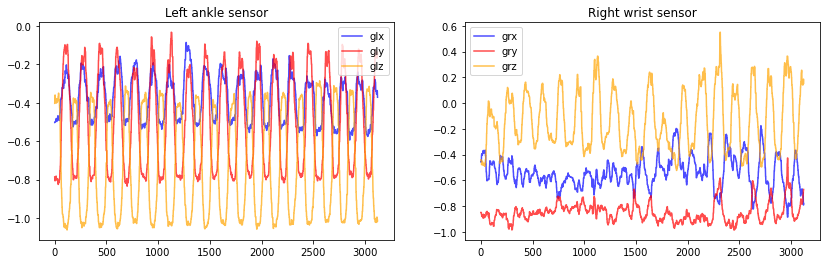

=================================== Cycling (1 min) - a ===================================


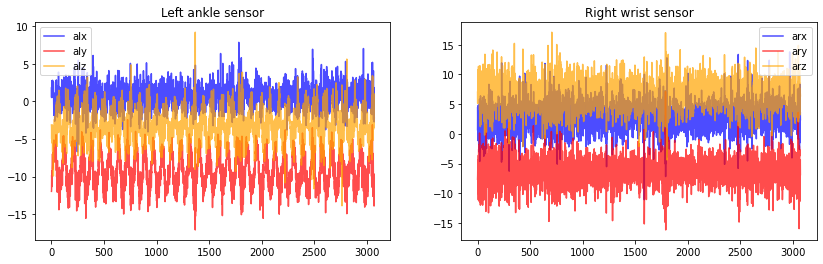

=================================== Cycling (1 min) - g ===================================


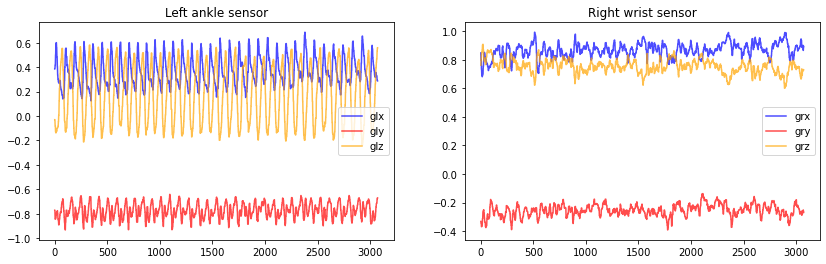

=================================== Jogging (1 min) - a ===================================


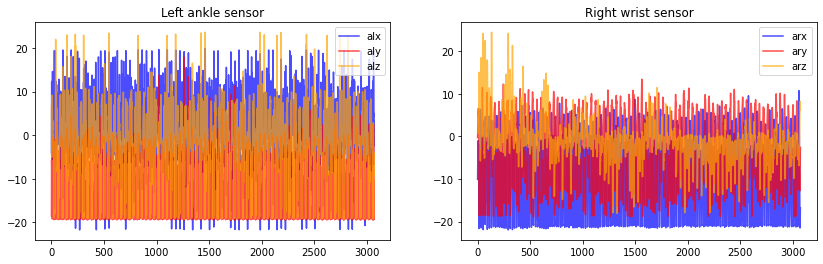

=================================== Jogging (1 min) - g ===================================


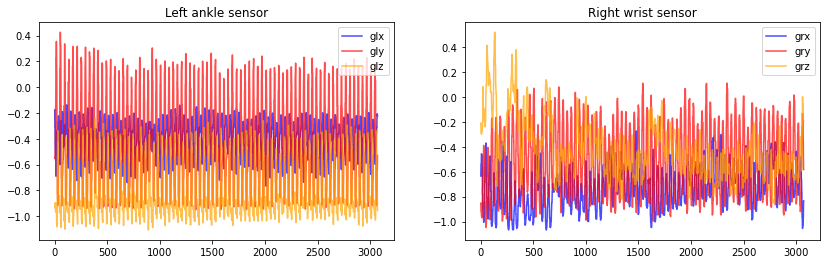

=================================== Running (1 min) - a ===================================


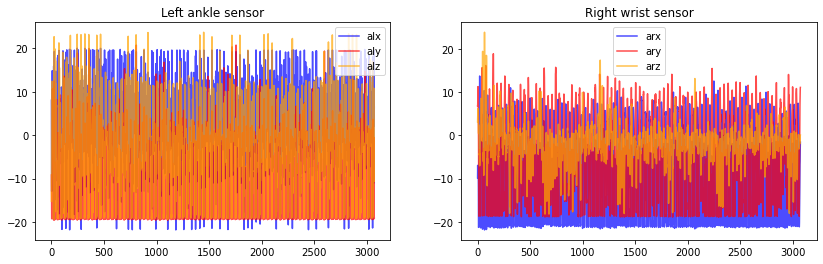

=================================== Running (1 min) - g ===================================


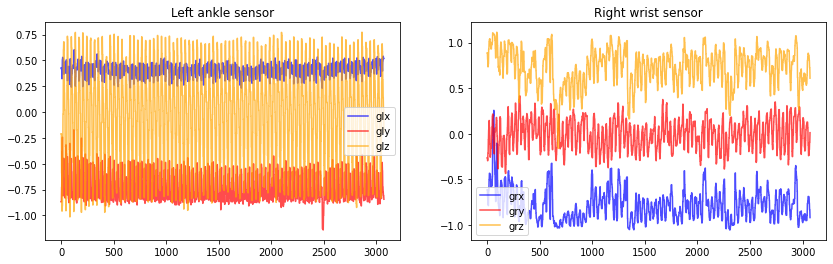

=================================== Jump front & back (20x) - a ===================================


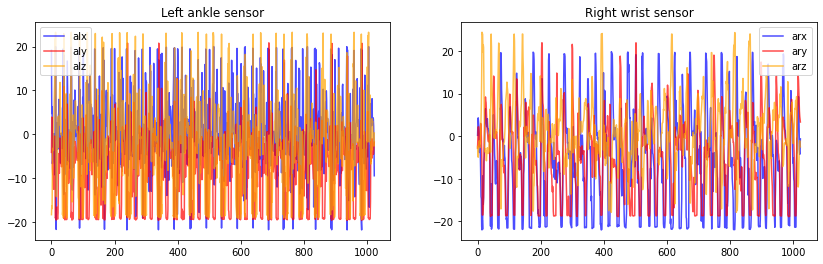

=================================== Jump front & back (20x) - g ===================================


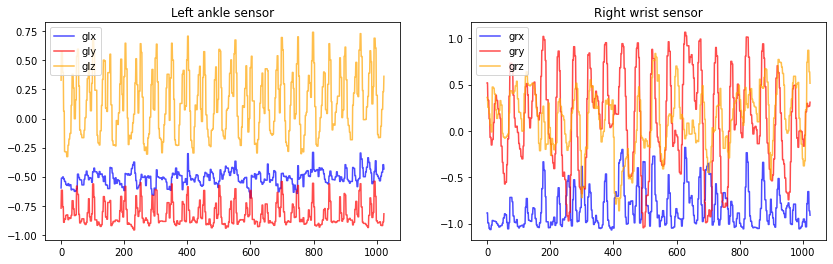

In [26]:
# Create plots for one particular subject performing the activities - using subject 2 
# Each plot section divided by activity and type of reading taken
subject_4 = df[df['subject'] == 'subject4']
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx')
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +'ly')
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz')
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx')
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry')
        plt.plot(subject_4[subject_4['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

=================================== Standing still (1 min) - a ===================================


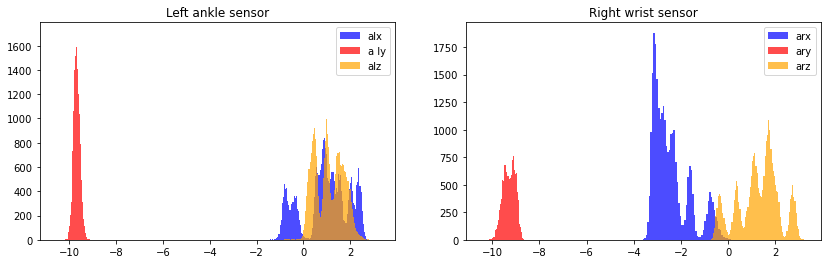

=================================== Standing still (1 min) - g ===================================


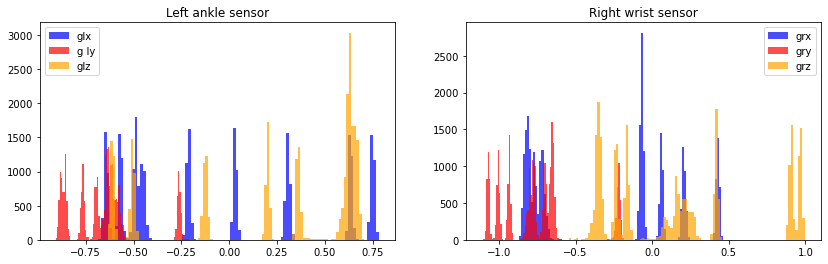

=================================== Sitting and relaxing (1 min) - a ===================================


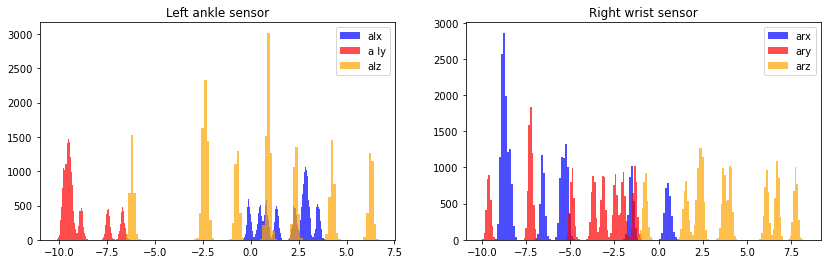

=================================== Sitting and relaxing (1 min) - g ===================================


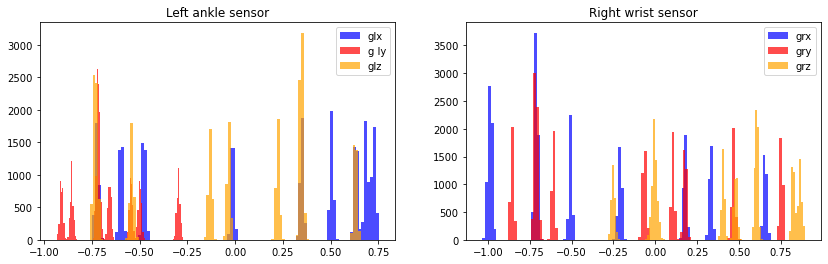

=================================== Lying down (1 min) - a ===================================


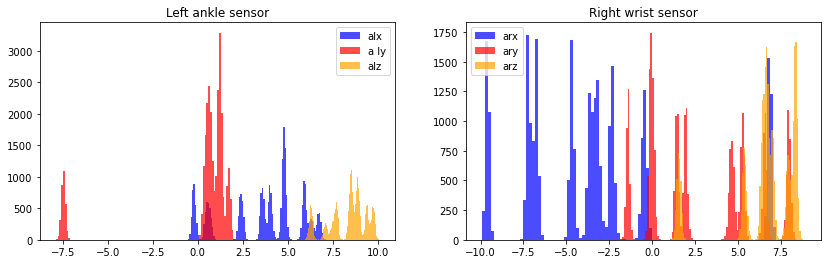

=================================== Lying down (1 min) - g ===================================


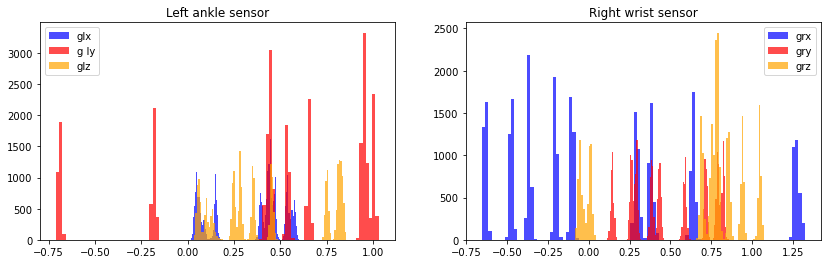

=================================== Walking (1 min) - a ===================================


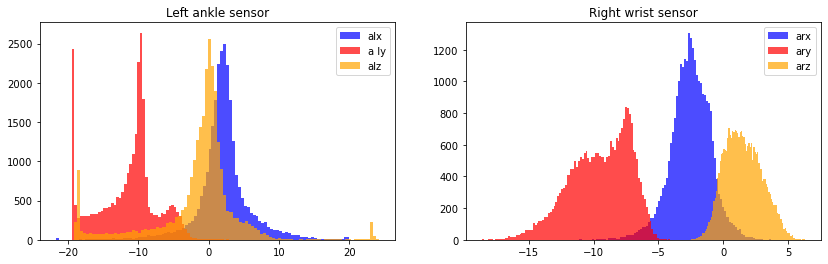

=================================== Walking (1 min) - g ===================================


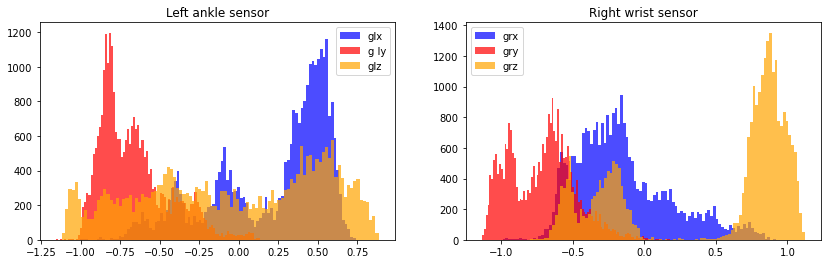

=================================== Climbing stairs (1 min) - a ===================================


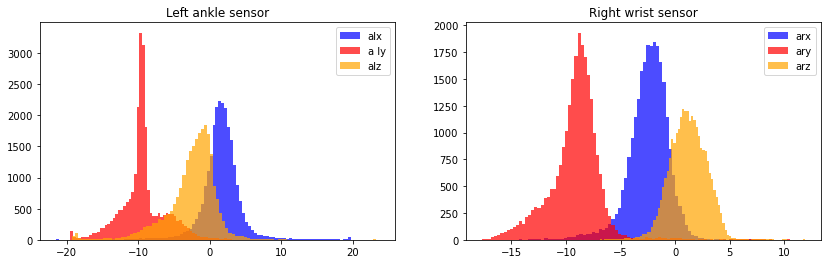

=================================== Climbing stairs (1 min) - g ===================================


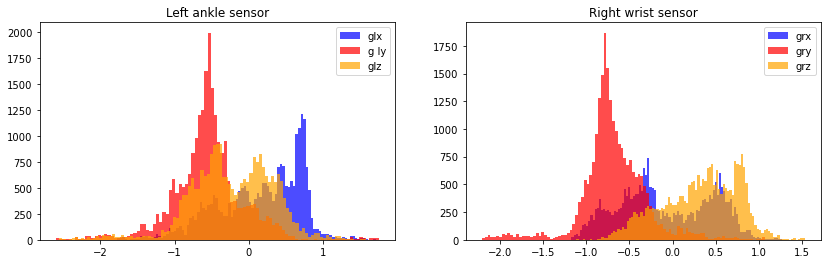

=================================== Waist bends forward (20x) - a ===================================


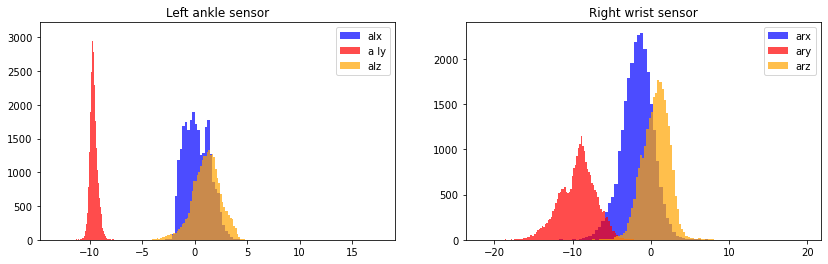

=================================== Waist bends forward (20x) - g ===================================


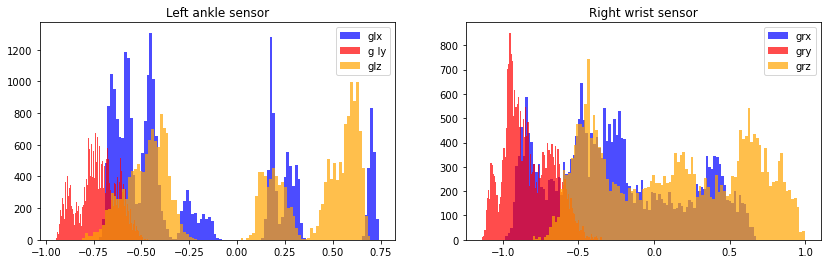

=================================== Frontal elevation of arms (20x) - a ===================================


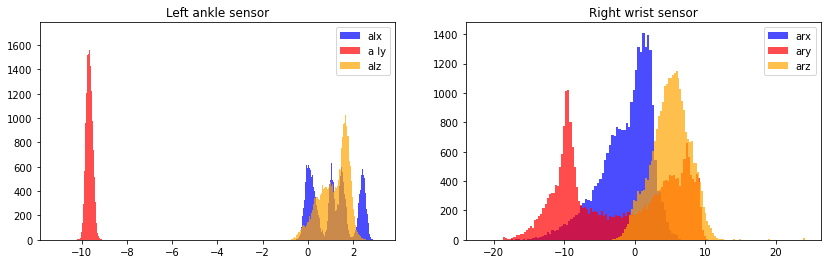

=================================== Frontal elevation of arms (20x) - g ===================================


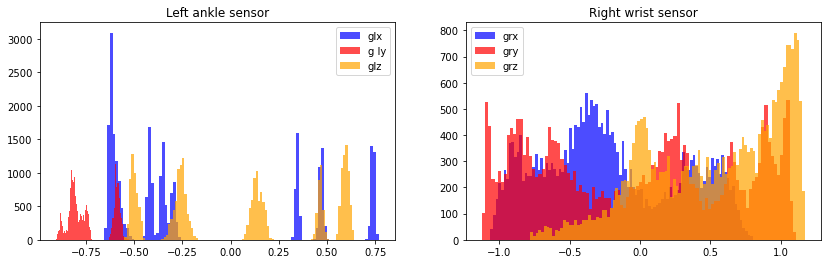

=================================== Knees bending (crouching) (20x) - a ===================================


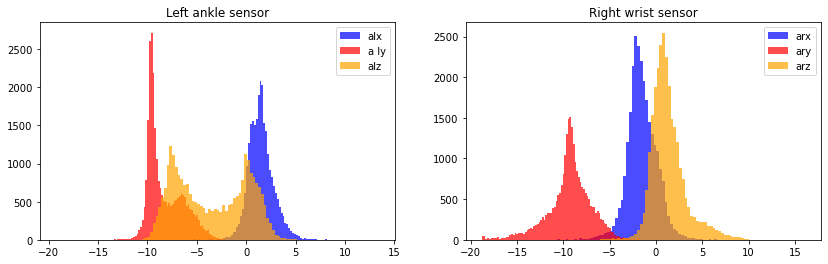

=================================== Knees bending (crouching) (20x) - g ===================================


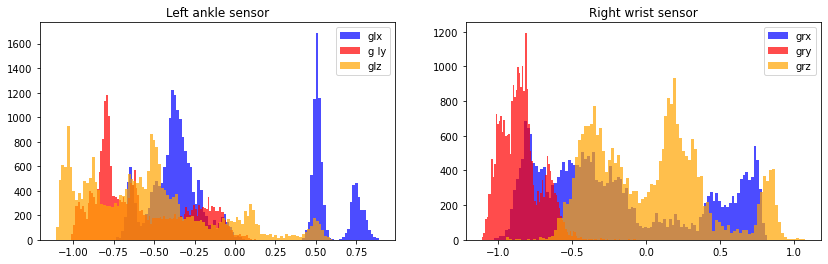

=================================== Cycling (1 min) - a ===================================


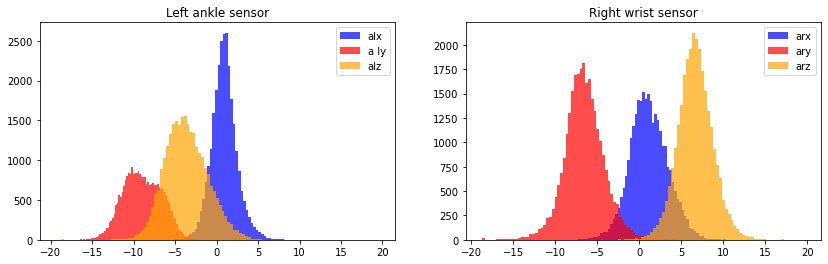

=================================== Cycling (1 min) - g ===================================


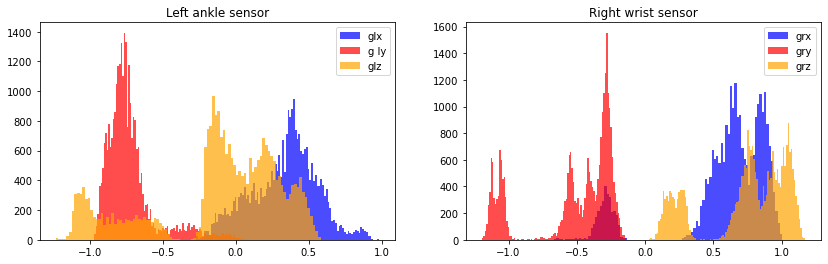

=================================== Jogging (1 min) - a ===================================


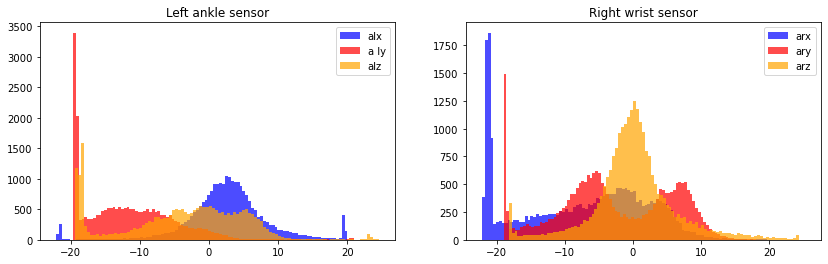

=================================== Jogging (1 min) - g ===================================


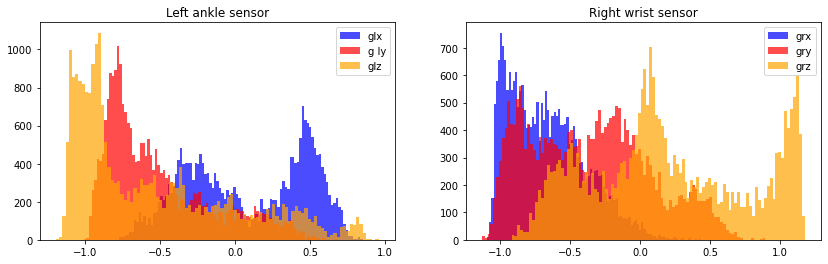

=================================== Running (1 min) - a ===================================


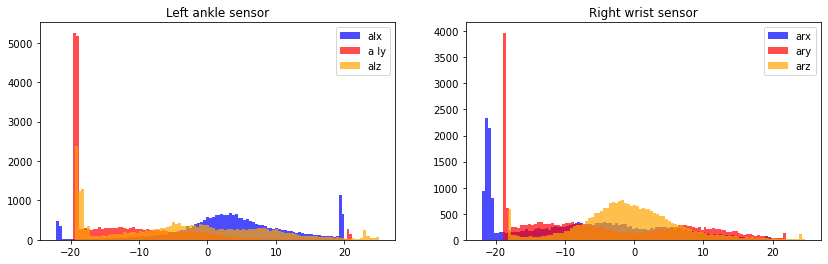

=================================== Running (1 min) - g ===================================


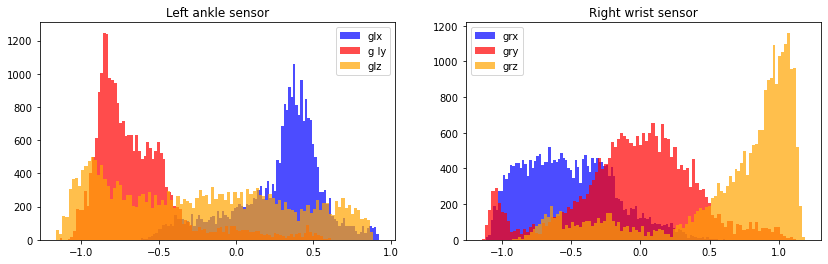

=================================== Jump front & back (20x) - a ===================================


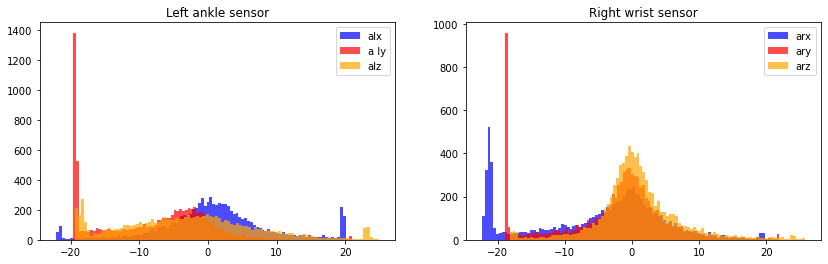

=================================== Jump front & back (20x) - g ===================================


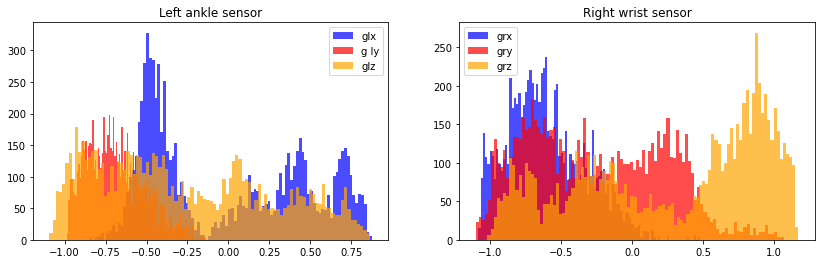

In [27]:
# Distribution plots for each activity and sensor
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +' ly', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

In [28]:
### Subject 9

=================================== Standing still (1 min) - a ===================================


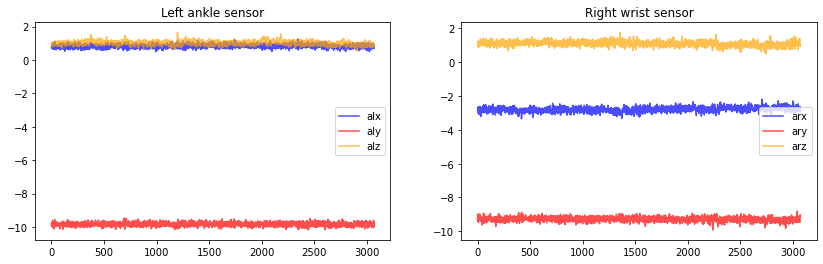

=================================== Standing still (1 min) - g ===================================


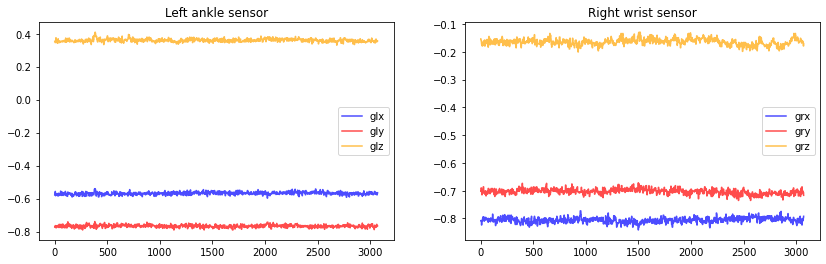

=================================== Sitting and relaxing (1 min) - a ===================================


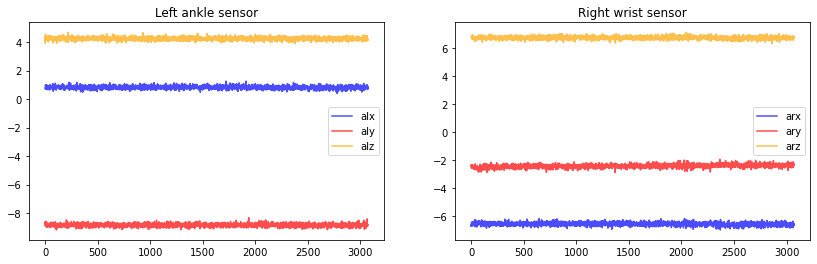

=================================== Sitting and relaxing (1 min) - g ===================================


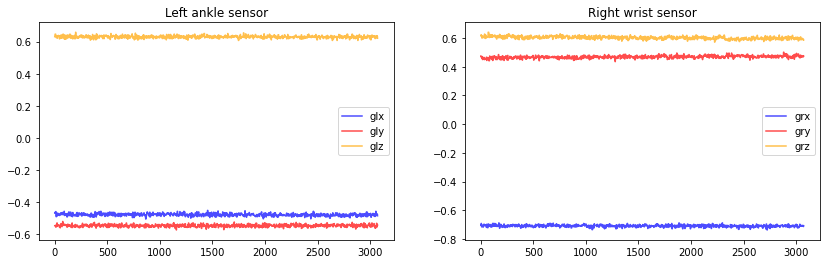

=================================== Lying down (1 min) - a ===================================


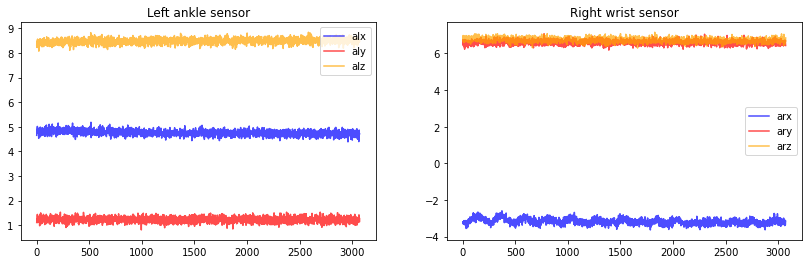

=================================== Lying down (1 min) - g ===================================


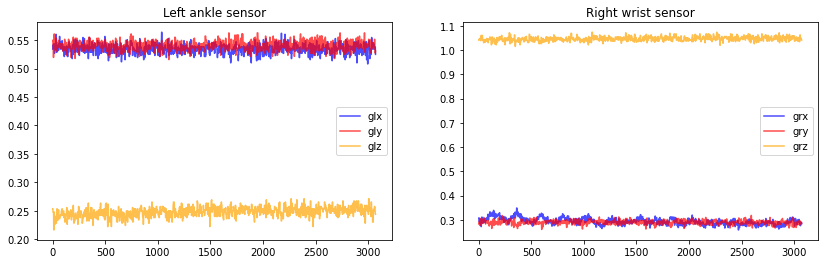

=================================== Walking (1 min) - a ===================================


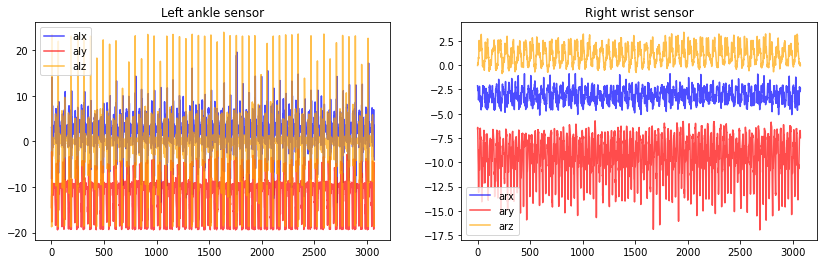

=================================== Walking (1 min) - g ===================================


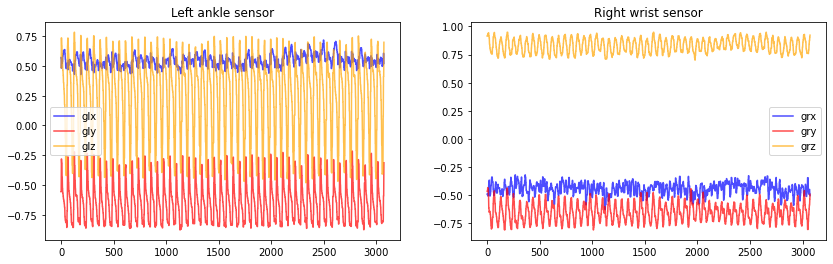

=================================== Climbing stairs (1 min) - a ===================================


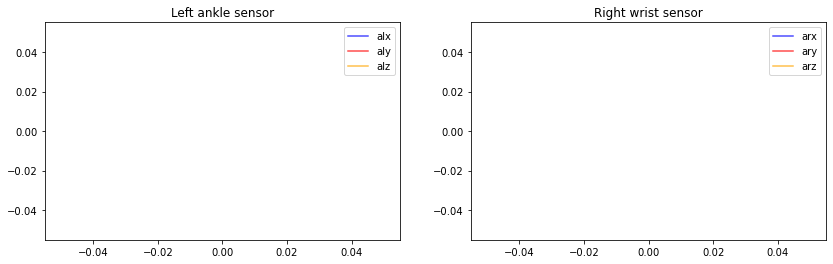

=================================== Climbing stairs (1 min) - g ===================================


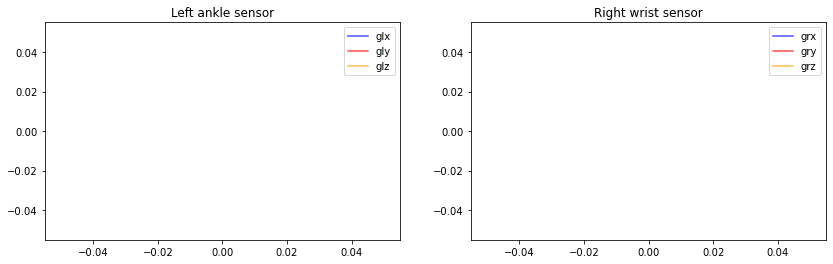

=================================== Waist bends forward (20x) - a ===================================


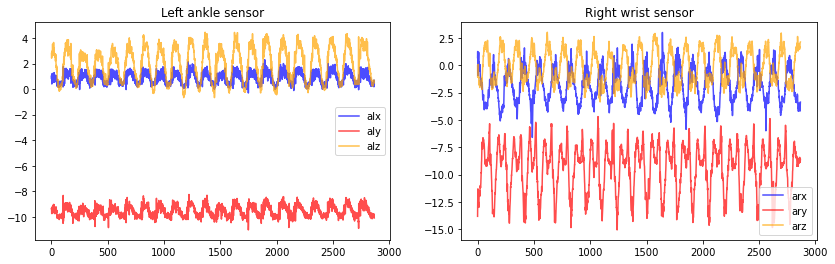

=================================== Waist bends forward (20x) - g ===================================


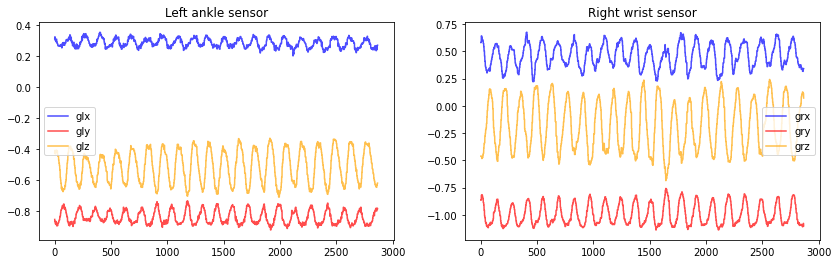

=================================== Frontal elevation of arms (20x) - a ===================================


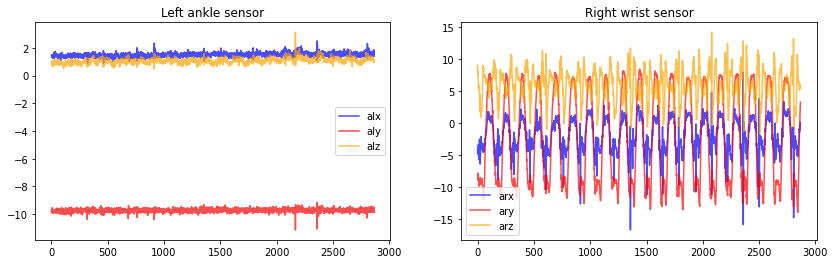

=================================== Frontal elevation of arms (20x) - g ===================================


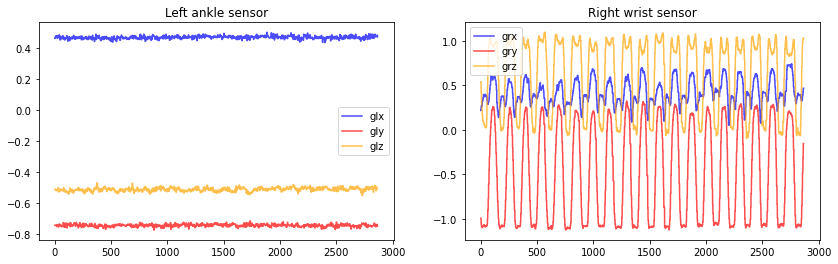

=================================== Knees bending (crouching) (20x) - a ===================================


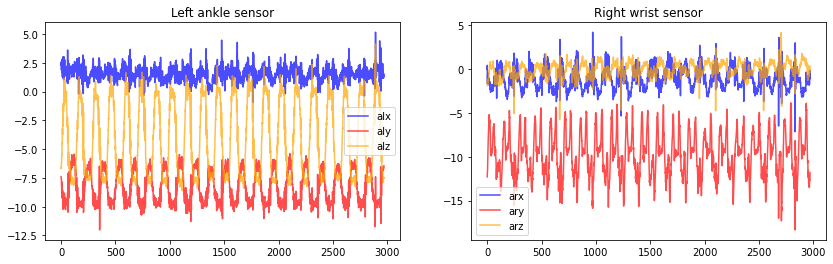

=================================== Knees bending (crouching) (20x) - g ===================================


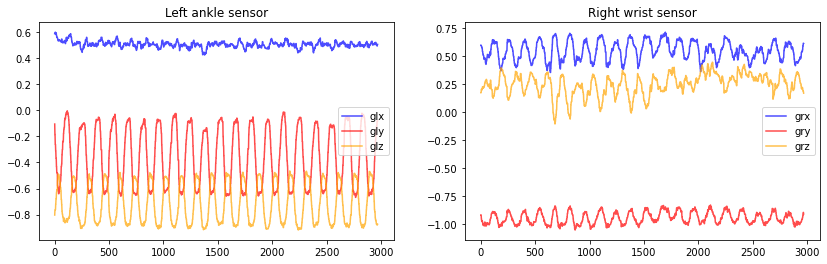

=================================== Cycling (1 min) - a ===================================


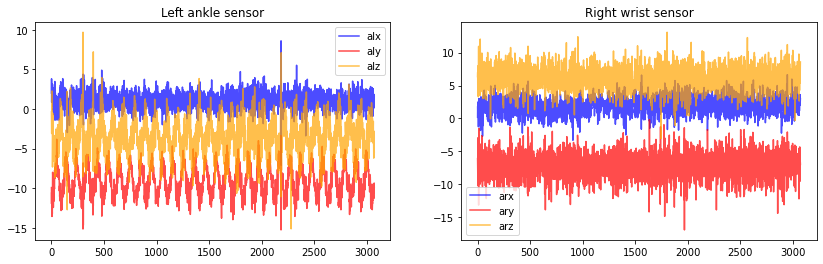

=================================== Cycling (1 min) - g ===================================


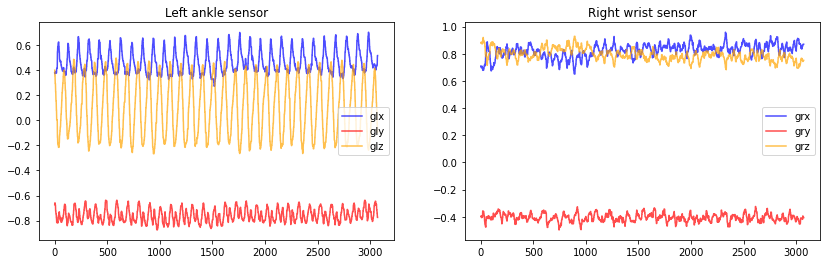

=================================== Jogging (1 min) - a ===================================


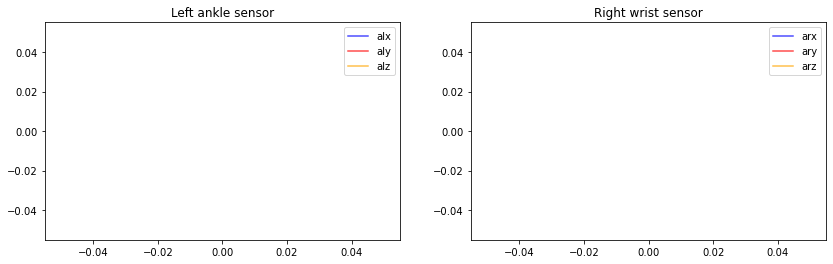

=================================== Jogging (1 min) - g ===================================


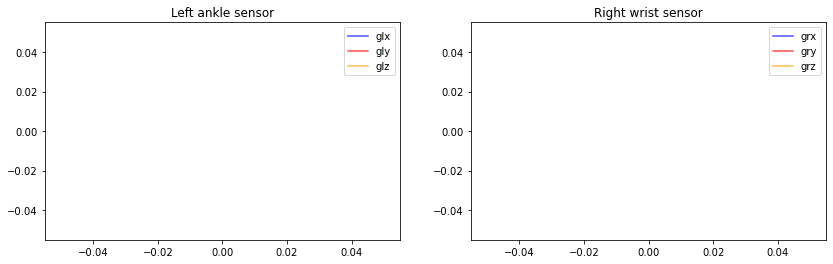

=================================== Running (1 min) - a ===================================


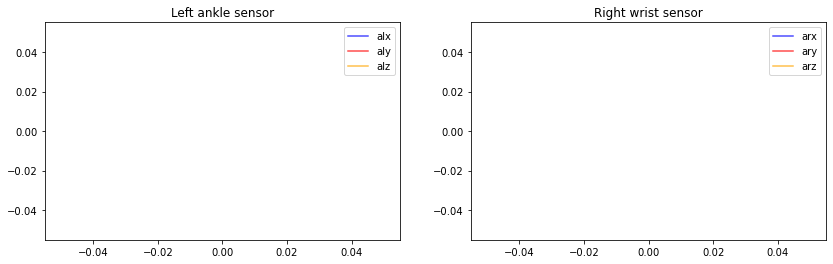

=================================== Running (1 min) - g ===================================


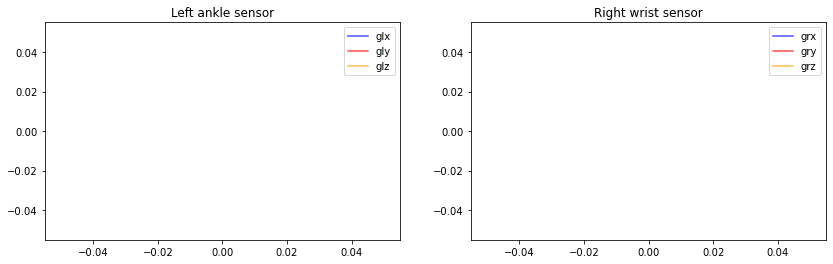

=================================== Jump front & back (20x) - a ===================================


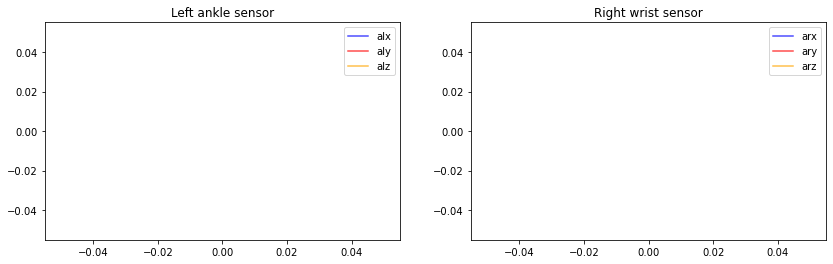

=================================== Jump front & back (20x) - g ===================================


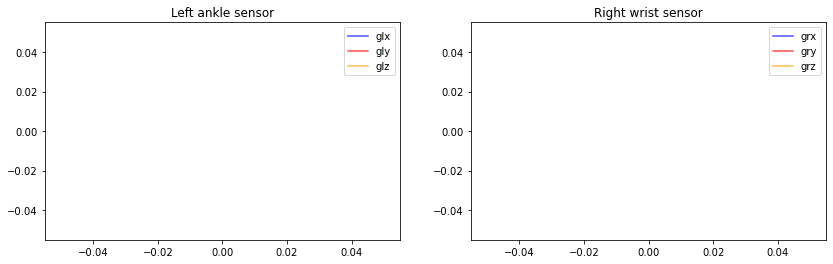

In [29]:
# Create plots for one particular subject performing the activities - using subject 2 
# Each plot section divided by activity and type of reading taken
subject_9 = df[df['subject'] == 'subject9']
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx')
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +'ly')
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz')
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx')
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry')
        plt.plot(subject_9[subject_9['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz')
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

=================================== Standing still (1 min) - a ===================================


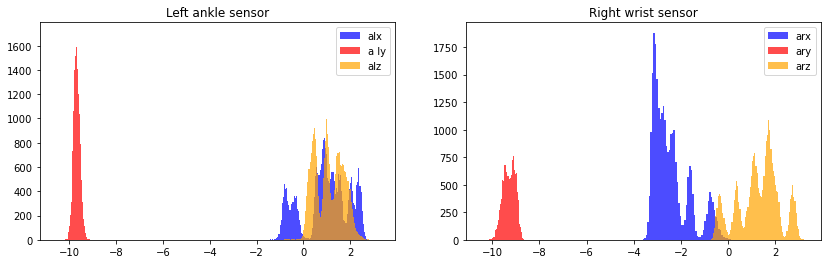

=================================== Standing still (1 min) - g ===================================


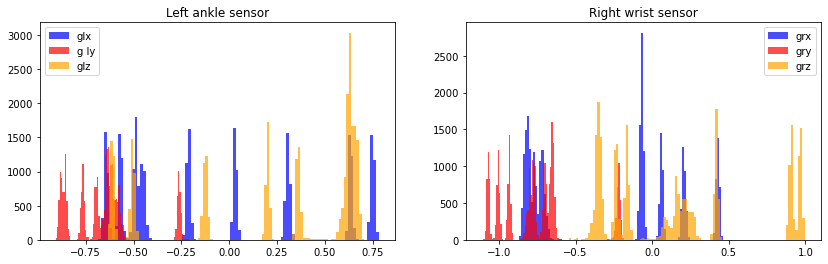

=================================== Sitting and relaxing (1 min) - a ===================================


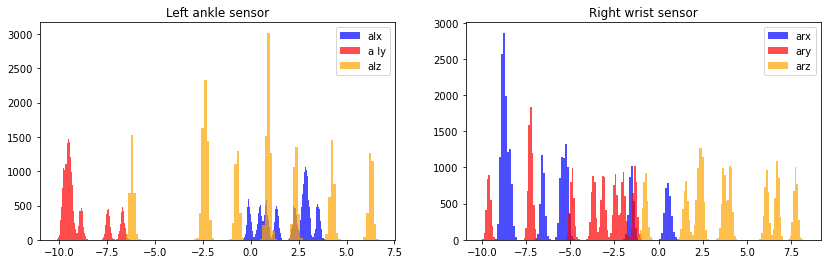

=================================== Sitting and relaxing (1 min) - g ===================================


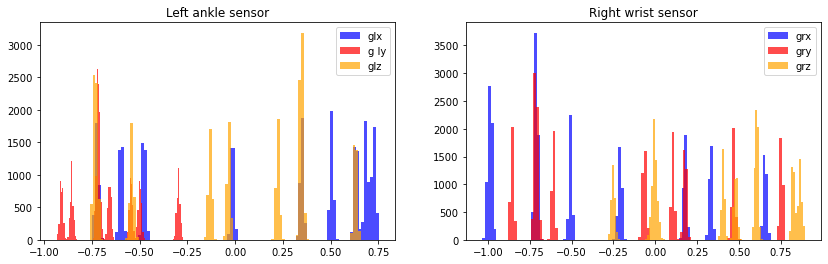

=================================== Lying down (1 min) - a ===================================


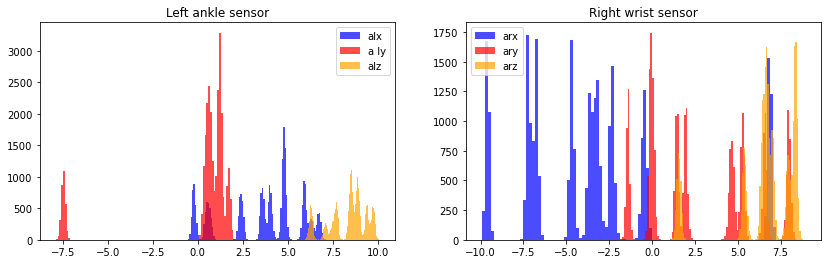

=================================== Lying down (1 min) - g ===================================


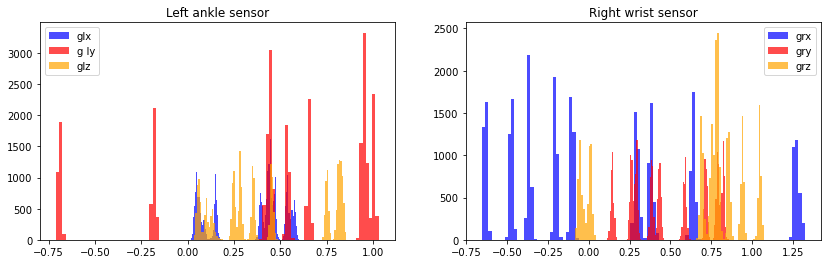

=================================== Walking (1 min) - a ===================================


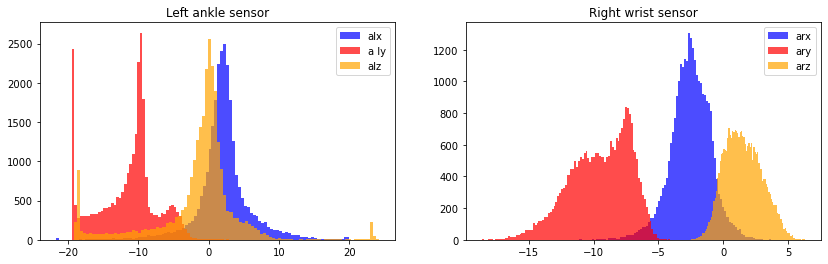

=================================== Walking (1 min) - g ===================================


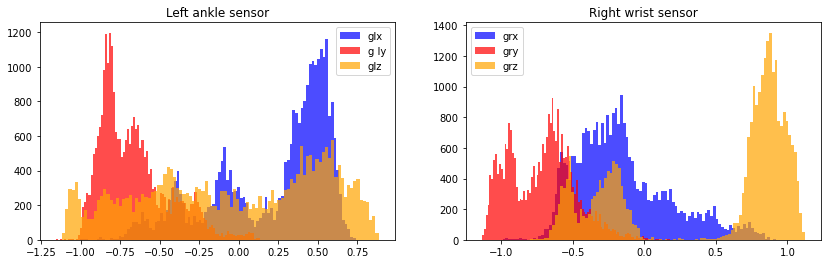

=================================== Climbing stairs (1 min) - a ===================================


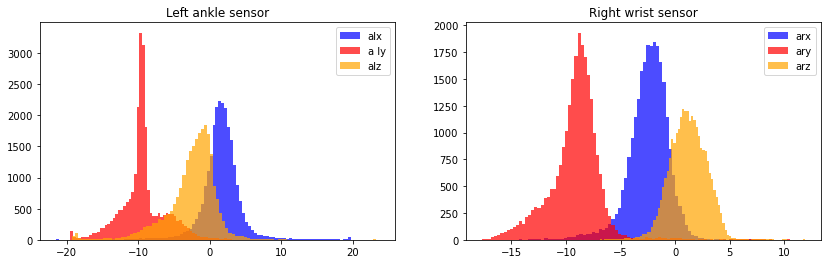

=================================== Climbing stairs (1 min) - g ===================================


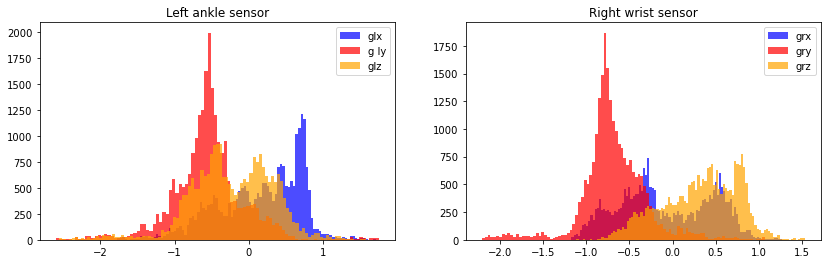

=================================== Waist bends forward (20x) - a ===================================


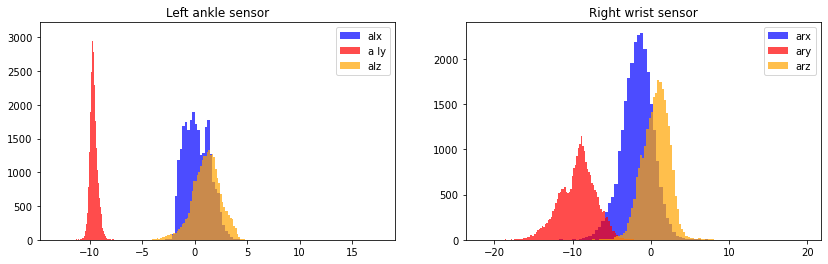

=================================== Waist bends forward (20x) - g ===================================


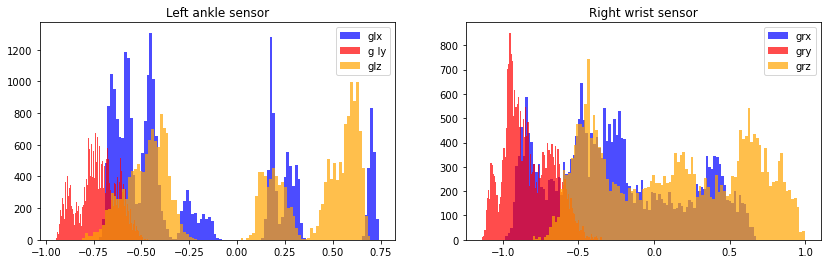

=================================== Frontal elevation of arms (20x) - a ===================================


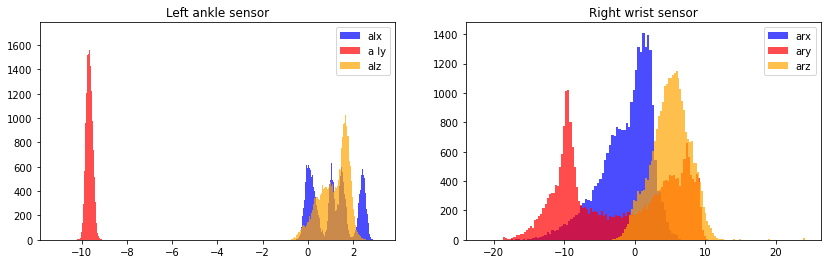

=================================== Frontal elevation of arms (20x) - g ===================================


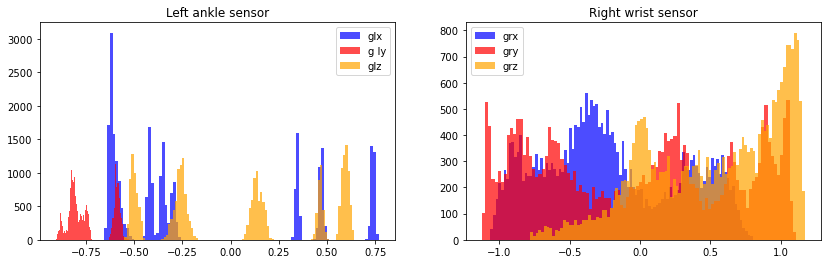

=================================== Knees bending (crouching) (20x) - a ===================================


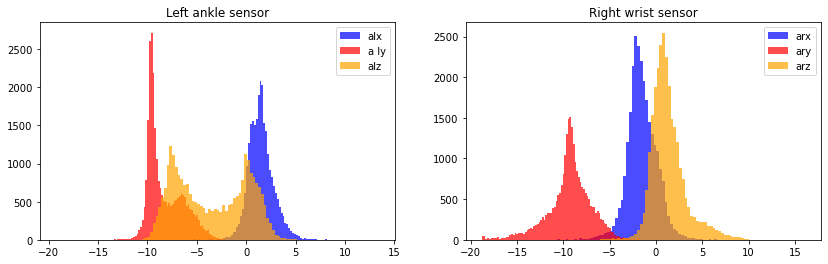

=================================== Knees bending (crouching) (20x) - g ===================================


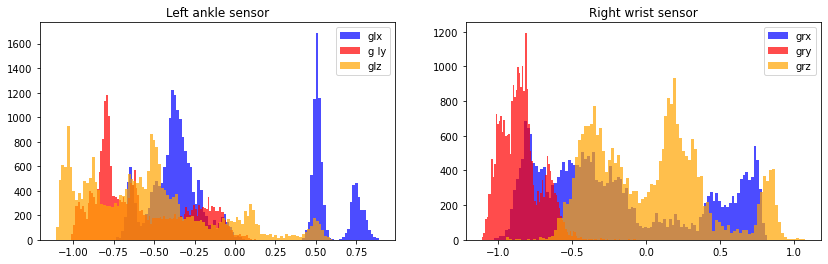

=================================== Cycling (1 min) - a ===================================


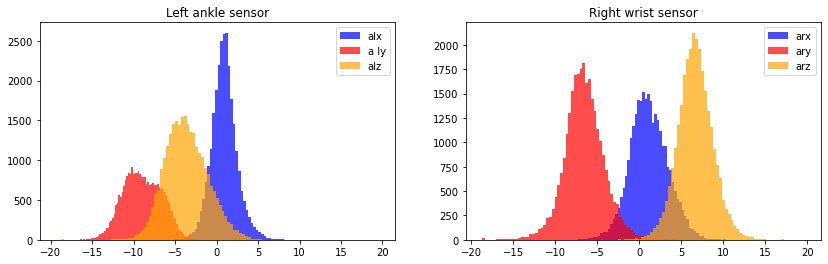

=================================== Cycling (1 min) - g ===================================


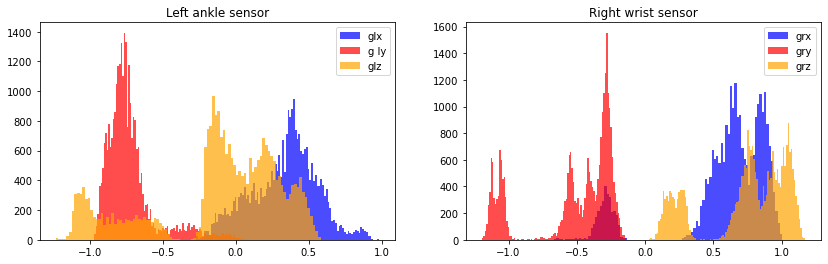

=================================== Jogging (1 min) - a ===================================


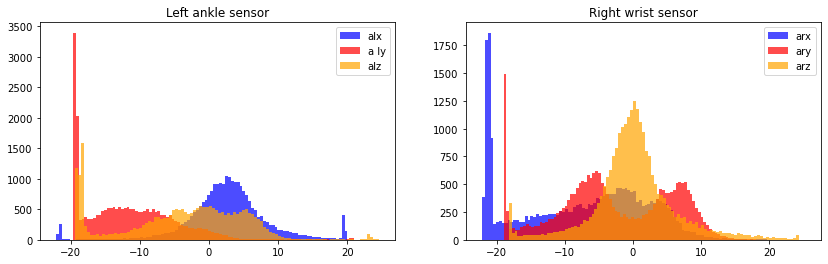

=================================== Jogging (1 min) - g ===================================


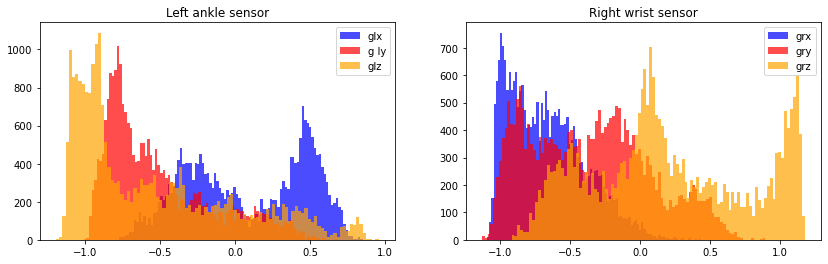

=================================== Running (1 min) - a ===================================


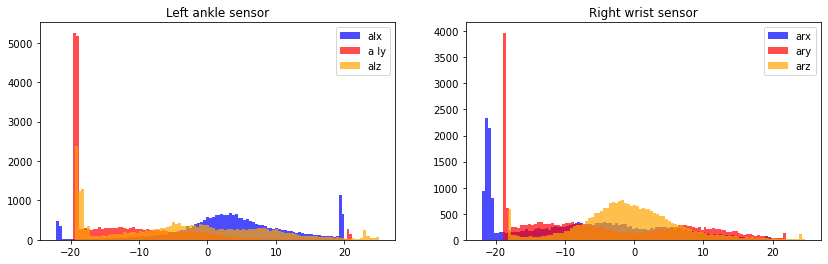

=================================== Running (1 min) - g ===================================


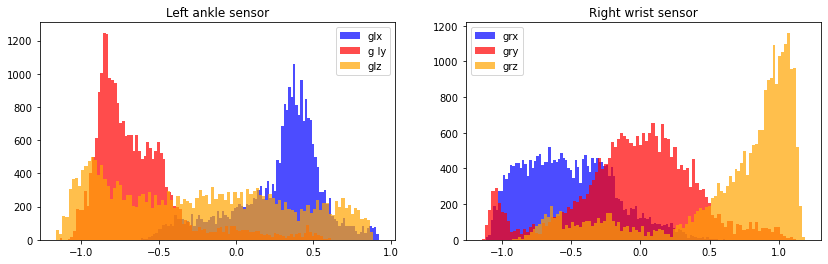

=================================== Jump front & back (20x) - a ===================================


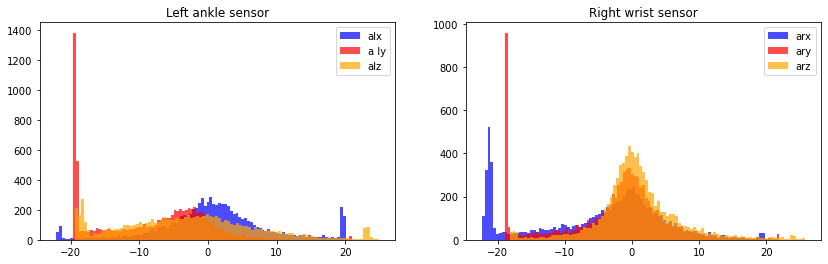

=================================== Jump front & back (20x) - g ===================================


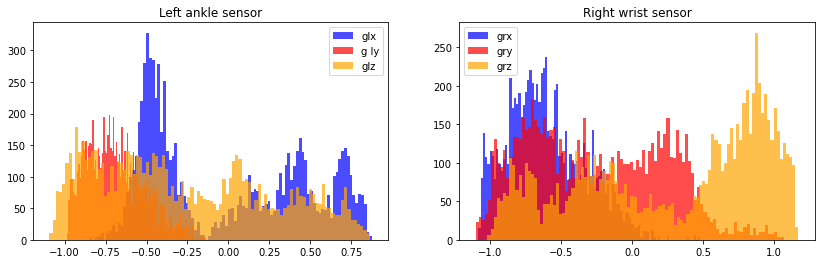

In [30]:
# Distribution plots for each activity and sensor
readings = ['a', 'g']

for i in range(1, 13):
    for r in readings:

        print(f'=================================== {activities_label[i]} - {r} ===================================')
        
        plt.figure(figsize=(14,4))
        plt.subplot(1,2,1)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lx'], color='blue', alpha=.7, label= r + 'lx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ly'],color='red', alpha=.7, label= r +' ly', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'lz'],color='orange', alpha=.7, label= r + 'lz', bins=100)
        plt.title('Left ankle sensor')
        plt.legend()
        
        plt.subplot(1,2,2)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rx'], color='blue', alpha=.7, label= r + 'rx', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'ry'],color='red', alpha=.7, label= r + 'ry', bins=100)
        plt.hist(df[df['Activity']==i].reset_index(drop=True)[r + 'rz'],color='orange', alpha=.7, label= r + 'rz', bins=100)
        plt.title('Right wrist sensor')
        plt.legend()
        plt.show()

## Decoding

In [31]:
#### the discrete column (Activity)from the dataset needs to be repaired :

In [32]:
df['Activity'] = df['Activity'].replace([0,1,2,3,4,5,6,7,8,9,10,11,12],['None','Standing still (1 min)', 'Sitting and relaxing (1 min)', 'Lying down (1 min)', 'Walking (1 min)','Climbing stairs (1 min)','Waist bends forward (20x)','Frontal elevation of arms (20x)','Knees bending (crouching) (20x)','Cycling (1 min)','Jogging (1 min)','Running (1 min)','Jump front & back (20x)'])
df['Activity']

647386                None
430596                None
583321                None
204883                None
603933                None
                ...       
1046268    Cycling (1 min)
1046269    Cycling (1 min)
1046270    Cycling (1 min)
1046271    Cycling (1 min)
1046272    Cycling (1 min)
Name: Activity, Length: 339214, dtype: object

In [33]:
df.Activity.value_counts()

None                               40000
Standing still (1 min)             27648
Sitting and relaxing (1 min)       27648
Lying down (1 min)                 27648
Walking (1 min)                    27648
Cycling (1 min)                    27648
Frontal elevation of arms (20x)    26676
Knees bending (crouching) (20x)    26470
Waist bends forward (20x)          25857
Jogging (1 min)                    24576
Running (1 min)                    24576
Climbing stairs (1 min)            24576
Jump front & back (20x)             8243
Name: Activity, dtype: int64

<AxesSubplot:ylabel='Activity'>

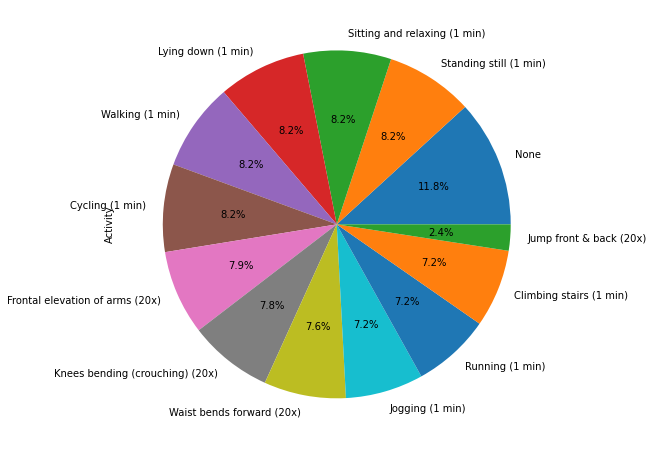

In [34]:
plt.figure(figsize=(12,8))
round(df["Activity"].value_counts()/df.shape[0]*100,2).plot.pie(autopct= '%2.1f%%')

## correlated features

<AxesSubplot:>

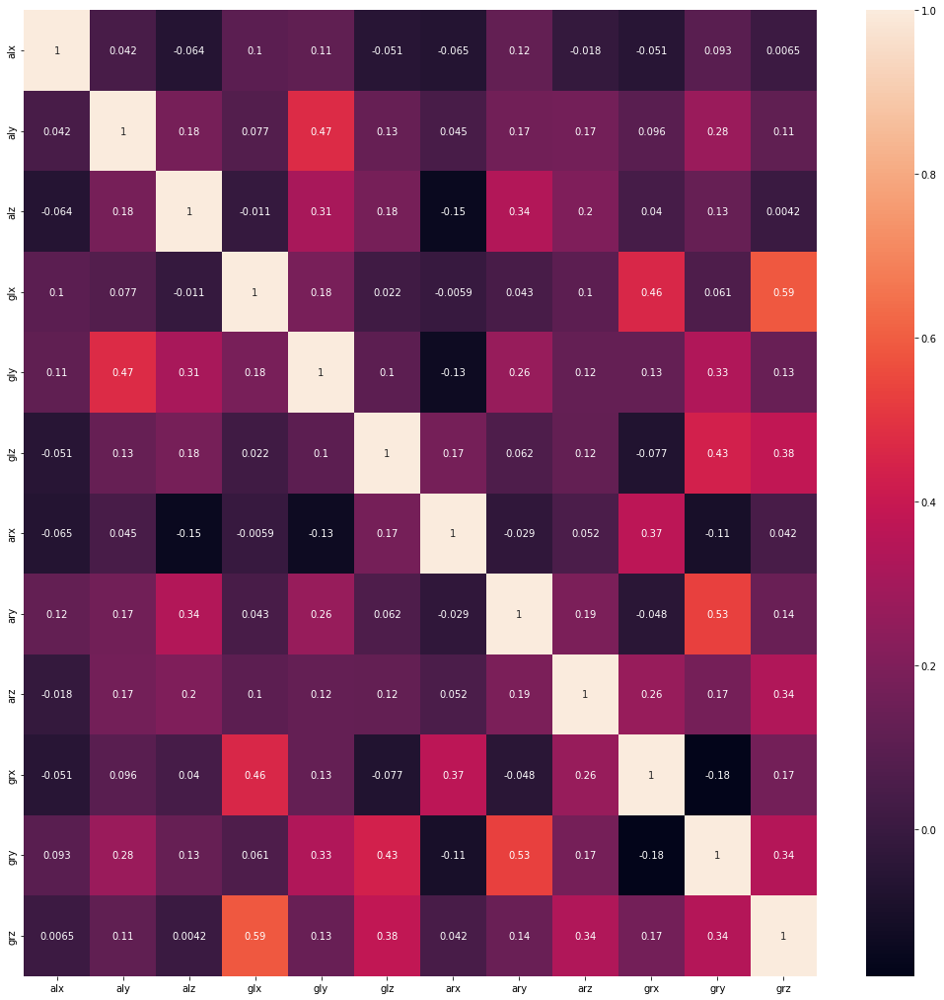

In [35]:
plt.subplots(figsize = (18, 18))
sns.heatmap(df.corr(), annot = True)

In [36]:
correlated_features = set()
correlation_matrix = df.corr()

In [37]:
for i in range(len(correlation_matrix .columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.5:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [38]:
len(correlated_features)

2

In [39]:
print(correlated_features)

{'gry', 'grz'}


In [40]:
df

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
647386,0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840,None,subject5
430596,1.35210,-10.3030,0.415050,0.03154,-0.85553,-0.591360,6.9453,-5.24430,5.57110,0.488240,-1.19710,0.105600,None,subject4
583321,0.29345,-9.9307,-0.993600,-0.10575,-0.79550,-0.699410,-7.7261,-1.80530,1.47220,-0.639220,-0.81930,-0.084052,None,subject5
204883,0.46130,-9.5558,0.860160,0.63265,-0.69043,0.196460,-3.2103,-8.88690,2.30570,0.066667,-0.74333,0.922410,None,subject2
603933,4.15710,-19.3350,-10.769000,0.76252,-0.51407,-0.471510,-4.0885,-1.98060,0.94264,-0.478430,-0.68583,0.767240,None,subject5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046268,1.85320,-10.3330,-3.581400,0.44341,-0.74296,-0.023576,3.3835,-5.98790,7.21100,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046269,1.72850,-10.5850,-4.064100,0.44341,-0.74296,-0.023576,3.6231,-9.53590,5.40860,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046270,0.12824,-10.5830,-2.861200,0.51577,-0.77486,-0.094303,3.2639,-7.56610,6.39250,0.870590,-0.40657,0.752160,Cycling (1 min),subject9
1046271,1.14530,-9.3572,-5.029300,0.51577,-0.77486,-0.094303,2.6024,-6.59550,6.45150,0.870590,-0.40657,0.752160,Cycling (1 min),subject9


In [41]:
df.columns

Index(['alx', 'aly', 'alz', 'glx', 'gly', 'glz', 'arx', 'ary', 'arz', 'grx',
       'gry', 'grz', 'Activity', 'subject'],
      dtype='object')

In [42]:
df.Activity.value_counts()

None                               40000
Standing still (1 min)             27648
Sitting and relaxing (1 min)       27648
Lying down (1 min)                 27648
Walking (1 min)                    27648
Cycling (1 min)                    27648
Frontal elevation of arms (20x)    26676
Knees bending (crouching) (20x)    26470
Waist bends forward (20x)          25857
Jogging (1 min)                    24576
Running (1 min)                    24576
Climbing stairs (1 min)            24576
Jump front & back (20x)             8243
Name: Activity, dtype: int64

## confident interval

In [43]:
#Dropping feature have data outside 98% confidence interval
df1 = df.copy()

for feature in df1.columns[:-2]:
    lower_range = np.quantile(df[feature],0.01)
    upper_range = np.quantile(df[feature],0.99)
    print(feature,'range:',lower_range,'to',upper_range)

    df1 = df1.drop(df1[(df1[feature]>upper_range) | (df1[feature]<lower_range)].index, axis=0)
    print('shape',df1.shape)

alx range: -10.829 to 18.13047999999998
shape (332429, 14)
aly range: -19.369 to 1.9134309999999939
shape (327296, 14)
alz range: -18.946 to 13.17973999999999
shape (324132, 14)
glx range: -0.7455881999999998 to 0.81076
shape (317970, 14)
gly range: -1.0432 to 0.97561
shape (312098, 14)
glz range: -1.0982 to 0.83104
shape (306884, 14)
arx range: -21.485 to 8.606391999999992
shape (302456, 14)
ary range: -18.685 to 11.622869999999995
shape (297059, 14)
arz range: -10.771609999999999 to 12.059
shape (294876, 14)
grx range: -1.0255 to 0.98824
shape (291683, 14)
gry range: -1.1417 to 0.93429
shape (286951, 14)
grz range: -0.7069 to 1.1293
shape (283034, 14)


In [44]:
df1.shape

(283034, 14)

In [45]:
df1

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
647386,0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840,None,subject5
583321,0.29345,-9.9307,-0.993600,-0.10575,-0.79550,-0.699410,-7.7261,-1.80530,1.47220,-0.639220,-0.81930,-0.084052,None,subject5
204883,0.46130,-9.5558,0.860160,0.63265,-0.69043,0.196460,-3.2103,-8.88690,2.30570,0.066667,-0.74333,0.922410,None,subject2
603933,4.15710,-19.3350,-10.769000,0.76252,-0.51407,-0.471510,-4.0885,-1.98060,0.94264,-0.478430,-0.68583,0.767240,None,subject5
374472,2.72770,-10.1450,-0.636220,-0.42115,-0.92871,-0.296660,-2.7245,-11.70300,3.71690,-0.417650,-1.00410,-0.170260,None,subject3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046268,1.85320,-10.3330,-3.581400,0.44341,-0.74296,-0.023576,3.3835,-5.98790,7.21100,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046269,1.72850,-10.5850,-4.064100,0.44341,-0.74296,-0.023576,3.6231,-9.53590,5.40860,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046270,0.12824,-10.5830,-2.861200,0.51577,-0.77486,-0.094303,3.2639,-7.56610,6.39250,0.870590,-0.40657,0.752160,Cycling (1 min),subject9
1046271,1.14530,-9.3572,-5.029300,0.51577,-0.77486,-0.094303,2.6024,-6.59550,6.45150,0.870590,-0.40657,0.752160,Cycling (1 min),subject9


In [46]:
df.Activity.value_counts()

None                               40000
Standing still (1 min)             27648
Sitting and relaxing (1 min)       27648
Lying down (1 min)                 27648
Walking (1 min)                    27648
Cycling (1 min)                    27648
Frontal elevation of arms (20x)    26676
Knees bending (crouching) (20x)    26470
Waist bends forward (20x)          25857
Jogging (1 min)                    24576
Running (1 min)                    24576
Climbing stairs (1 min)            24576
Jump front & back (20x)             8243
Name: Activity, dtype: int64

In [47]:
df1.subject.value_counts()

subject2    34650
subject4    34239
subject1    33405
subject3    32957
subject5    32737
subject8    31302
subject7    31292
subject6    26325
subject9    26127
Name: subject, dtype: int64

In [48]:
df.subject.value_counts()

subject1    41876
subject2    40519
subject3    39942
subject4    39739
subject5    38553
subject8    38503
subject7    38003
subject6    35640
subject9    26439
Name: subject, dtype: int64

In [49]:
df

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
647386,0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840,None,subject5
430596,1.35210,-10.3030,0.415050,0.03154,-0.85553,-0.591360,6.9453,-5.24430,5.57110,0.488240,-1.19710,0.105600,None,subject4
583321,0.29345,-9.9307,-0.993600,-0.10575,-0.79550,-0.699410,-7.7261,-1.80530,1.47220,-0.639220,-0.81930,-0.084052,None,subject5
204883,0.46130,-9.5558,0.860160,0.63265,-0.69043,0.196460,-3.2103,-8.88690,2.30570,0.066667,-0.74333,0.922410,None,subject2
603933,4.15710,-19.3350,-10.769000,0.76252,-0.51407,-0.471510,-4.0885,-1.98060,0.94264,-0.478430,-0.68583,0.767240,None,subject5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046268,1.85320,-10.3330,-3.581400,0.44341,-0.74296,-0.023576,3.3835,-5.98790,7.21100,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046269,1.72850,-10.5850,-4.064100,0.44341,-0.74296,-0.023576,3.6231,-9.53590,5.40860,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046270,0.12824,-10.5830,-2.861200,0.51577,-0.77486,-0.094303,3.2639,-7.56610,6.39250,0.870590,-0.40657,0.752160,Cycling (1 min),subject9
1046271,1.14530,-9.3572,-5.029300,0.51577,-0.77486,-0.094303,2.6024,-6.59550,6.45150,0.870590,-0.40657,0.752160,Cycling (1 min),subject9


In [50]:
df1

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
647386,0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840,None,subject5
583321,0.29345,-9.9307,-0.993600,-0.10575,-0.79550,-0.699410,-7.7261,-1.80530,1.47220,-0.639220,-0.81930,-0.084052,None,subject5
204883,0.46130,-9.5558,0.860160,0.63265,-0.69043,0.196460,-3.2103,-8.88690,2.30570,0.066667,-0.74333,0.922410,None,subject2
603933,4.15710,-19.3350,-10.769000,0.76252,-0.51407,-0.471510,-4.0885,-1.98060,0.94264,-0.478430,-0.68583,0.767240,None,subject5
374472,2.72770,-10.1450,-0.636220,-0.42115,-0.92871,-0.296660,-2.7245,-11.70300,3.71690,-0.417650,-1.00410,-0.170260,None,subject3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046268,1.85320,-10.3330,-3.581400,0.44341,-0.74296,-0.023576,3.3835,-5.98790,7.21100,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046269,1.72850,-10.5850,-4.064100,0.44341,-0.74296,-0.023576,3.6231,-9.53590,5.40860,0.870590,-0.40041,0.747840,Cycling (1 min),subject9
1046270,0.12824,-10.5830,-2.861200,0.51577,-0.77486,-0.094303,3.2639,-7.56610,6.39250,0.870590,-0.40657,0.752160,Cycling (1 min),subject9
1046271,1.14530,-9.3572,-5.029300,0.51577,-0.77486,-0.094303,2.6024,-6.59550,6.45150,0.870590,-0.40657,0.752160,Cycling (1 min),subject9


## Encoding

In [51]:
# transforming the datatype
df['subject'] = le.fit_transform(df['subject'])

In [52]:
df.dtypes

alx         float64
aly         float64
alz         float64
glx         float64
gly         float64
glz         float64
arx         float64
ary         float64
arz         float64
grx         float64
gry         float64
grz         float64
Activity     object
subject       int32
dtype: object

In [53]:
# transforming the datatype
df['Activity'] = le.fit_transform(df['Activity'])


In [54]:
df.dtypes

alx         float64
aly         float64
alz         float64
glx         float64
gly         float64
glz         float64
arx         float64
ary         float64
arz         float64
grx         float64
gry         float64
grz         float64
Activity      int32
subject       int32
dtype: object

In [55]:
for column in df.columns:
    print("--"*20)
    print(column+"\n")
    print(df[column].value_counts())

----------------------------------------
alx

19.59600    171
19.58600    152
19.57500    114
19.60600    109
19.61600     61
           ... 
6.66250       1
6.42400       1
7.01520       1
6.74040       1
0.12824       1
Name: alx, Length: 163224, dtype: int64
----------------------------------------
aly

-19.3380    439
-19.3280    236
-19.3780    185
-19.3480    180
-19.3580    157
           ... 
-6.6193       1
-6.8998       1
-7.2155       1
-7.6336       1
-7.9838       1
Name: aly, Length: 79601, dtype: int64
----------------------------------------
alz

-18.938000    255
-18.948000    218
-18.937000    146
-19.363000     93
-19.362000     66
             ... 
 0.069746       1
 0.756470       1
 0.926630       1
-0.376780       1
-5.029300       1
Name: alz, Length: 185585, dtype: int64
----------------------------------------
glx

 0.47495    1079
 0.44527    1028
 0.50278    1027
 0.50464    1013
 0.47124    1002
            ... 
 1.58070       1
 1.61600       1
-1.05190   

## checking for any outliers

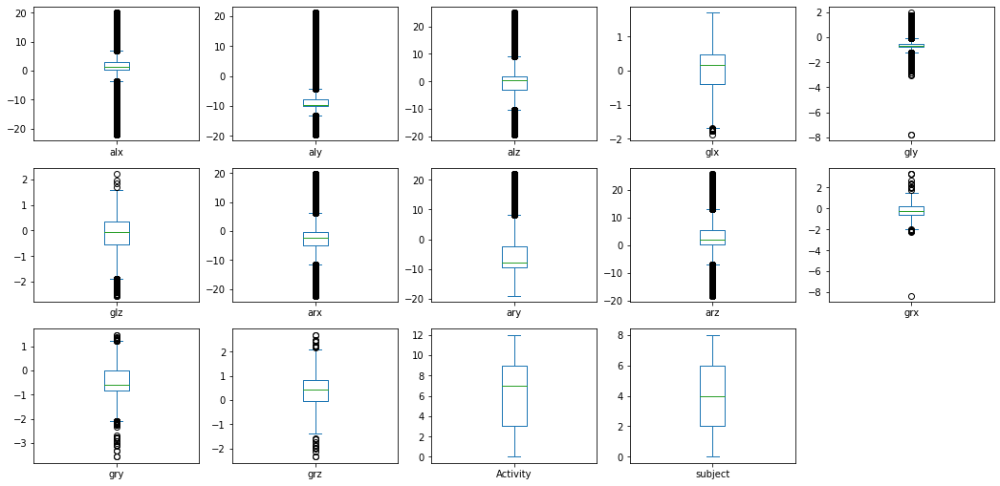

In [56]:
# drawing a box plots for all columns

df.plot(kind='box', subplots=True, layout=(5,5), figsize=(18,15))
plt.show()

### Train Test Split

In [57]:
# Split data between predictors and output variable
x = df.drop(['Activity', 'subject'], axis=1).values
y = df['Activity'].values

In [58]:
# Create train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [59]:
x_train.shape

(254410, 12)

In [60]:
x_test.shape

(84804, 12)

In [61]:
y_train.shape

(254410,)

In [62]:
x_train.shape

(254410, 12)

## Scalling using robust scaler

In [63]:
# Scale train/ test predictors based on training data
ro_scaler = RobustScaler().fit(x_train)
x_train_scaled = ro_scaler.transform(x_train)
x_test_scaled = ro_scaler.transform(x_test)

In [64]:
# Results summarizer function (scores, confusion matrix) for classification results
def resultsSummarizer(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    sensitivity = recall_score(y_true,y_pred,average='macro')
    
    
    plt.figure(figsize=(13, 12))
    
    sns.heatmap(cm,
                annot=True,
                cmap='Blues',
                xticklabels=activities_label.values(),
                yticklabels=activities_label.values()
               ) 
    
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Activity')
    plt.ylabel('Actual Activity')
    plt.show()
    
    print(f'Accuracy Score: ' + '{:.4%}'.format(acc))
    print(f'Precision Score: ' + '{:.4%}'.format(prec))
    print(f'Recall Score: ' + '{:.4%}'.format(rec))
    print(f'F_1 Score: ' + '{:.4%}'.format(f1))
    print('Sensitvity  = {}'.format(np.round(sensitivity,3)))


## Logistic Regression

In [65]:
lr = LogisticRegression()

In [66]:
lr.fit(x_train , y_train)

LogisticRegression()

In [67]:
lr.score(x_train , y_train)

0.528658464682992

In [68]:
lr.score(x_test , y_test)

0.526590726852507

In [69]:
lr2=LogisticRegression()

In [70]:
lr2.fit(x_train_scaled,y_train)

LogisticRegression()

In [71]:
lr2.score(x_train_scaled , y_train)

0.525179827836956

In [72]:
lr2.score(x_test_scaled , y_test)

0.5239375501155605

In [73]:
y_pred_lr = lr.predict(x_test_scaled)

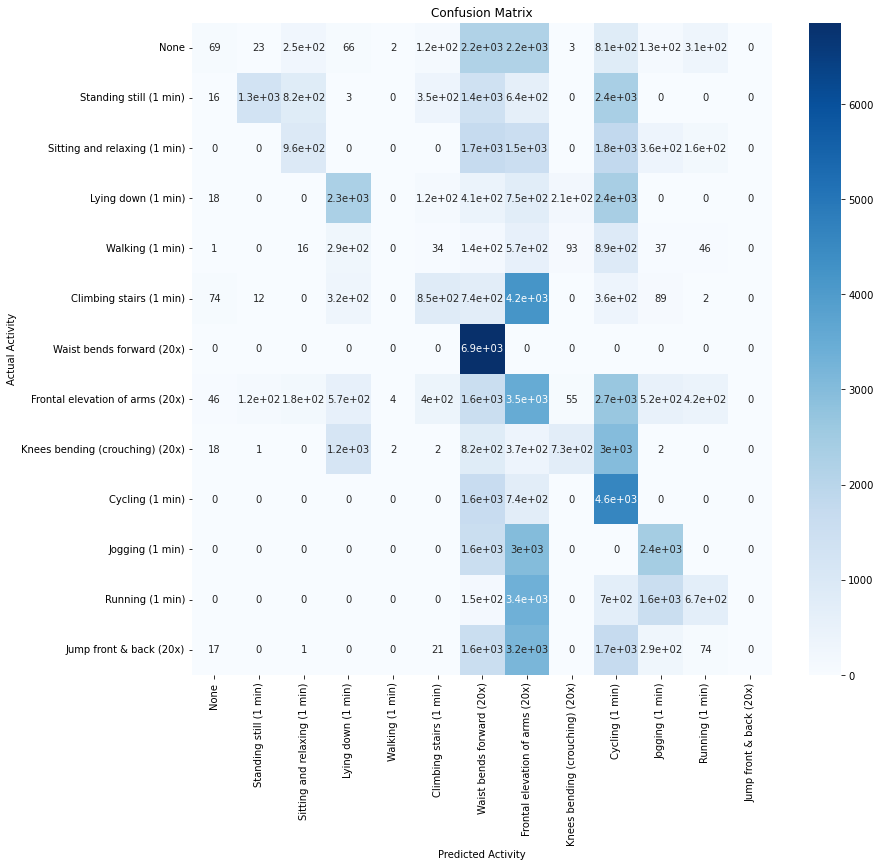

Accuracy Score: 28.5847%
Precision Score: 36.3726%
Recall Score: 26.3179%
F_1 Score: 22.7304%
Sensitvity  = 0.263


In [74]:
resultsSummarizer(y_test, y_pred_lr)

## KNN

In [75]:
k1=KNeighborsClassifier(n_neighbors=5)

In [76]:
k1.fit(x_train,y_train)

KNeighborsClassifier()

In [77]:
k1.score(x_train,y_train)

0.9118470185920364

In [78]:
k1.score(x_test,y_test)

0.8808664685628036

In [79]:
y_pred=lr.predict(x_test)
data=pd.DataFrame({'y_Test  ':y_test,'y_pred  ':y_pred})
data[:20]

,y_Test,y_pred
0,2,2
1,12,10
2,11,11
3,7,6
4,7,5
5,5,5
6,2,12
7,0,7
8,12,12
9,8,3


In [80]:
k2 = KNeighborsClassifier(n_neighbors=5)
k2.fit(x_train_scaled, y_train)
y_pred_knn = k2.predict(x_test_scaled)

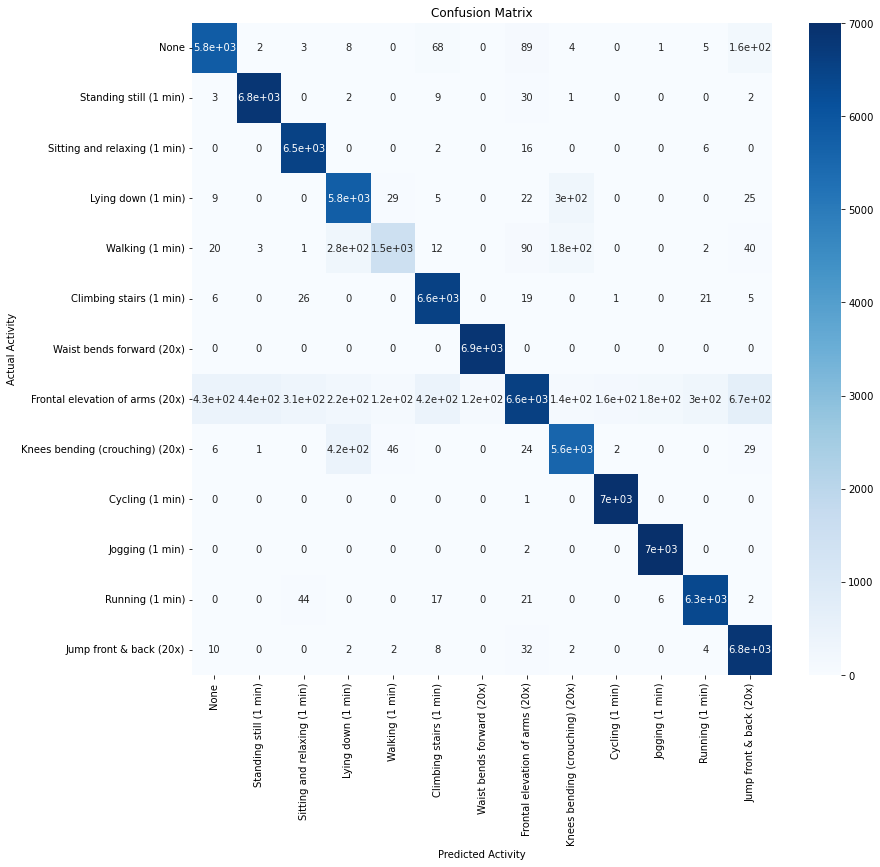

Accuracy Score: 93.2763%
Precision Score: 92.9510%
Recall Score: 93.1132%
F_1 Score: 92.6786%
Sensitvity  = 0.931


In [81]:
resultsSummarizer(y_test, y_pred_knn)

## Decision Tree

In [82]:
dt=DecisionTreeClassifier(max_depth=14)

In [83]:
dt.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=14)

In [84]:
dt.score(x_train,y_train)

0.8878699736645572

In [85]:
dt.score(x_test,y_test)

0.8652893731427763

In [86]:
dt.fit(x_train_scaled, y_train)
y_pred_tree = dt.predict(x_test_scaled)

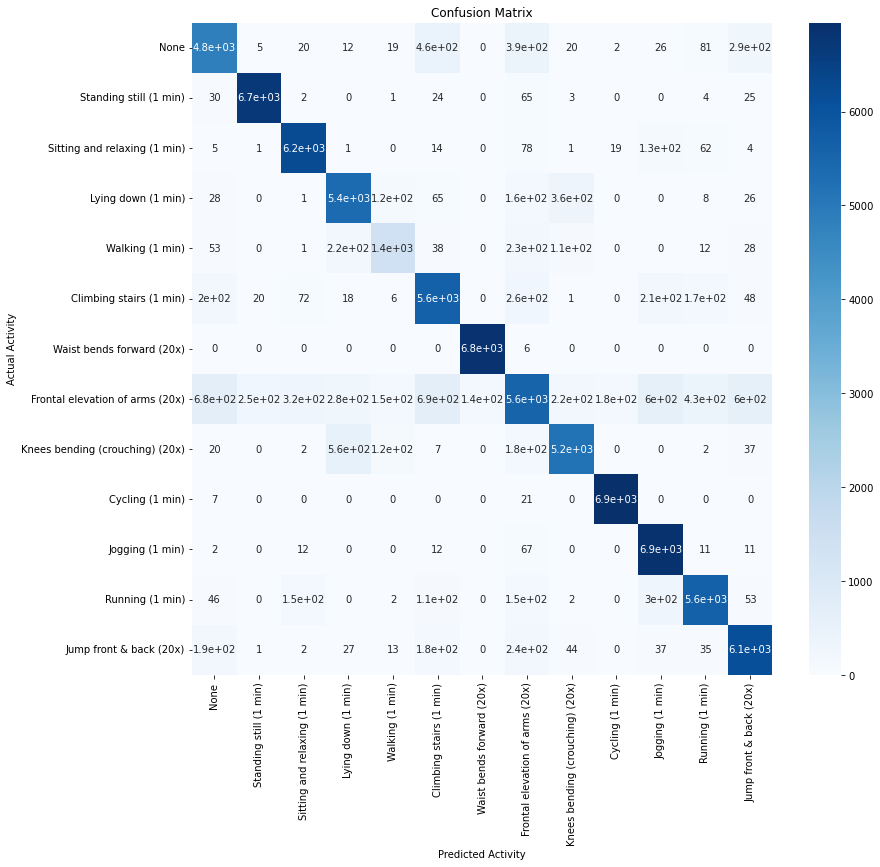

Accuracy Score: 86.5372%
Precision Score: 86.0217%
Recall Score: 86.5849%
F_1 Score: 86.0920%
Sensitvity  = 0.866


In [87]:
resultsSummarizer(y_test, y_pred_tree)

## Random Forest Classification

In [88]:
rf=RandomForestClassifier(max_depth=5)

In [89]:
rf.fit(x_train,y_train)

RandomForestClassifier(max_depth=5)

In [90]:
rf.score(x_train,y_train)

0.6636177823198773

In [91]:
rf.score(x_test,y_test)

0.6600278288759964

In [92]:
rfst = RandomForestClassifier(random_state=42, n_estimators=200, max_depth=None, min_samples_leaf=1, min_samples_split=2)
rfst.fit(x_train_scaled, y_train)
y_pred_rfst = rfst.predict(x_test_scaled)

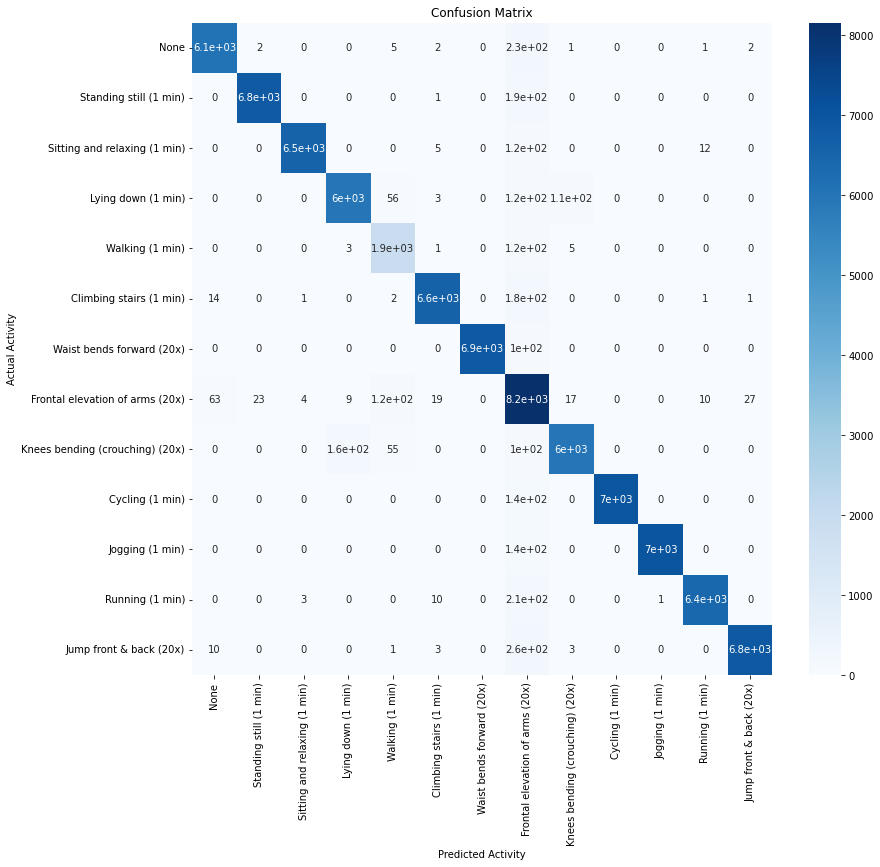

Accuracy Score: 96.8362%
Precision Score: 97.0319%
Recall Score: 96.6346%
F_1 Score: 96.7629%
Sensitvity  = 0.966


In [93]:
resultsSummarizer(y_pred_rfst, y_test)

## Grid Search

In [94]:
C_grid = 0.02*np.arange(1,20)
gamma_grid = 0.02*np.arange(1,50)
print(C_grid,gamma_grid)
parameters = {'C': C_grid, 'gamma' : gamma_grid}
gridCV = GridSearchCV(SVC(kernel='rbf'), parameters, n_jobs=-1)             
gridCV.fit(x_train[:1000],y_train[:1000])
best_C = gridCV.best_params_['C']
best_gamma = gridCV.best_params_['gamma']

print("Best C "+str(best_C))
print("Best Gamma "+str(best_gamma))

[0.02 0.04 0.06 0.08 0.1  0.12 0.14 0.16 0.18 0.2  0.22 0.24 0.26 0.28
 0.3  0.32 0.34 0.36 0.38] [0.02 0.04 0.06 0.08 0.1  0.12 0.14 0.16 0.18 0.2  0.22 0.24 0.26 0.28
 0.3  0.32 0.34 0.36 0.38 0.4  0.42 0.44 0.46 0.48 0.5  0.52 0.54 0.56
 0.58 0.6  0.62 0.64 0.66 0.68 0.7  0.72 0.74 0.76 0.78 0.8  0.82 0.84
 0.86 0.88 0.9  0.92 0.94 0.96 0.98]
Best C 0.38
Best Gamma 0.04


In [95]:
### Modelling using SVM kernel

#### Linear

In [96]:
lin = SVC(kernel='linear',C=best_C,gamma=best_gamma)
lin.fit(x_train[0:10000], y_train[0:10000])

SVC(C=0.38, gamma=0.04, kernel='linear')

In [97]:
y_pred_Linear = lin.predict(x_test)
print(classification_report(y_test, y_pred_Linear))

              precision    recall  f1-score   support

           0       0.46      0.34      0.39      6153
           1       0.77      0.94      0.85      6871
           2       0.74      0.77      0.76      6551
           3       0.60      0.65      0.62      6154
           4       0.63      0.12      0.20      2117
           5       0.54      0.62      0.58      6630
           6       0.97      1.00      0.98      6855
           7       0.33      0.19      0.24     10079
           8       0.62      0.67      0.64      6094
           9       0.83      0.89      0.86      6975
          10       0.62      0.99      0.76      7006
          11       0.68      0.67      0.68      6439
          12       0.60      0.53      0.56      6880

    accuracy                           0.66     84804
   macro avg       0.65      0.64      0.62     84804
weighted avg       0.64      0.66      0.64     84804



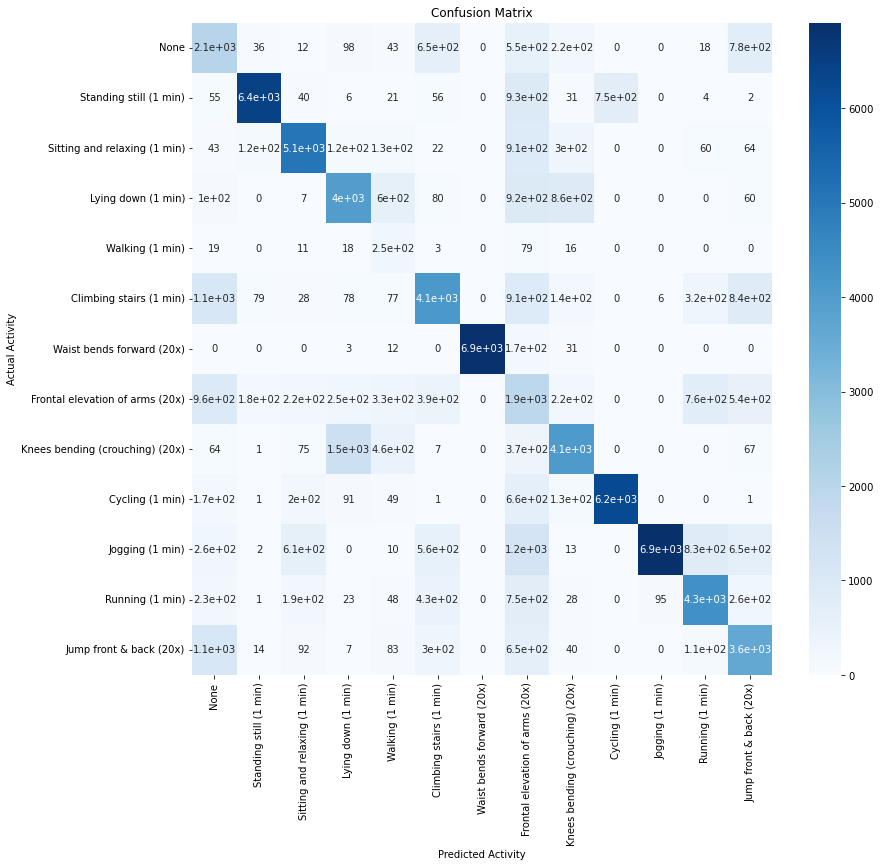

Accuracy Score: 65.8554%
Precision Score: 64.3584%
Recall Score: 64.5729%
F_1 Score: 62.4445%
Sensitvity  = 0.646


In [98]:
resultsSummarizer(y_pred_Linear, y_test)

## RBF

In [99]:
rbf = SVC(kernel='rbf',C=1,gamma=0.6)
rbf.fit(x_train[0:10000], y_train[0:10000])

y_pred_RBF = rbf.predict(x_test)
print(classification_report(y_test, y_pred_RBF))

              precision    recall  f1-score   support

           0       0.82      0.36      0.50      6153
           1       0.95      0.46      0.62      6871
           2       0.94      0.78      0.85      6551
           3       0.94      0.03      0.06      6154
           4       0.00      0.00      0.00      2117
           5       0.85      0.59      0.70      6630
           6       0.98      1.00      0.99      6855
           7       0.22      0.82      0.34     10079
           8       0.92      0.02      0.04      6094
           9       0.98      1.00      0.99      6975
          10       0.95      1.00      0.98      7006
          11       0.90      0.80      0.85      6439
          12       0.89      0.43      0.58      6880

    accuracy                           0.61     84804
   macro avg       0.80      0.56      0.58     84804
weighted avg       0.82      0.61      0.61     84804



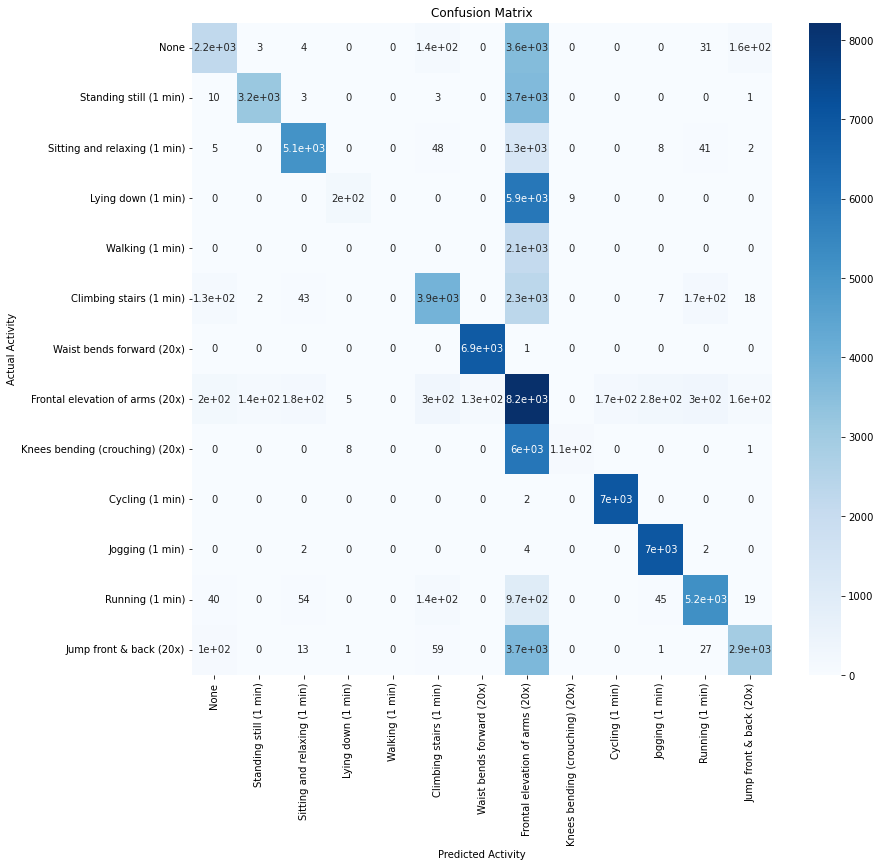

Accuracy Score: 61.1681%
Precision Score: 79.6067%
Recall Score: 56.0477%
F_1 Score: 57.6546%
Sensitvity  = 0.56


In [100]:
resultsSummarizer(y_test, y_pred_RBF)

## Polynomial Svc

In [101]:
poly = SVC(kernel='poly',degree=3)
poly.fit(x_train[0:10000], y_train[0:10000])
y_pred_Poly = poly.predict(x_test)
print(classification_report(y_test, y_pred_Poly))

              precision    recall  f1-score   support

           0       0.43      0.44      0.44      6153
           1       0.84      0.91      0.87      6871
           2       0.79      0.78      0.78      6551
           3       0.72      0.64      0.68      6154
           4       0.58      0.13      0.21      2117
           5       0.55      0.64      0.59      6630
           6       0.95      1.00      0.98      6855
           7       0.40      0.25      0.31     10079
           8       0.78      0.73      0.76      6094
           9       0.80      0.89      0.84      6975
          10       0.51      0.91      0.65      7006
          11       0.62      0.67      0.64      6439
          12       0.71      0.46      0.56      6880

    accuracy                           0.67     84804
   macro avg       0.67      0.65      0.64     84804
weighted avg       0.66      0.67      0.65     84804



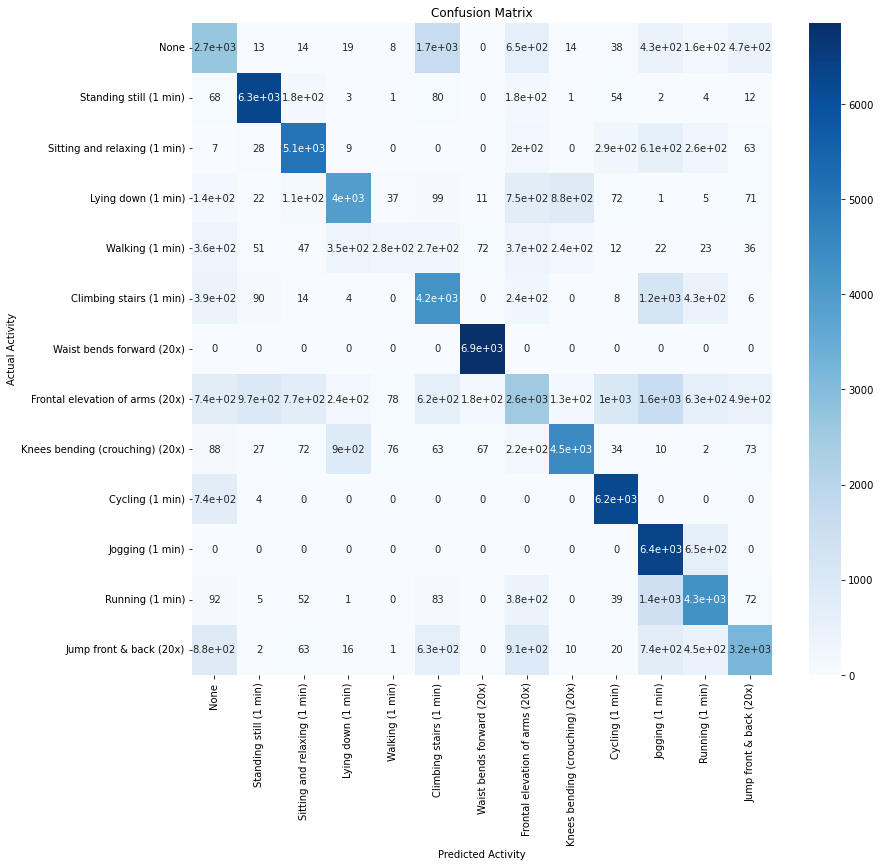

Accuracy Score: 66.5570%
Precision Score: 66.7641%
Recall Score: 65.0194%
F_1 Score: 63.9565%
Sensitvity  = 0.65


In [102]:
resultsSummarizer(y_test, y_pred_Poly)

## Gaussian

In [103]:
GNB = GaussianNB()
GNB.fit(x_train,y_train)
y_pred_Gauss = GNB.predict(x_test)

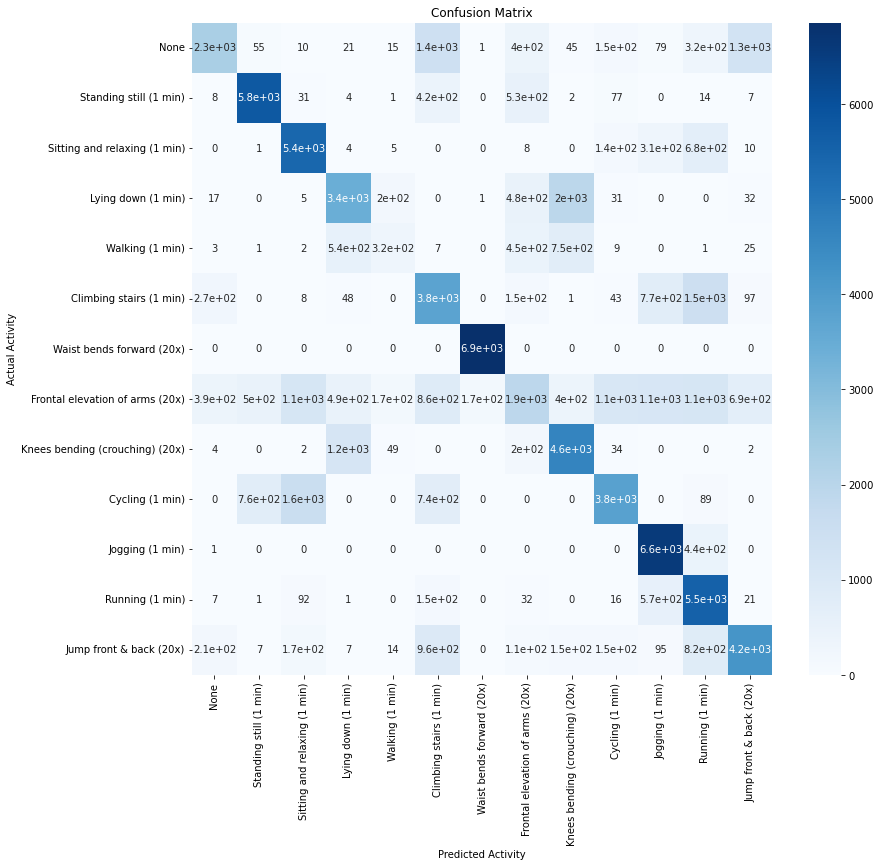

Accuracy Score: 64.3319%
Precision Score: 63.1922%
Recall Score: 63.2894%
F_1 Score: 61.1927%
Sensitvity  = 0.633


In [104]:
resultsSummarizer(y_test, y_pred_Gauss)

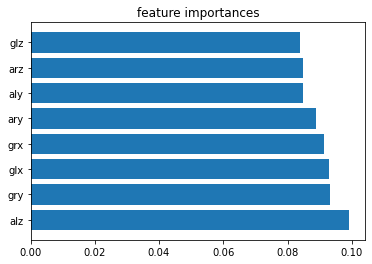

In [105]:
def f_importances(coef, names, top=-1):
    imp = coef
    imp, names = zip(*sorted(list(zip(imp, names))))

    # Show all features
    if top == -1:
        top = len(names)

    plt.barh(range(top), imp[::-1][0:top], align='center')
    plt.yticks(range(top), names[::-1][0:top])
    plt.title('feature importances')
    plt.show()

# whatever your features are called
features_names = ['alx', 'aly', 'alz', 'glx', 'gly',
       'glz', 'arx', 'ary','arz','grx','gry','grz','subject']
    
rfst = RandomForestClassifier(random_state=42, n_estimators=200, max_depth=None, min_samples_leaf=1, min_samples_split=2)

rfst.fit(x_train_scaled,y_train)

# Specify your top n features you want to visualize.
# You can also discard the abs() function 
# if you are interested in negative contribution of features
f_importances(abs(rfst.feature_importances_), features_names, top=8)

In [106]:
df

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
647386,0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840,7,4
430596,1.35210,-10.3030,0.415050,0.03154,-0.85553,-0.591360,6.9453,-5.24430,5.57110,0.488240,-1.19710,0.105600,7,3
583321,0.29345,-9.9307,-0.993600,-0.10575,-0.79550,-0.699410,-7.7261,-1.80530,1.47220,-0.639220,-0.81930,-0.084052,7,4
204883,0.46130,-9.5558,0.860160,0.63265,-0.69043,0.196460,-3.2103,-8.88690,2.30570,0.066667,-0.74333,0.922410,7,1
603933,4.15710,-19.3350,-10.769000,0.76252,-0.51407,-0.471510,-4.0885,-1.98060,0.94264,-0.478430,-0.68583,0.767240,7,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046268,1.85320,-10.3330,-3.581400,0.44341,-0.74296,-0.023576,3.3835,-5.98790,7.21100,0.870590,-0.40041,0.747840,1,8
1046269,1.72850,-10.5850,-4.064100,0.44341,-0.74296,-0.023576,3.6231,-9.53590,5.40860,0.870590,-0.40041,0.747840,1,8
1046270,0.12824,-10.5830,-2.861200,0.51577,-0.77486,-0.094303,3.2639,-7.56610,6.39250,0.870590,-0.40657,0.752160,1,8
1046271,1.14530,-9.3572,-5.029300,0.51577,-0.77486,-0.094303,2.6024,-6.59550,6.45150,0.870590,-0.40657,0.752160,1,8


In [107]:
rfst.predict([[0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840]])


array([8])

In [108]:
Active_predict = np.array( [[ 0.86296,-9.7223,0.043346,-0.31354,-0.44278,-0.066798,-8.6341,-0.92223,-5.22320,-0.113730,-0.10267,-0.372840]])
Active_predict

array([[ 0.86296 , -9.7223  ,  0.043346, -0.31354 , -0.44278 , -0.066798,
        -8.6341  , -0.92223 , -5.2232  , -0.11373 , -0.10267 , -0.37284 ]])

In [109]:
import pickle

data = {"model": rfst}
with open('Predict_model.pkl', 'wb') as file:
    pickle.dump(data, file)
    
with open('Predict_model.pkl', 'rb') as file:
    data = pickle.load(file)    
    
rfst_loaded = data["model"]
Card_predict = rfst_loaded.predict(Active_predict)
Card_predict

array([8])

## Thank You 